# 💻 Installation

PyCaret is tested and supported on the following 64-bit systems:
- Python 3.7 – 3.10
- Python 3.9 for Ubuntu only
- Ubuntu 16.04 or later
- Windows 7 or later

You can install PyCaret with Python's pip package manager:

`pip install pycaret`

PyCaret's default installation will not install all the extra dependencies automatically. For that you will have to install the full version:

`pip install pycaret[full]`

or depending on your use-case you may install one of the following variant:

- `pip install pycaret[analysis]`
- `pip install pycaret[models]`
- `pip install pycaret[tuner]`
- `pip install pycaret[mlops]`
- `pip install pycaret[parallel]`
- `pip install pycaret[test]`

In [1]:
# install pycaret
#!pip install pycaret[full]

# check installed version
import pycaret 
pycaret.__version__

'3.0.4'

# 🚀 Quick start

PyCaret's time series forecasting module is now available. The module currently is suitable for univariate / multivariate time series forecasting tasks. The API of time series module is consistent with other modules of PyCaret.

It comes built-in with preprocessing capabilities and over 30 algorithms comprising of statistical / time-series methods as well as machine learning based models. In addition to the model training, this module has lot of other capabilities such as automated hyperparameter tuning, ensembling, model analysis, model packaging and deployment capabilities. 

A typical workflow in PyCaret consist of following 5 steps in this order:

### **Setup** ➡️ **Compare Models** ➡️ **Analyze Model** ➡️ **Prediction** ➡️ **Save Model** <br/>

In [2]:
# import pandas module
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt

# global variables
Soil_humi = []
Resistance = []
Soil_temp = []
total_amount = 0
rolling_mean_window_data = 15
rolling_mean_window_grouped = 5
min_length_df = 250 #was 50
slope_irrigation = -0.08
tension_threshold = 7
sample_rate = 10 #in min

# creating a data frame
data = pd.read_csv("binned_removed_new.csv",header=0)
data.head()

# create array with sensors strings
for col in data.columns:
    if re.findall(r"SoilHumiditySensor$", col):
        Soil_humi.append(col)
    elif re.findall(r"\/ $", col):
        Resistance.append(col)
    elif re.findall(r"SoilThermometer$", col):
        Soil_temp.append(col)

# print them to check
for i in range(len(Soil_humi)):
    total_amount += 1
    print(Soil_humi[i])
for i in range(len(Resistance)):
    total_amount += 1
    print(Resistance[i])
for i in range(len(Soil_temp)):
    total_amount += 1
    print(Soil_temp[i])
    
print("Total amount of values: ", total_amount)

638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor
638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor
638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor
638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance / 
638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance / 
638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance / 
638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer
638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer
Total amount of values:  8


<Axes: >

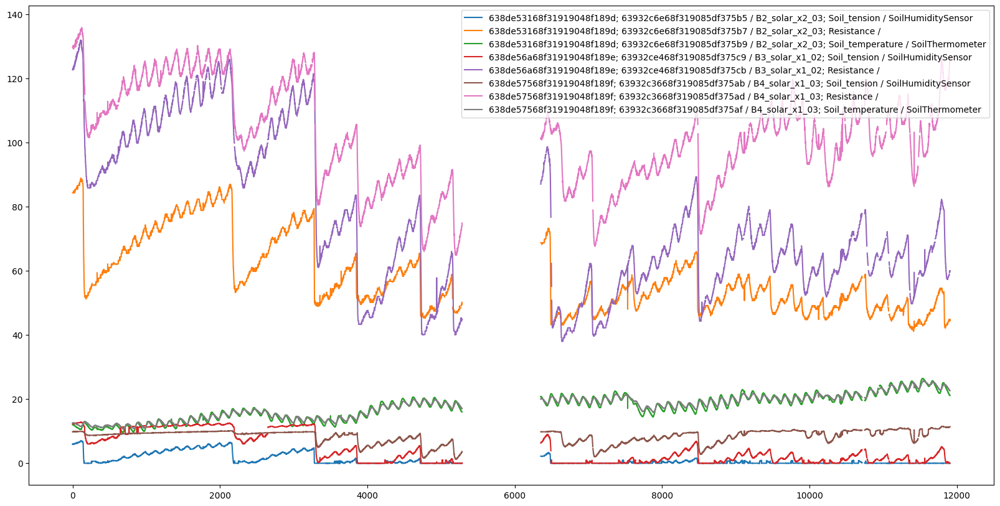

In [3]:
# plot the dataset
data.plot(figsize = (20,10))

In [4]:
# Show if there are any missing values inside the data
data.isna().any()

Time                                                                                                       False
638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor      True
638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /                           True
638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer     True
638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor      True
638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /                           True
638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor      True
638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /                           True
638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilTher

array([<Axes: xlabel='Time'>, <Axes: xlabel='Time'>,
       <Axes: xlabel='Time'>, <Axes: xlabel='Time'>,
       <Axes: xlabel='Time'>, <Axes: xlabel='Time'>,
       <Axes: xlabel='Time'>, <Axes: xlabel='Time'>], dtype=object)

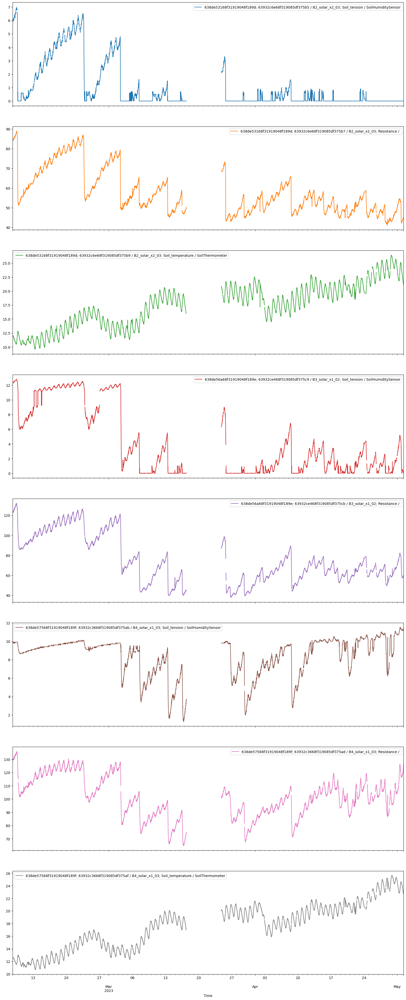

In [5]:
data['Time'] = data['Time'].str[:-9]
data['Time']=pd.to_datetime(data['Time'])
data = data.set_index('Time')

data.plot(subplots=True, figsize=(20,50))

In [6]:
data.loc['2023-03-24 22:00:00':]

,638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor,638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /,638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer,638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor,638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor,638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer
Time,,,,,,,,
2023-03-24 22:00:00,2.2,68.7,20.5,6.6,88.2,9.8,100.9,20.1
2023-03-24 22:10:00,2.1,68.3,20.5,6.6,88.2,9.8,101.4,20.1
2023-03-24 22:20:00,2.2,68.7,20.4,6.6,88.2,9.8,101.4,20.1
2023-03-24 22:30:00,2.2,68.7,20.4,6.8,89.3,9.8,101.4,20.1
2023-03-24 22:40:00,2.2,68.7,20.4,6.8,89.3,9.8,102.4,20.1
...,...,...,...,...,...,...,...,...
2023-05-02 08:20:00,0.0,44.8,21.2,0.0,60.0,11.3,125.4,22.7
2023-05-02 08:30:00,0.0,44.8,21.2,0.0,59.5,11.3,125.0,22.7
2023-05-02 08:40:00,0.0,44.3,21.1,0.0,60.0,11.4,126.1,22.6


array([<Axes: xlabel='Time'>, <Axes: xlabel='Time'>,
       <Axes: xlabel='Time'>, <Axes: xlabel='Time'>,
       <Axes: xlabel='Time'>, <Axes: xlabel='Time'>,
       <Axes: xlabel='Time'>, <Axes: xlabel='Time'>], dtype=object)

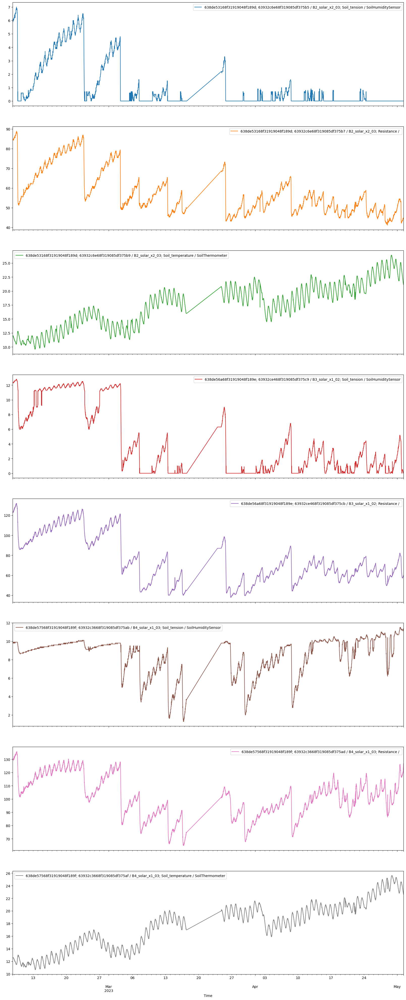

In [7]:
#data = data.fillna(method = 'bfill')
data = data.interpolate(method='linear')
data.plot(subplots=True, figsize=(20,50))

In [8]:
# resample using timespan of 30min -> hopefully reduces overfitting
if sample_rate != 10:
    data_re = data.resample(str(sample_rate)+'T').median()
    data = data_re

## Weather data from station on site

In [9]:
# creating a data frame
data_weather = pd.read_csv("april_weather.csv", header=0, sep=";")
data_weather.head()

,NO.,Heure,Intervalle,Température intérieure(°C),Humidité intérieure(%),Température extérieure(°C),Humidité extérieure(%),Pression relative(hpa),Pression absolue(hpa),Vitesse du vent(km/h),...,Direction du vent,Point de rosée(°C),Facteur vent(°C),Précipitations dernière heure(mm),Précipitations dernières 24 h(mm),Précipitations de la semaine(mm),Précipitations du mois(mm),Précipitations totales(mm),Lumière(lux),UVI
0,1,01/04/2023 00:03:43,5,15.6,41,10.2,58,1015.6,953.3,2.5,...,W,2.3,10.2,0.0,0.0,7.5,0.0,14.4,0.0,0
1,2,01/04/2023 00:08:43,5,15.6,41,10.3,58,1015.5,953.2,3.6,...,NW,2.4,10.3,0.0,0.0,7.5,0.0,14.4,0.0,0
2,3,01/04/2023 00:13:43,5,15.5,40,10.4,55,1015.5,953.2,2.5,...,W,1.8,10.4,0.0,0.0,7.5,0.0,14.4,0.0,0
3,4,01/04/2023 00:18:43,5,15.5,40,10.3,54,1015.6,953.3,3.6,...,W,1.4,10.3,0.0,0.0,7.5,0.0,14.4,0.0,0
4,5,01/04/2023 00:23:43,5,15.5,40,10.3,54,1015.5,953.2,3.6,...,NW,1.4,10.3,0.0,0.0,7.5,0.0,14.4,0.0,0


In [10]:
# Convert the datetime column to a datetime object
data_weather['Heure'] = pd.to_datetime(data_weather['Heure'], format=' %d/%m/%Y %H:%M:%S')#, errors='coerce')
#print("After datetime, before ISO:  \n", data_weather, "\n", data_weather.dtypes, "\n")

# Format the datetime object as an ISO time string
data_weather['Heure'] = data_weather['Heure'].dt.strftime('%Y-%m-%dT%H:%M:%S')

#change name
data_weather = data_weather.rename(columns={'Heure':'Time'})

# change datatype
data_weather['Time'] = pd.to_datetime(data_weather['Time'])

# set the index of the DataFrame to the timestamp column
data_weather = data_weather.set_index('Time')

In [11]:
# Drop useless
data_weather = data_weather.drop(['Température intérieure(°C)', 'Humidité intérieure(%)', 'Intervalle', 'NO.', 'Pression relative(hpa)', 'Rafale(km/h)', 'Point de rosée(°C)', 'UVI'], axis=1)#, 'Précipitations dernière heure(mm)', 'Précipitations de la semaine(mm)', 'Précipitations du mois(mm)', 'Précipitations totales(mm)'], axis=1)

Wenn es darum geht, den nächsten Bewässerungszeitpunkt für ein Feld im Freien vorherzusagen, kann die Einbeziehung des relativen Luftdrucks sinnvoller sein. Hier sind einige Gründe:

Wettervorhersage: Der relative Luftdruck ist ein wichtiger Faktor bei der Wettervorhersage und wird häufig in Wetterberichten und -vorhersagen verwendet. Er kann Ihnen helfen, Veränderungen in den atmosphärischen Bedingungen zu erkennen, die auf Wetteränderungen hindeuten könnten. Dies kann bei der Entscheidung für den Bewässerungszeitpunkt hilfreich sein, da bestimmte Wetterbedingungen die Bewässerungsanforderungen beeinflussen können.

Einfluss auf Pflanzen: Veränderungen im Luftdruck können auch Auswirkungen auf Pflanzen haben. Beispielsweise kann ein plötzlicher Anstieg oder Abfall des Luftdrucks auf Wetteränderungen wie Stürme oder Wetterfronten hinweisen. Solche Veränderungen können den Wasserbedarf der Pflanzen beeinflussen und somit den optimalen Bewässerungszeitpunkt beeinflussen.

Kombination mit anderen Daten: Der relative Luftdruck kann auch mit anderen Umweltdaten wie Temperatur, Luftfeuchtigkeit und Niederschlag kombiniert werden, um ein umfassenderes Bild der atmosphärischen Bedingungen zu erhalten. Dies kann zur Verbesserung der Vorhersage des Bewässerungszeitpunkts beitragen.

----------------------------------------
Bei der Auswahl der Niederschlagsmessungen für Ihr Training könnten Sie sich auf eine oder mehrere Messungen konzentrieren, die am besten zu Ihrem Anwendungsfall passen. Hier sind einige Optionen, die Sie in Betracht ziehen könnten:

Précipitations dernière heure (Niederschlag der letzten Stunde): Diese Messung könnte relevant sein, um den aktuellen Niederschlag zu berücksichtigen und möglicherweise kurzfristige Änderungen im Bewässerungsbedarf zu erkennen. Wenn Sie jedoch andere Messungen bevorzugen, die eine längere Zeitspanne abdecken, könnten Sie diese ausschließen.

Précipitations dernières 24 h (Niederschlag der letzten 24 Stunden): Dies ist eine gängige und relevante Messung für den Bewässerungsbedarf. Sie gibt Auskunft über den Niederschlag in den letzten 24 Stunden und ermöglicht eine Einschätzung des längerfristigen Feuchtigkeitszustands des Bodens.

Précipitations de la semaine (Niederschlag der letzten Woche): Diese Messung könnte interessant sein, um den kumulierten Niederschlag über die Woche hinweg zu berücksichtigen. Sie kann helfen, den längerfristigen Feuchtigkeitsverlauf zu verstehen und den Bewässerungsbedarf anzupassen.

Précipitations du mois (Niederschlag des aktuellen Monats): Wenn Sie den Niederschlag über einen längeren Zeitraum betrachten möchten, kann diese Messung nützlich sein. Sie kann Ihnen helfen, den saisonalen Feuchtigkeitsverlauf zu verstehen und den Bewässerungsbedarf entsprechend anzupassen.

Précipitations totales (Gesamtniederschlag): Diese Messung erfasst den kumulierten Niederschlag über einen längeren Zeitraum, möglicherweise seit Beginn der Datenerfassung. Sie kann nützlich sein, um den historischen Niederschlagstrend zu berücksichtigen und mögliche Muster im Bewässerungsbedarf zu identifizieren.

In Bezug auf das Training könnten Sie entweder eine einzelne Niederschlagsmessung auswählen, die am besten zu Ihrem Anwendungsfall passt, oder verschiedene Kombinationen von Messungen ausprobieren, um ihre Auswirkungen auf die Vorhersageleistung des Modells zu bewerten. Es kann hilfreich sein, verschiedene Konfigurationen zu testen und die beste Auswahl basierend auf den Bewertungsmetriken des Modells zu treffen.






In [12]:
data_weather.head()

,Température extérieure(°C),Humidité extérieure(%),Pression absolue(hpa),Vitesse du vent(km/h),Direction du vent,Facteur vent(°C),Précipitations dernière heure(mm),Précipitations dernières 24 h(mm),Précipitations de la semaine(mm),Précipitations du mois(mm),Précipitations totales(mm),Lumière(lux)
Time,,,,,,,,,,,,
2023-04-01 00:03:43,10.2,58,953.3,2.5,W,10.2,0.0,0.0,7.5,0.0,14.4,0.0
2023-04-01 00:08:43,10.3,58,953.2,3.6,NW,10.3,0.0,0.0,7.5,0.0,14.4,0.0
2023-04-01 00:13:43,10.4,55,953.2,2.5,W,10.4,0.0,0.0,7.5,0.0,14.4,0.0
2023-04-01 00:18:43,10.3,54,953.3,3.6,W,10.3,0.0,0.0,7.5,0.0,14.4,0.0
2023-04-01 00:23:43,10.3,54,953.2,3.6,NW,10.3,0.0,0.0,7.5,0.0,14.4,0.0


In [13]:
# Convert wind direction to integer
directions = [" N", " NNE", " NE", " ENE", " E", " ESE", " SE", " SSE", " S", " SSW", " SW", " WSW", " W", " WNW", " NW", " NNW"]
target_col = 'Direction du vent'

for index, value in data_weather[target_col].iteritems():
    # Calculate wind direction in degrees -> TODO : convert to int and round
    if value == " ---":
        data_weather[target_col][index] = np.nan
    else:
        data_weather[target_col][index] = directions.index(value) * 22.5
        
data_weather[target_col] = data_weather[target_col].astype("float64")

In [14]:
# convert to float64
def convert_cols(data,ref_dtype):
    obj_dtype = 'object'
    
    for col in data.columns:
        if data[col].dtype == obj_dtype:
            data[col] = pd.to_numeric(data[col], errors='coerce')
        print("This is :",col, "it has the following dtype: ", data[col].dtype)

convert_cols(data_weather, 'float64')

This is : Température extérieure(°C) it has the following dtype:  float64
This is : Humidité extérieure(%) it has the following dtype:  float64
This is : Pression absolue(hpa) it has the following dtype:  float64
This is : Vitesse du vent(km/h) it has the following dtype:  float64
This is : Direction du vent it has the following dtype:  float64
This is : Facteur vent(°C) it has the following dtype:  float64
This is : Précipitations dernière heure(mm) it has the following dtype:  float64
This is : Précipitations dernières 24 h(mm) it has the following dtype:  float64
This is : Précipitations de la semaine(mm) it has the following dtype:  float64
This is : Précipitations du mois(mm) it has the following dtype:  float64
This is : Précipitations totales(mm) it has the following dtype:  float64
This is : Lumière(lux) it has the following dtype:  float64


In [15]:
# preserve old datetimeindex
timestamps = data_weather.index
data_weather.reset_index(drop=True)

,Température extérieure(°C),Humidité extérieure(%),Pression absolue(hpa),Vitesse du vent(km/h),Direction du vent,Facteur vent(°C),Précipitations dernière heure(mm),Précipitations dernières 24 h(mm),Précipitations de la semaine(mm),Précipitations du mois(mm),Précipitations totales(mm),Lumière(lux)
0,10.2,58.0,953.3,2.5,270.0,10.2,0.0,0.0,7.5,0.0,14.4,0.0
1,10.3,58.0,953.2,3.6,315.0,10.3,0.0,0.0,7.5,0.0,14.4,0.0
2,10.4,55.0,953.2,2.5,270.0,10.4,0.0,0.0,7.5,0.0,14.4,0.0
3,10.3,54.0,953.3,3.6,270.0,10.3,0.0,0.0,7.5,0.0,14.4,0.0
4,10.3,54.0,953.2,3.6,315.0,10.3,0.0,0.0,7.5,0.0,14.4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1855,28.8,30.0,946.2,3.6,225.0,28.8,0.0,0.3,0.3,0.3,14.7,47827.6
1856,24.0,59.0,946.3,9.7,90.0,23.0,1.2,1.5,1.5,1.5,15.9,30108.6
1857,19.9,80.0,947.4,0.0,315.0,19.9,0.9,2.4,2.4,2.4,16.8,536.0
1858,20.1,74.0,949.0,1.1,0.0,20.1,0.0,2.4,2.4,2.4,16.8,0.0


In [16]:
# TODO: compare them with orig data
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import BayesianRidge, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

# Init the transformer
reg_imp = IterativeImputer(estimator=Ridge())

# Fit/transform
data_weather = pd.DataFrame(reg_imp.fit_transform(data_weather), columns=data_weather.columns)

# restore old index
data_weather['Time'] = timestamps
data_weather = data_weather.set_index('Time')
data_weather.index = pd.to_datetime(data_weather.index)

In [17]:
#ref_dtype = 'float64'
# iterate through the columns and compare their data types to the reference data type
#for col in data_weather.columns:
#    print("This is :",col)
#    if data_weather[col].dtype == 'datetime64[ns]':
#        data_weather[col] = data_weather[col].resample('10T').ffill()
#    if data_weather[col].dtype == ref_dtype:
#        data_weather[col] = data_weather[col].resample('10T').mean()
#    else:
#        data_weather[col] = data_weather[col].resample('10T').ffill()

In [18]:
data_weather.head()

,Température extérieure(°C),Humidité extérieure(%),Pression absolue(hpa),Vitesse du vent(km/h),Direction du vent,Facteur vent(°C),Précipitations dernière heure(mm),Précipitations dernières 24 h(mm),Précipitations de la semaine(mm),Précipitations du mois(mm),Précipitations totales(mm),Lumière(lux)
Time,,,,,,,,,,,,
2023-04-01 00:03:43,10.2,58.0,953.3,2.5,270.0,10.2,0.0,0.0,7.5,0.0,14.4,0.0
2023-04-01 00:08:43,10.3,58.0,953.2,3.6,315.0,10.3,0.0,0.0,7.5,0.0,14.4,0.0
2023-04-01 00:13:43,10.4,55.0,953.2,2.5,270.0,10.4,0.0,0.0,7.5,0.0,14.4,0.0
2023-04-01 00:18:43,10.3,54.0,953.3,3.6,270.0,10.3,0.0,0.0,7.5,0.0,14.4,0.0
2023-04-01 00:23:43,10.3,54.0,953.2,3.6,315.0,10.3,0.0,0.0,7.5,0.0,14.4,0.0


In [19]:
data_weather_re = data_weather.resample(str(sample_rate)+'T').fillna(method = 'bfill') #TODO: fill with mean!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
data_weather_re.index

DatetimeIndex(['2023-04-01 00:00:00', '2023-04-01 00:10:00',
               '2023-04-01 00:20:00', '2023-04-01 00:30:00',
               '2023-04-01 00:40:00', '2023-04-01 00:50:00',
               '2023-04-01 01:00:00', '2023-04-01 01:10:00',
               '2023-04-01 01:20:00', '2023-04-01 01:30:00',
               ...
               '2023-04-30 21:20:00', '2023-04-30 21:30:00',
               '2023-04-30 21:40:00', '2023-04-30 21:50:00',
               '2023-04-30 22:00:00', '2023-04-30 22:10:00',
               '2023-04-30 22:20:00', '2023-04-30 22:30:00',
               '2023-04-30 22:40:00', '2023-04-30 22:50:00'],
              dtype='datetime64[ns]', name='Time', length=4314, freq='10T')

In [20]:
data_weather_re.dtypes

Température extérieure(°C)           float64
Humidité extérieure(%)               float64
Pression absolue(hpa)                float64
Vitesse du vent(km/h)                float64
Direction du vent                    float64
Facteur vent(°C)                     float64
Précipitations dernière heure(mm)    float64
Précipitations dernières 24 h(mm)    float64
Précipitations de la semaine(mm)     float64
Précipitations du mois(mm)           float64
Précipitations totales(mm)           float64
Lumière(lux)                         float64
dtype: object

## Weather API as Source
Here we use the API of open-meteo.com. 

In [21]:
import subprocess
import json
from datetime import date

lattitude, longitude = 35.222866, 9.090245
start_date, end_date = '2022-12-08', '2023-07-04'
today = date.today()

def get_historical_weather_api(lattitude, longitude, start_date, end_date):
    dct = subprocess.check_output(['curl', f'https://archive-api.open-meteo.com/v1/era5?latitude={lattitude}&longitude={longitude}&start_date={start_date}&end_date={today.strftime("%Y-%m-%d")}&hourly=temperature_2m,relativehumidity_2m,rain,cloudcover,shortwave_radiation,windspeed_10m,winddirection_10m,soil_temperature_7_to_28cm,soil_moisture_0_to_7cm,et0_fao_evapotranspiration']).decode()
    dct = json.loads(dct)
    # I also convert it to a pandas dataframe
    
    data = (pd.DataFrame([dct['hourly']['temperature_2m'], 
                          dct['hourly']['relativehumidity_2m'], 
                          dct['hourly']['rain'], 
                          dct['hourly']['cloudcover'], 
                          dct['hourly']['shortwave_radiation'],
                          dct['hourly']['windspeed_10m'], 
                          dct['hourly']['winddirection_10m'], 
                          dct['hourly']['soil_temperature_7_to_28cm'], 
                          dct['hourly']['soil_moisture_0_to_7cm'], 
                          dct['hourly']['et0_fao_evapotranspiration'],
                          dct['hourly']['time']], 
                         index = ['Temperature', 'Humidity', 'Rain', 'Cloudcover', 'Shortwave_Radiation', 'Windspeed', 'Winddirection', 'Soil_temperature_7-28', 'Soil_moisture_0-7', 'Et0_evapotranspiration', 'date'])
            .T
            .assign(date = lambda x : pd.to_datetime(x.date, format='%Y-%m-%dT%H:%M'))
            .set_index(['date']).dropna())

    return data

data_weather_api = get_historical_weather_api(lattitude, longitude, start_date, end_date)

In [22]:
today.strftime("%y-%m-%d")

'23-09-11'

In [23]:
data_weather_api.tail(20)

,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration
date,,,,,,,,,,
2023-09-04 04:00:00,17.9,87,0.0,8,0.0,1.8,281,25.2,0.212,0.0
2023-09-04 05:00:00,17.5,88,0.0,2,0.0,1.8,281,24.9,0.211,0.0
2023-09-04 06:00:00,18.9,81,0.0,0,57.0,2.2,261,24.7,0.211,0.02
2023-09-04 07:00:00,23.4,56,0.0,0,237.0,3.4,212,24.6,0.211,0.15
2023-09-04 08:00:00,26.8,37,0.0,0,443.0,5.2,196,24.8,0.211,0.32
2023-09-04 09:00:00,29.5,29,0.0,0,630.0,6.1,183,24.9,0.21,0.47
2023-09-04 10:00:00,31.8,25,0.0,0,774.0,5.1,184,25.1,0.209,0.59
2023-09-04 11:00:00,33.8,22,0.0,1,862.0,3.6,180,25.4,0.208,0.66
2023-09-04 12:00:00,35.3,21,0.0,3,886.0,2.5,135,25.8,0.206,0.67


In [24]:
convert_cols(data_weather_api, 'float64')

This is : Temperature it has the following dtype:  float64
This is : Humidity it has the following dtype:  int64
This is : Rain it has the following dtype:  float64
This is : Cloudcover it has the following dtype:  int64
This is : Shortwave_Radiation it has the following dtype:  float64
This is : Windspeed it has the following dtype:  float64
This is : Winddirection it has the following dtype:  int64
This is : Soil_temperature_7-28 it has the following dtype:  float64
This is : Soil_moisture_0-7 it has the following dtype:  float64
This is : Et0_evapotranspiration it has the following dtype:  float64


In [25]:
# Fill is not as good as interpolate -> do not use
data_weather_api = data_weather_api.resample(str(sample_rate)+'T')#.fillna(method = 'bfill') #TODO: fill with mean!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

# Convert cols datatype to float64


# Interpolate missing values using linear interpolation
data_weather_api = data_weather_api.interpolate(method='linear')
data_weather_api.index

DatetimeIndex(['2022-12-08 00:00:00', '2022-12-08 00:10:00',
               '2022-12-08 00:20:00', '2022-12-08 00:30:00',
               '2022-12-08 00:40:00', '2022-12-08 00:50:00',
               '2022-12-08 01:00:00', '2022-12-08 01:10:00',
               '2022-12-08 01:20:00', '2022-12-08 01:30:00',
               ...
               '2023-09-04 21:30:00', '2023-09-04 21:40:00',
               '2023-09-04 21:50:00', '2023-09-04 22:00:00',
               '2023-09-04 22:10:00', '2023-09-04 22:20:00',
               '2023-09-04 22:30:00', '2023-09-04 22:40:00',
               '2023-09-04 22:50:00', '2023-09-04 23:00:00'],
              dtype='datetime64[ns]', name='date', length=39019, freq='10T')

In [26]:
data_weather_api.tail(20)

,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration
date,,,,,,,,,,
2023-09-04 19:50:00,26.600000,46.666667,0.0,0.000000,0.0,7.966667,84.833333,27.500000,0.202,0.065000
2023-09-04 20:00:00,26.300000,48.000000,0.0,0.000000,0.0,7.600000,85.000000,27.500000,0.202,0.060000
2023-09-04 20:10:00,26.066667,49.000000,0.0,0.166667,0.0,7.116667,84.333333,27.483333,0.202,0.053333
2023-09-04 20:20:00,25.833333,50.000000,0.0,0.333333,0.0,6.633333,83.666667,27.466667,0.202,0.046667
2023-09-04 20:30:00,25.600000,51.000000,0.0,0.500000,0.0,6.150000,83.000000,27.450000,0.202,0.040000
2023-09-04 20:40:00,25.366667,52.000000,0.0,0.666667,0.0,5.666667,82.333333,27.433333,0.202,0.033333
2023-09-04 20:50:00,25.133333,53.000000,0.0,0.833333,0.0,5.183333,81.666667,27.416667,0.202,0.026667
2023-09-04 21:00:00,24.900000,54.000000,0.0,1.000000,0.0,4.700000,81.000000,27.400000,0.202,0.020000
2023-09-04 21:10:00,24.716667,54.666667,0.0,1.166667,0.0,4.600000,80.000000,27.383333,0.202,0.018333


In [27]:
data_weather_api.isna().any()

Temperature               False
Humidity                  False
Rain                      False
Cloudcover                False
Shortwave_Radiation       False
Windspeed                 False
Winddirection             False
Soil_temperature_7-28     False
Soil_moisture_0-7         False
Et0_evapotranspiration    False
dtype: bool

In [28]:
# concatenate the DataFrames vertically
#data_comb = pd.concat([data, data_weather_re], axis=0)
data_comb = pd.merge(data, data_weather_api, left_index=True, right_index=True, how='outer')

# print the resulting DataFrame
data_comb.tail(10)

,638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor,638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /,638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer,638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor,638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor,638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration
2023-09-04 21:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.350000,56.000000,0.0,1.500000,0.0,4.400000,78.0,27.350000,0.202,0.015000
2023-09-04 21:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.166667,56.666667,0.0,1.666667,0.0,4.300000,77.0,27.333333,0.202,0.013333
2023-09-04 21:50:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.983333,57.333333,0.0,1.833333,0.0,4.200000,76.0,27.316667,0.202,0.011667
2023-09-04 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.800000,58.000000,0.0,2.000000,0.0,4.100000,75.0,27.300000,0.202,0.010000
2023-09-04 22:10:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.650000,58.666667,0.0,2.500000,0.0,3.783333,64.0,27.283333,0.202,0.008333
2023-09-04 22:20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.500000,59.333333,0.0,3.000000,0.0,3.466667,53.0,27.266667,0.202,0.006667
2023-09-04 22:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.350000,60.000000,0.0,3.500000,0.0,3.150000,42.0,27.250000,0.202,0.005000
2023-09-04 22:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.200000,60.666667,0.0,4.000000,0.0,2.833333,31.0,27.233333,0.202,0.003333
2023-09-04 22:50:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.050000,61.333333,0.0,4.500000,0.0,2.516667,20.0,27.216667,0.202,0.001667
2023-09-04 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.900000,62.000000,0.0,5.000000,0.0,2.200000,9.0,27.200000,0.202,0.000000


<Axes: >

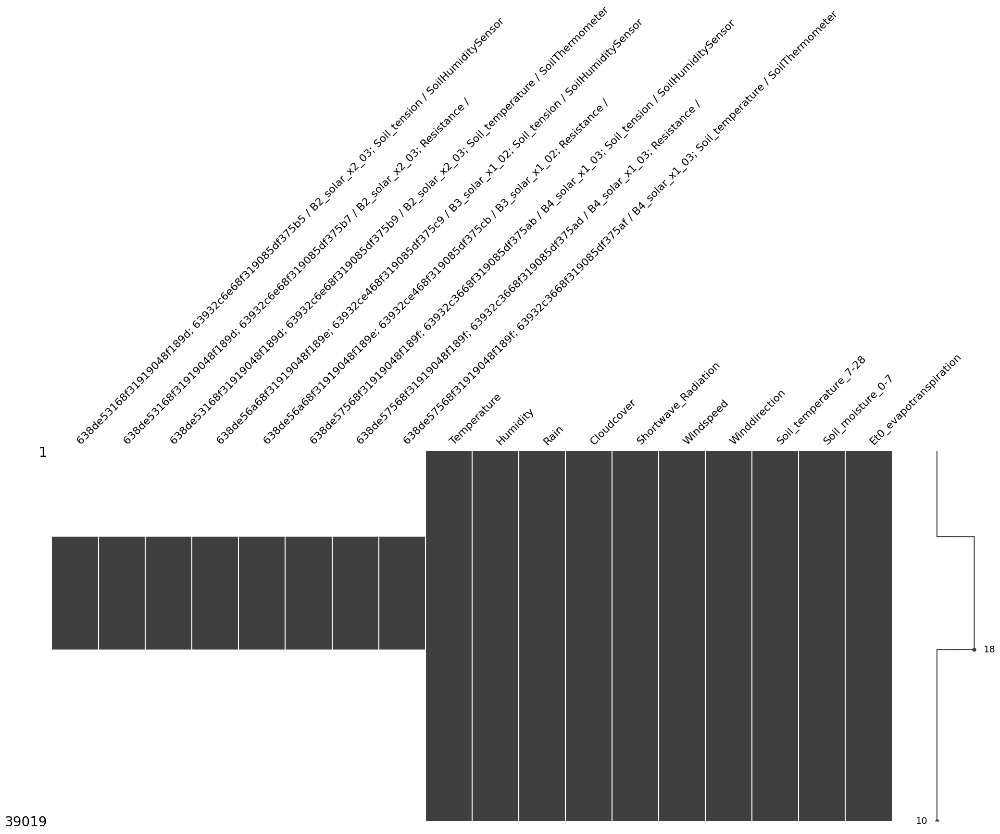

In [29]:
import missingno as msno 
# Plot correlation heatmap of missingness
msno.matrix(data_comb)

In [30]:
data.tail()

,638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor,638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /,638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer,638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor,638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor,638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer
Time,,,,,,,,
2023-05-02 08:20:00,0.0,44.8,21.2,0.0,60.0,11.3,125.4,22.7
2023-05-02 08:30:00,0.0,44.8,21.2,0.0,59.5,11.3,125.0,22.7
2023-05-02 08:40:00,0.0,44.3,21.1,0.0,60.0,11.4,126.1,22.6
2023-05-02 08:50:00,0.0,44.8,21.1,0.0,60.0,11.4,126.7,22.6
2023-05-02 09:00:00,0.0,44.8,21.1,0.0,60.0,11.4,126.3,22.6


In [31]:
# Select the rows between two dates => cut dataframe
start_date = '2023-03-24 22:00:00'#str(data_weather_re.index[0])
end_date = str(data.index[-1])#str(data_weather_re.index[-1])
data_comb_cut = data_comb.loc[start_date:end_date]

data = data_comb_cut

<Axes: >

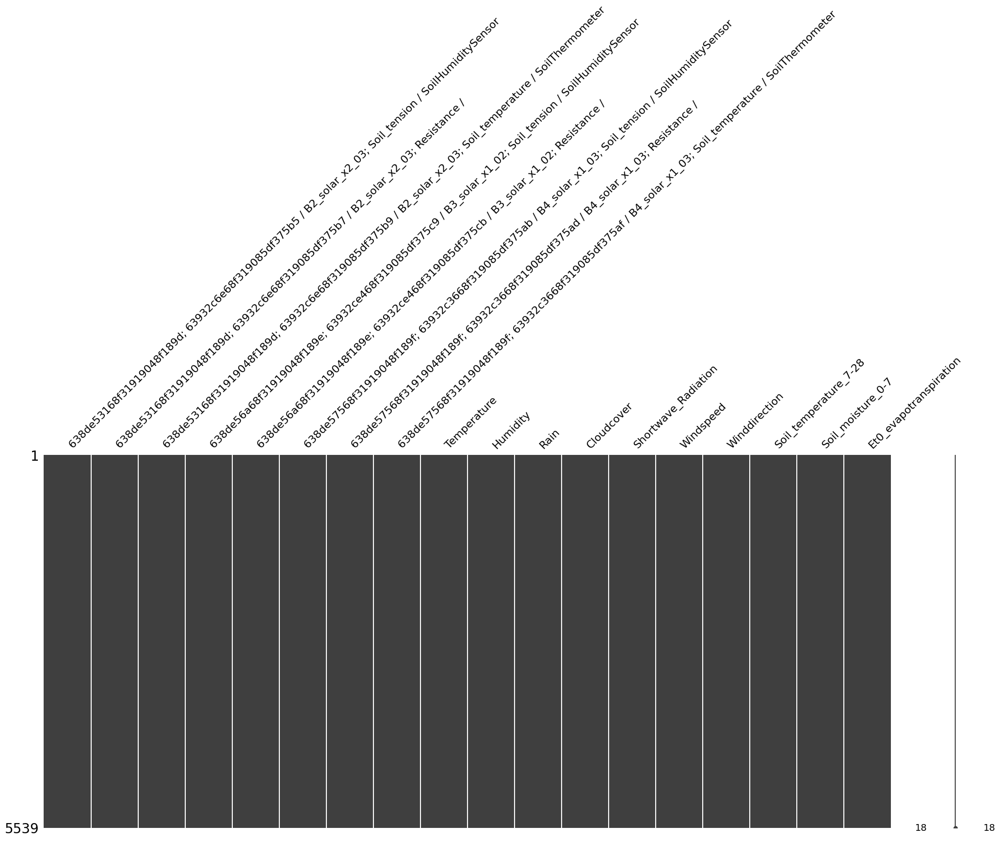

In [32]:
msno.matrix(data)

In [33]:
print("Dataframe starts at:", data.index[0], "and ends at:",data.index[-1])

Dataframe starts at: 2023-03-24 22:00:00 and ends at: 2023-05-02 09:00:00


<Axes: >

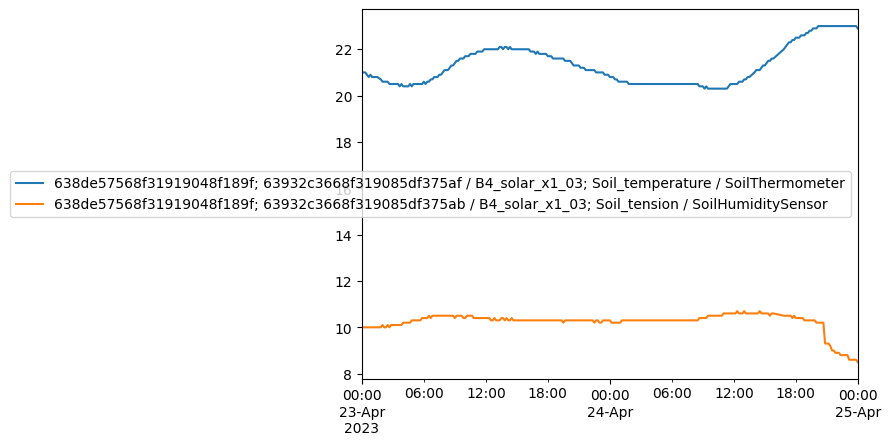

In [34]:
data[['638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer','638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor']].loc['2023-04-23 00:00:00':'2023-04-25 00:00:00'].plot()

In [35]:
data.dtypes

638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor     float64
638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /                          float64
638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer    float64
638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor     float64
638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /                          float64
638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor     float64
638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /                          float64
638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer    float64
Temperature                                                                     

In [36]:
ref_dtype = 'float64'
obj_dtype = 'object'

for col in data.columns:
    if data[col].dtype == obj_dtype:
        data[col] = pd.to_numeric(data[col], errors='coerce')
    #if data[col].dtype == ref_dtype:
        #data[col] = data[col].rolling(window=rolling_mean_window_data, win_type='gaussian').mean(std=rolling_mean_window_data)
        
    print("This is :",col, "it has the following dtype: ", data[col].dtype)

This is : 638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor it has the following dtype:  float64
This is : 638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /  it has the following dtype:  float64
This is : 638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer it has the following dtype:  float64
This is : 638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor it has the following dtype:  float64
This is : 638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /  it has the following dtype:  float64
This is : 638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor it has the following dtype:  float64
This is : 638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /  it has the following dtype:  float64
This is :

<Axes: >

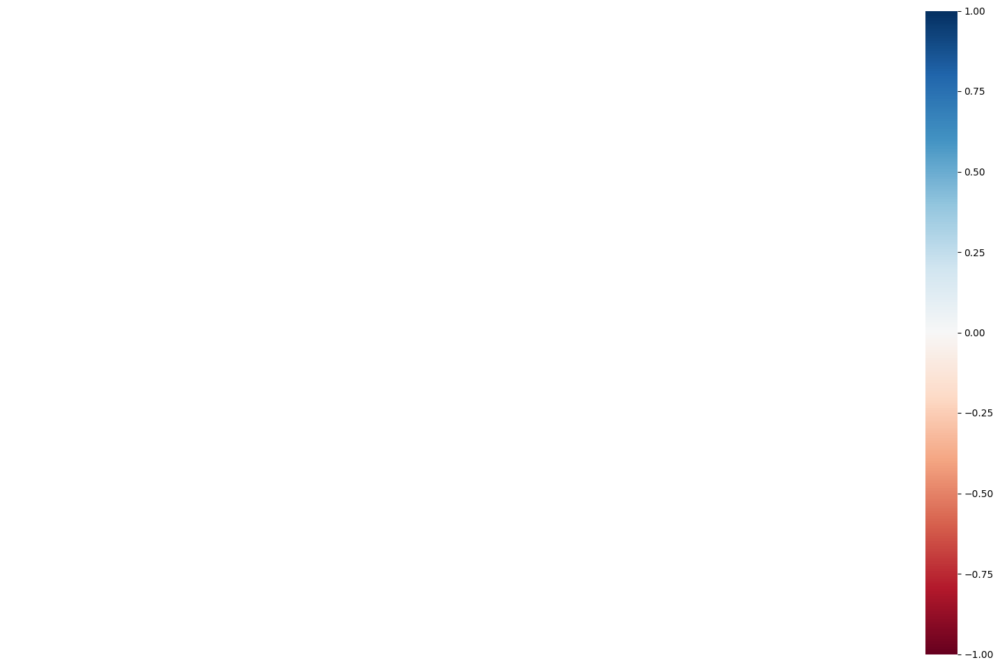

In [37]:
msno.heatmap(data)

<Axes: >

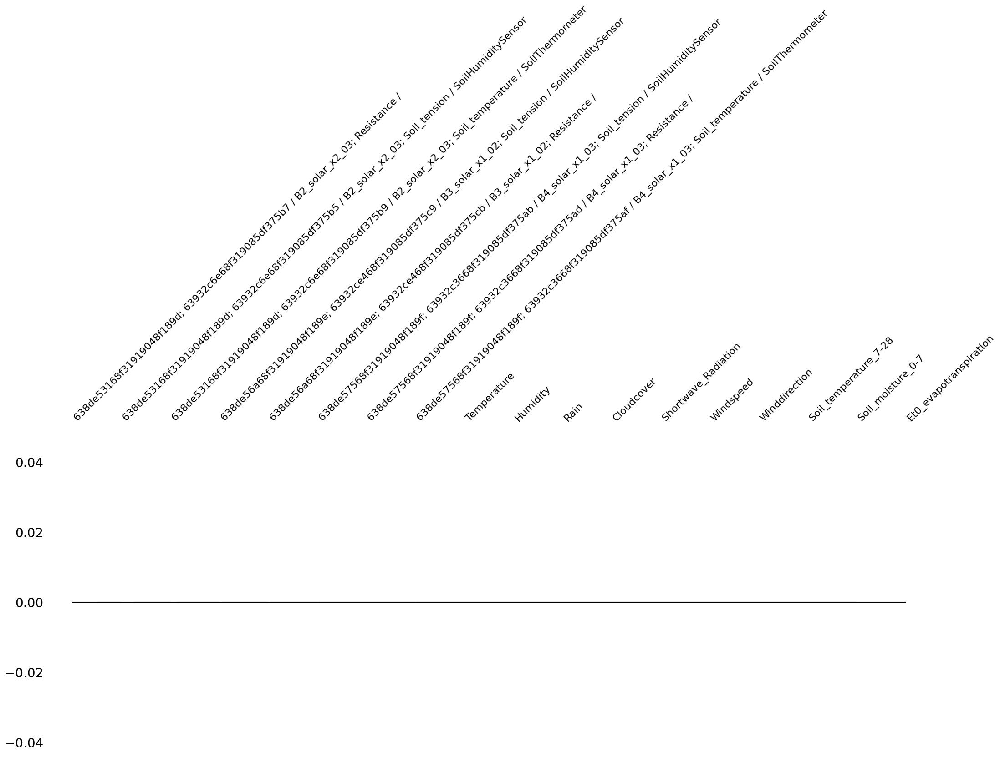

In [38]:
msno.dendrogram(data)

In [39]:
data.isna().any()

638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor     False
638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /                          False
638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer    False
638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor     False
638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /                          False
638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor     False
638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /                          False
638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer    False
Temperature                                                                                     

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
      dtype=object)

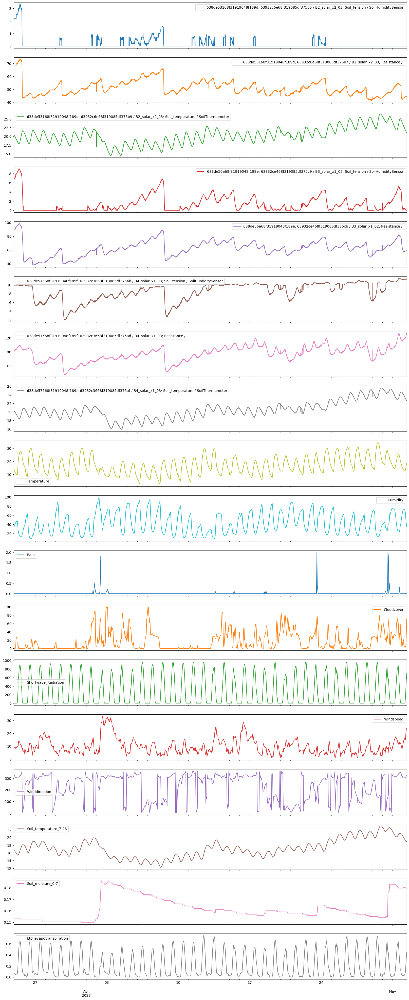

In [40]:
data.plot(subplots=True, figsize=(20,50))

We can use the following estimators:
-----------------------------------
LinearRegression: LinearRegression

BayesianRidge: Regularized linear regression.

DecisionTreeRegressor: Decision tree regression. => no

ExtraTreesRegressor: Extremely randomized trees regression. => slow

KNeighborsRegressor: k-Nearest Neighbors regression. => no

RandomForestRegressor: Random forest regression. => slow

Ridge: Linear least squares with l2 regularization. => best?

SVR: Support vector regression. => slow, no

In [41]:
# TODO: compare them with orig data

# Fit/transform
#for col in data.columns:
#    # Init the transformer
#    reg_imp = IterativeImputer(estimator=SVR())
#    # Fit/transform
#    data_imp[col] = pd.DataFrame(reg_imp.fit_transform(data[[col]]), columns=[col])

In [42]:
# Check for missing values
print(data.isna().any())


638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor     False
638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /                          False
638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer    False
638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor     False
638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /                          False
638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor     False
638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /                          False
638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer    False
Temperature                                                                                     

In [43]:
#from sklearn.impute import KNNImputer

#for col in data.columns:
#    if data[col].dtype == ref_dtype:
#        #data_imp[col] = data[col].rolling(window=rolling_mean_window_data, win_type='gaussian').mean(std=rolling_mean_window_data)
#        # Init the imputer
#        imputer = KNNImputer(n_neighbors=rolling_mean_window_data)
#
#        # Impute the missing values in column col
#        data[col] = imputer.fit_transform(data[[col]])

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
      dtype=object)

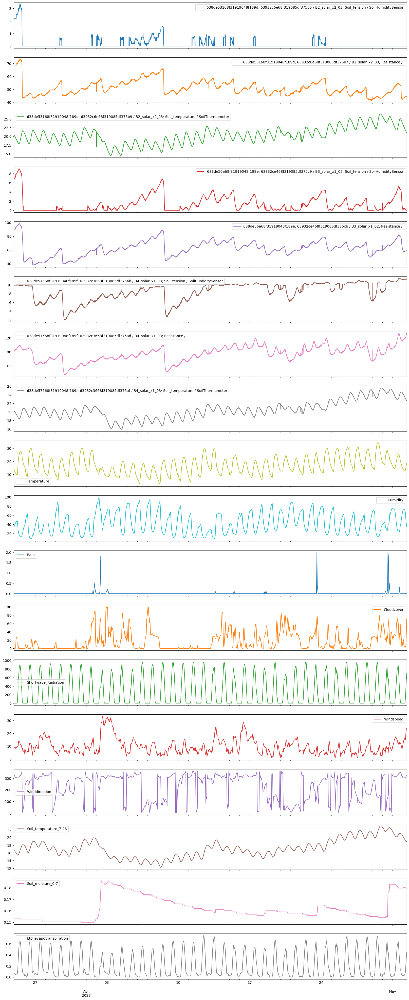

In [44]:
data.plot(subplots=True, figsize=(20,50))

In [45]:
data.head()

,638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor,638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /,638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer,638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor,638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor,638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration
2023-03-24 22:00:00,2.2,68.7,20.5,6.6,88.2,9.8,100.9,20.1,14.000000,33.000000,0.0,0.0,0.0,8.600000,338.0,16.700000,0.153,0.06
2023-03-24 22:10:00,2.1,68.3,20.5,6.6,88.2,9.8,101.4,20.1,13.816667,33.666667,0.0,0.0,0.0,8.666667,335.5,16.683333,0.153,0.06
2023-03-24 22:20:00,2.2,68.7,20.4,6.6,88.2,9.8,101.4,20.1,13.633333,34.333333,0.0,0.0,0.0,8.733333,333.0,16.666667,0.153,0.06
2023-03-24 22:30:00,2.2,68.7,20.4,6.8,89.3,9.8,101.4,20.1,13.450000,35.000000,0.0,0.0,0.0,8.800000,330.5,16.650000,0.153,0.06
2023-03-24 22:40:00,2.2,68.7,20.4,6.8,89.3,9.8,102.4,20.1,13.266667,35.666667,0.0,0.0,0.0,8.866667,328.0,16.633333,0.153,0.06


In [46]:
def compare_dataframes(df1, df2):
    # Verify column names
    if not set(df1.columns) == set(df2.columns):
        print("Column names are not the same in both dataframes.")
        return

    # Find the common columns between the two dataframes
    common_columns = df1.columns.intersection(df2.columns)

    # Compare the available values in the common columns
    for column in common_columns:
        values1 = df1[column].dropna()
        values2 = df2[column].dropna()

        min_length = min(len(values1), len(values2))
        values1 = values1[:min_length]
        values2 = values2[:min_length]

        diff = np.abs(values1.values - values2.values)
        mae = np.mean(diff)
        rmse = np.sqrt(np.mean(diff ** 2))
        mpe = np.mean(diff / values1.values) * 100

        print(f"Column: {column}")
        print(f"MAE: {mae:.2f}")
        print(f"RMSE: {rmse:.2f}")
        print(f"MPE: {mpe:.2f}%")
        print("df1 len:",len(values1),"df2 len:",len(values2))
        print()

#compare_dataframes(data, data_imp)

In [47]:
#data_imp.index = data.index
#data = data_imp

In [48]:
#data_imp.plot(subplots=True, figsize=(20,50))

In [49]:
#impute data
#from sklearn.impute import KNNImputer

##data_knn_imputed = data_knn_imputed.drop(['Time'], axis=1)

# Init the transformer
#knn_imp = KNNImputer(n_neighbors=10)

# Fit/transform
#data_imp.iloc[:,0:len(data)] = knn_imp.fit_transform(data_imp.iloc[:,0:len(data)])

In [50]:
#data_imp.plot(subplots=True, figsize=(20,50))

<Axes: >

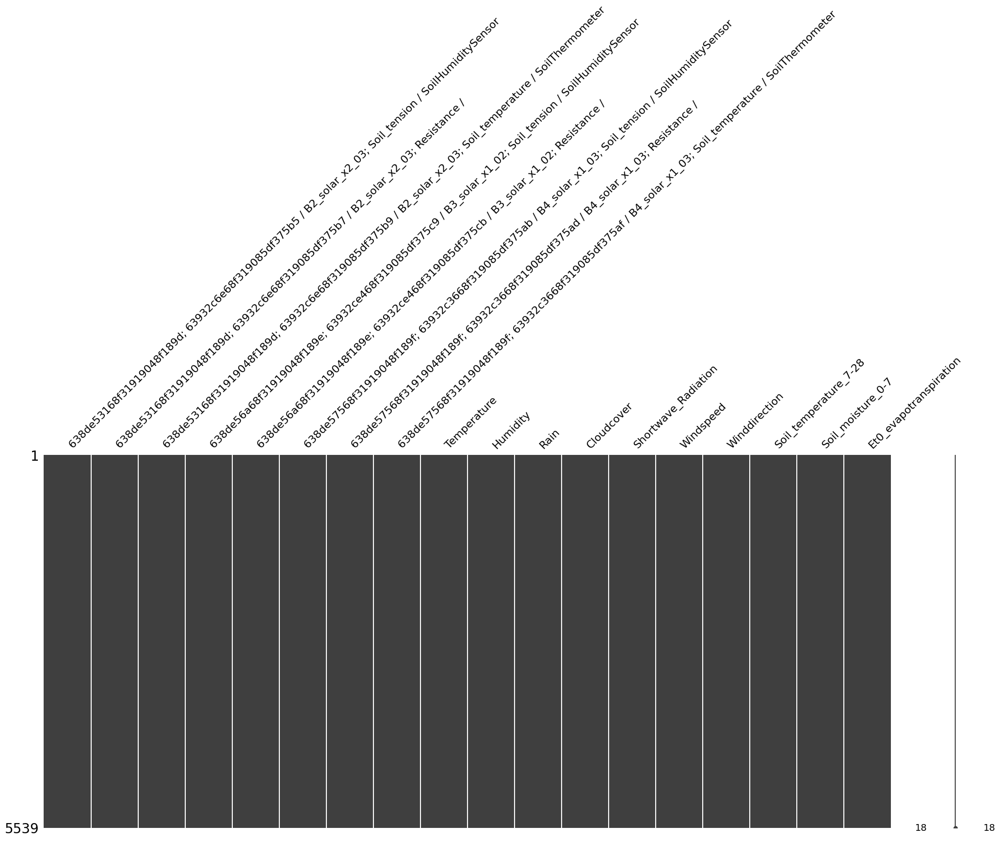

In [51]:
# Plot correlation heatmap of missingness
msno.matrix(data)

In [52]:
# Show if there are any missing values inside the data
data.isna().any()

638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor     False
638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /                          False
638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer    False
638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor     False
638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /                          False
638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor     False
638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /                          False
638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer    False
Temperature                                                                                     

In [53]:
# create average cols
data['grouped_soil'] = data[Soil_humi].mean(axis=1)
data['grouped_resistance'] = data[Resistance].mean(axis=1)
data['grouped_soil_temp'] = data[Soil_temp].mean(axis=1)

In [54]:
data.index.dtype

dtype('<M8[ns]')

In [55]:
#data['Time'] = data['Time'].str[:-9]
#data.head()

In [56]:
#data['Time']=pd.to_datetime(data['Time'])

#data.head()

In [57]:
# after concat => need to convert to datetimeindex once more:
#data.index=pd.to_datetime(data.index, format='%Y-%m-%d %H:%M:%S') #2023-04-01 00:50:00

In [58]:
## Create Features
## create rolling mean: introduces NaN again -> later just cut off
data['rolling_mean_grouped_soil'] = data['grouped_soil'].rolling(window=rolling_mean_window_grouped, win_type='gaussian').mean(std=rolling_mean_window_grouped)
data['rolling_mean_grouped_soil_temp'] = data['grouped_soil_temp'].rolling(window=rolling_mean_window_grouped, win_type='gaussian').mean(std=rolling_mean_window_grouped)

data['hour'] = data.index.hour#.astype("float64")
data['minute'] = data.index.minute#.astype("float64")
data['date'] = data.index.day#.astype("float64")
data['month'] = data.index.month#.astype("float64")
data['day_of_year'] = data.index.dayofyear#.astype("float64")

In [59]:
# soil-water retention curve for sandy clay
soil_water_retention_curve = [
    (0, 0.45),
    (5, 0.40),
    (10, 0.37),
    (20, 0.30),
    (50, 0.25),
    (100, 0.20),
    (200, 0.15),
    (500, 0.10),
    (1000, 0.05),               
]
# this is basically made up to match the weather apis values
soil_water_retention_curve2 = [
    (0, 0.225),
    (5, 0.2),
    (10, 0.185),
    (20, 0.15),
    (50, 0.125),
    (100, 0.1),
    (200, 0.075),
    (500, 0.05),
    (1000, 0.025),               
]

def soil_tension_to_volumetric_water_content(soil_tension, soil_water_retention_curve):
    """
    Convert soil tension (kPa) to volumetric water content (fraction) using a given soil-water retention curve.
    
    Parameters:
        soil_tension (float): Soil tension value in kPa.
        soil_water_retention_curve (list of tuples): A list of tuples containing points on the soil-water retention curve.
            Each tuple contains two elements: (soil_tension_value, volumetric_water_content_value).
    
    Returns:
        float: Volumetric water content as a fraction (between 0 and 1).
    """
    # Sort the soil-water retention curve points by soil tension in ascending order
    sorted_curve = sorted(soil_water_retention_curve, key=lambda x: x[0])
    
    # Find the two points on the curve that bound the given soil tension value
    lower_point, upper_point = None, None
    for tension, water_content in sorted_curve:
        if tension <= soil_tension:
            lower_point = (tension, water_content)
        else:
            upper_point = (tension, water_content)
            break
    
    # If the soil tension is lower than the first point on the curve, use the first point
    if lower_point is None:
        return sorted_curve[0][1]
    
    # If the soil tension is higher than the last point on the curve, use the last point
    if upper_point is None:
        return sorted_curve[-1][1]
    
    # Interpolate to find the volumetric water content at the given soil tension
    tension_diff = upper_point[0] - lower_point[0]
    water_content_diff = upper_point[1] - lower_point[1]
    interpolated_water_content = lower_point[1] + ((soil_tension - lower_point[0]) / tension_diff) * water_content_diff
    
    return interpolated_water_content

def add_volumetric_col_to_df(df, col_name):
    # Iterate over the rows of the dataframe and calculate volumetric water content
    for index, row in df.iterrows():
        soil_tension = row[col_name]
        # Calculate volumetric water content
        volumetric_water_content = soil_tension_to_volumetric_water_content(soil_tension, soil_water_retention_curve2)
        # Assign the calculated value to a new column in the dataframe
        df.at[index, col_name + '_vol'] = volumetric_water_content

    return df

data = add_volumetric_col_to_df(data, 'rolling_mean_grouped_soil')

In [60]:
# feature scaling
data.dtypes

638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor     float64
638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /                          float64
638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer    float64
638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor     float64
638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /                          float64
638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor     float64
638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /                          float64
638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer    float64
Temperature                                                                     

In [61]:
# Min-Max Normalization
def max_min_norm(df_all):
    df = df_all.drop(['rolling_mean_grouped_soil', 'hour', 'minute', 'date', 'month', 'day_of_year'], axis=1)
    index = df.index
    df_norm = pd.DataFrame()
    for col in df.columns:
        print("Current col: ", col)
        if df[col].dtype == ref_dtype:
            print("Normalize:   ", col, "Max value: ", df[col].max())
            df_norm[col] = (df[col]-df[col].min())/(df[col].max()-df[col].min())
    df_norm = pd.concat([df_norm,  df_all.rolling_mean_grouped_soil, df_all['hour'], df_all['minute'], df_all['date'], df_all['month'], df_all['day_of_year']], 1)
    return df_norm

#data = max_min_norm(data)

In [62]:
data.dtypes

638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor     float64
638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /                          float64
638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer    float64
638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor     float64
638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /                          float64
638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor     float64
638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /                          float64
638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer    float64
Temperature                                                                     

In [63]:
print(str(Soil_temp).replace("[", "").replace("]", ""))

'638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer', '638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer'


In [64]:
int(5/2 + 0.5)

3

In [65]:
data.head()

,638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor,638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /,638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer,638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor,638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor,638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer,Temperature,Humidity,...,grouped_resistance,grouped_soil_temp,rolling_mean_grouped_soil,rolling_mean_grouped_soil_temp,hour,minute,date,month,day_of_year,rolling_mean_grouped_soil_vol
2023-03-24 22:00:00,2.2,68.7,20.5,6.6,88.2,9.8,100.9,20.1,14.000000,33.000000,...,85.933333,20.30,NaN,NaN,22,0,24,3,83,0.225000
2023-03-24 22:10:00,2.1,68.3,20.5,6.6,88.2,9.8,101.4,20.1,13.816667,33.666667,...,85.966667,20.30,NaN,NaN,22,10,24,3,83,0.225000
2023-03-24 22:20:00,2.2,68.7,20.4,6.6,88.2,9.8,101.4,20.1,13.633333,34.333333,...,86.100000,20.25,NaN,NaN,22,20,24,3,83,0.225000
2023-03-24 22:30:00,2.2,68.7,20.4,6.8,89.3,9.8,101.4,20.1,13.450000,35.000000,...,86.466667,20.25,NaN,NaN,22,30,24,3,83,0.225000
2023-03-24 22:40:00,2.2,68.7,20.4,6.8,89.3,9.8,102.4,20.1,13.266667,35.666667,...,86.800000,20.25,6.219601,20.269799,22,40,24,3,83,0.196341


In [66]:
data.index.name = 'Timestamp'

In [67]:
#data = data[['Time', 'hour', 'minute', 'date', 'month', 'grouped_soil', 'grouped_resistance', 'grouped_soil_temp', 'rolling_mean_grouped_soil', 'rolling_mean_grouped_soil_temp', 
#             str(Soil_humi).replace("[", "").replace("]", "").replace("\\",""),
#             str(Resistance).replace("[", "").replace("]", "").replace("\\",""),
#             str(Soil_temp).replace("[", "").replace("]", "").replace("\\","")
#            ]]

# drop those values without rolling_mean
#data = data[rolling_mean_window_data+int(rolling_mean_window_grouped/2 + 0.5):]
data = data[4:]
data.head()

# reset changed index(due to drop)
#data = data.reset_index()

#data = data.drop(['index'],axis=1)

,638de53168f31919048f189d; 63932c6e68f319085df375b5 / B2_solar_x2_03; Soil_tension / SoilHumiditySensor,638de53168f31919048f189d; 63932c6e68f319085df375b7 / B2_solar_x2_03; Resistance /,638de53168f31919048f189d; 63932c6e68f319085df375b9 / B2_solar_x2_03; Soil_temperature / SoilThermometer,638de56a68f31919048f189e; 63932ce468f319085df375c9 / B3_solar_x1_02; Soil_tension / SoilHumiditySensor,638de56a68f31919048f189e; 63932ce468f319085df375cb / B3_solar_x1_02; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375ab / B4_solar_x1_03; Soil_tension / SoilHumiditySensor,638de57568f31919048f189f; 63932c3668f319085df375ad / B4_solar_x1_03; Resistance /,638de57568f31919048f189f; 63932c3668f319085df375af / B4_solar_x1_03; Soil_temperature / SoilThermometer,Temperature,Humidity,...,grouped_resistance,grouped_soil_temp,rolling_mean_grouped_soil,rolling_mean_grouped_soil_temp,hour,minute,date,month,day_of_year,rolling_mean_grouped_soil_vol
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-03-24 22:40:00,2.2,68.7,20.4,6.8,89.3,9.8,102.4,20.1,13.266667,35.666667,...,86.800000,20.25,6.219601,20.269799,22,40,24,3,83,0.196341
2023-03-24 22:50:00,2.2,68.7,20.3,6.8,89.3,9.8,101.9,20.1,13.083333,36.333333,...,86.633333,20.20,6.233867,20.250000,22,50,24,3,83,0.196298
2023-03-24 23:00:00,2.2,68.7,20.3,6.8,89.3,9.8,101.5,20.1,12.900000,37.000000,...,86.500000,20.20,6.253863,20.230201,23,0,24,3,83,0.196238
2023-03-24 23:10:00,2.2,68.7,20.3,6.8,89.3,9.8,101.9,20.1,12.783333,37.333333,...,86.633333,20.20,6.266667,20.219799,23,10,24,3,83,0.196200
2023-03-24 23:20:00,2.2,68.7,20.1,6.8,89.3,9.8,102.0,20.1,12.666667,37.666667,...,86.666667,20.10,6.266667,20.190397,23,20,24,3,83,0.196200


In [68]:
# Drop the first eight columns 
#->better without raw values-> overfitting
data = data.iloc[:, total_amount:]

In [69]:
print(data.iloc[0])

data.head(10)

Temperature                        13.266667
Humidity                           35.666667
Rain                                0.000000
Cloudcover                          0.000000
Shortwave_Radiation                 0.000000
Windspeed                           8.866667
Winddirection                     328.000000
Soil_temperature_7-28              16.633333
Soil_moisture_0-7                   0.153000
Et0_evapotranspiration              0.060000
grouped_soil                        6.266667
grouped_resistance                 86.800000
grouped_soil_temp                  20.250000
rolling_mean_grouped_soil           6.219601
rolling_mean_grouped_soil_temp     20.269799
hour                               22.000000
minute                             40.000000
date                               24.000000
month                               3.000000
day_of_year                        83.000000
rolling_mean_grouped_soil_vol       0.196341
Name: 2023-03-24 22:40:00, dtype: float64


,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration,...,grouped_resistance,grouped_soil_temp,rolling_mean_grouped_soil,rolling_mean_grouped_soil_temp,hour,minute,date,month,day_of_year,rolling_mean_grouped_soil_vol
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-03-24 22:40:00,13.266667,35.666667,0.0,0.0,0.0,8.866667,328.000000,16.633333,0.153,0.060000,...,86.800000,20.25,6.219601,20.269799,22,40,24,3,83,0.196341
2023-03-24 22:50:00,13.083333,36.333333,0.0,0.0,0.0,8.933333,325.500000,16.616667,0.153,0.060000,...,86.633333,20.20,6.233867,20.250000,22,50,24,3,83,0.196298
2023-03-24 23:00:00,12.900000,37.000000,0.0,0.0,0.0,9.000000,323.000000,16.600000,0.153,0.060000,...,86.500000,20.20,6.253863,20.230201,23,0,24,3,83,0.196238
2023-03-24 23:10:00,12.783333,37.333333,0.0,0.0,0.0,9.066667,322.000000,16.583333,0.153,0.060000,...,86.633333,20.20,6.266667,20.219799,23,10,24,3,83,0.196200
2023-03-24 23:20:00,12.666667,37.666667,0.0,0.0,0.0,9.133333,321.000000,16.566667,0.153,0.060000,...,86.666667,20.10,6.266667,20.190397,23,20,24,3,83,0.196200
2023-03-24 23:30:00,12.550000,38.000000,0.0,0.0,0.0,9.200000,320.000000,16.550000,0.153,0.060000,...,86.500000,20.10,6.266667,20.160402,23,30,24,3,83,0.196200
2023-03-24 23:40:00,12.433333,38.333333,0.0,0.0,0.0,9.266667,319.000000,16.533333,0.153,0.060000,...,86.666667,20.05,6.266667,20.129995,23,40,24,3,83,0.196200
2023-03-24 23:50:00,12.316667,38.666667,0.0,0.0,0.0,9.333333,318.000000,16.516667,0.153,0.060000,...,86.666667,20.05,6.266667,20.099406,23,50,24,3,83,0.196200
2023-03-25 00:00:00,12.200000,39.000000,0.0,0.0,0.0,9.400000,317.000000,16.500000,0.153,0.060000,...,86.866667,20.00,6.279470,20.060196,0,0,25,3,84,0.196162


In [70]:
#data_plot = data.drop(['hour','minute','date','month','grouped_soil','grouped_resistance','grouped_soil_temp', Soil_humi, Resistance, Soil_temp], axis=1)
#data_plot.tail(20)

In [71]:
#data_plot.set_index('Time').plot(figsize = (20,10))

In [72]:
import numpy as np
# calculate slope of "rolling_mean_grouped_soil"
f = data.rolling_mean_grouped_soil
data['gradient'] = np.gradient(f)
data['pump_state'] = int(0)
#data.iloc[3270:3330]
data.head(10)

,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration,...,rolling_mean_grouped_soil,rolling_mean_grouped_soil_temp,hour,minute,date,month,day_of_year,rolling_mean_grouped_soil_vol,gradient,pump_state
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-03-24 22:40:00,13.266667,35.666667,0.0,0.0,0.0,8.866667,328.000000,16.633333,0.153,0.060000,...,6.219601,20.269799,22,40,24,3,83,0.196341,0.014266,0
2023-03-24 22:50:00,13.083333,36.333333,0.0,0.0,0.0,8.933333,325.500000,16.616667,0.153,0.060000,...,6.233867,20.250000,22,50,24,3,83,0.196298,0.017131,0
2023-03-24 23:00:00,12.900000,37.000000,0.0,0.0,0.0,9.000000,323.000000,16.600000,0.153,0.060000,...,6.253863,20.230201,23,0,24,3,83,0.196238,0.016400,0
2023-03-24 23:10:00,12.783333,37.333333,0.0,0.0,0.0,9.066667,322.000000,16.583333,0.153,0.060000,...,6.266667,20.219799,23,10,24,3,83,0.196200,0.006402,0
2023-03-24 23:20:00,12.666667,37.666667,0.0,0.0,0.0,9.133333,321.000000,16.566667,0.153,0.060000,...,6.266667,20.190397,23,20,24,3,83,0.196200,0.000000,0
2023-03-24 23:30:00,12.550000,38.000000,0.0,0.0,0.0,9.200000,320.000000,16.550000,0.153,0.060000,...,6.266667,20.160402,23,30,24,3,83,0.196200,0.000000,0
2023-03-24 23:40:00,12.433333,38.333333,0.0,0.0,0.0,9.266667,319.000000,16.533333,0.153,0.060000,...,6.266667,20.129995,23,40,24,3,83,0.196200,0.000000,0
2023-03-24 23:50:00,12.316667,38.666667,0.0,0.0,0.0,9.333333,318.000000,16.516667,0.153,0.060000,...,6.266667,20.099406,23,50,24,3,83,0.196200,0.006402,0
2023-03-25 00:00:00,12.200000,39.000000,0.0,0.0,0.0,9.400000,317.000000,16.500000,0.153,0.060000,...,6.279470,20.060196,0,0,25,3,84,0.196162,0.016400,0


In [73]:
# create dataframe with downward slope
neg_slope = pd.DataFrame({"Time":[],
                          "index":[],
                          "rolling_mean_grouped_soil":[],
                          "gradient":[]
                         })
i=0
for index, row in data.iterrows():
    if row['gradient'] < slope_irrigation:
        print(index, row['rolling_mean_grouped_soil'], row['gradient'], row['Rain'])
        # only add if there was no rain in the previous hours
        if row['Rain'] == 0.0:
            data.at[index, 'pump_state'] = 1
            current_series = pd.Series([index, int(i), row['rolling_mean_grouped_soil'], row['Rain'], row['gradient']], index=['Time', 'index', 'rolling_mean_grouped_soil', 'Rain', 'gradient'])#.to_frame().T
            neg_slope = neg_slope.append(current_series,ignore_index=True)
    i += 1
len(neg_slope)

2023-03-25 16:50:00 6.727723362065053 -0.08340199310303698 0.0
2023-03-25 17:00:00 6.621063135539444 -0.14260061636029375 0.0
2023-03-25 17:10:00 6.442522129344465 -0.20273632586443657 0.0
2023-03-25 17:20:00 6.215590483810571 -0.2509290360705645 0.0
2023-03-25 17:30:00 5.940664057203336 -0.2753909446425169 0.0
2023-03-25 17:40:00 5.664808594525537 -0.2649280366424982 0.0
2023-03-25 17:50:00 5.41080798391834 -0.23306674443084052 0.0
2023-03-25 18:00:00 5.198675105663856 -0.18873732529250287 0.0
2023-03-25 18:10:00 5.033333333333334 -0.15253839673164693 0.0
2023-03-25 18:20:00 4.893598312200562 -0.14313379416528038 0.0
2023-03-25 18:30:00 4.747065745002773 -0.15000000000000036 0.0
2023-03-25 18:40:00 4.5935983122005615 -0.15606599485979 0.0
2023-03-25 18:50:00 4.434933755283193 -0.16421655145867975 0.0
2023-03-25 19:00:00 4.265165209283202 -0.17230046083194628 0.0
2023-03-25 19:10:00 4.090332833619301 -0.1774501152079866 0.0
2023-03-25 19:20:00 3.910264978867229 -0.1866674716842993 0.0


84

In [74]:
#neg_slope = neg_slope.reset_index(inplace=True)
neg_slope.head(50)

,Time,index,rolling_mean_grouped_soil,gradient,Rain
0,2023-03-25 16:50:00,109.0,6.727723,-0.083402,0.0
1,2023-03-25 17:00:00,110.0,6.621063,-0.142601,0.0
2,2023-03-25 17:10:00,111.0,6.442522,-0.202736,0.0
3,2023-03-25 17:20:00,112.0,6.215590,-0.250929,0.0
4,2023-03-25 17:30:00,113.0,5.940664,-0.275391,0.0
5,2023-03-25 17:40:00,114.0,5.664809,-0.264928,0.0
6,2023-03-25 17:50:00,115.0,5.410808,-0.233067,0.0
7,2023-03-25 18:00:00,116.0,5.198675,-0.188737,0.0
8,2023-03-25 18:10:00,117.0,5.033333,-0.152538,0.0
9,2023-03-25 18:20:00,118.0,4.893598,-0.143134,0.0


In [75]:
# also create a numerical index
data['NumericalIndex'] = range(len(data))
data.head()

,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration,...,rolling_mean_grouped_soil_temp,hour,minute,date,month,day_of_year,rolling_mean_grouped_soil_vol,gradient,pump_state,NumericalIndex
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-03-24 22:40:00,13.266667,35.666667,0.0,0.0,0.0,8.866667,328.0,16.633333,0.153,0.06,...,20.269799,22,40,24,3,83,0.196341,0.014266,0,0
2023-03-24 22:50:00,13.083333,36.333333,0.0,0.0,0.0,8.933333,325.5,16.616667,0.153,0.06,...,20.250000,22,50,24,3,83,0.196298,0.017131,0,1
2023-03-24 23:00:00,12.900000,37.000000,0.0,0.0,0.0,9.000000,323.0,16.600000,0.153,0.06,...,20.230201,23,0,24,3,83,0.196238,0.016400,0,2
2023-03-24 23:10:00,12.783333,37.333333,0.0,0.0,0.0,9.066667,322.0,16.583333,0.153,0.06,...,20.219799,23,10,24,3,83,0.196200,0.006402,0,3
2023-03-24 23:20:00,12.666667,37.666667,0.0,0.0,0.0,9.133333,321.0,16.566667,0.153,0.06,...,20.190397,23,20,24,3,83,0.196200,0.000000,0,4


In [76]:
def delete_nonconsecutive_rows(df, column_name, min_consecutive):
    arr = df['index'].to_numpy()
    i = 0
    while i < len(arr) - 1:
        if arr[i+1] == arr[i] + 1:
            start_index = i
            while i < len(arr) - 1 and arr[i+1] == arr[i] + 1:
                i += 1
            end_index = i
            if end_index - start_index + 1 < min_consecutive:
                df = df.drop(range(start_index, end_index+1))
                print("dropped")
        i += 1
    return df

neg_slope = delete_nonconsecutive_rows(neg_slope, 'index', 5)
print(len(neg_slope))
print(neg_slope)

dropped
dropped
dropped
dropped
71
                  Time   index  rolling_mean_grouped_soil  gradient  Rain
0  2023-03-25 16:50:00   109.0                   6.727723 -0.083402   0.0
1  2023-03-25 17:00:00   110.0                   6.621063 -0.142601   0.0
2  2023-03-25 17:10:00   111.0                   6.442522 -0.202736   0.0
3  2023-03-25 17:20:00   112.0                   6.215590 -0.250929   0.0
4  2023-03-25 17:30:00   113.0                   5.940664 -0.275391   0.0
..                 ...     ...                        ...       ...   ...
79 2023-05-01 20:50:00  5461.0                   4.954259 -0.089933   0.0
80 2023-05-01 21:00:00  5462.0                   4.860402 -0.097264   0.0
81 2023-05-01 21:10:00  5463.0                   4.759732 -0.100533   0.0
82 2023-05-01 21:20:00  5464.0                   4.659336 -0.096730   0.0
83 2023-05-01 21:30:00  5465.0                   4.566271 -0.083135   0.0

[71 rows x 5 columns]


In [77]:
# here a threshold is choosen to invalidate very short occurances
def delete_nonconsecutive_rows(df, column_name, min_consecutive):
    arr = df['index'].to_numpy()
    
    i = 0
    for index, row in df.iterrows():
        if df.at[index, 'pump_state'] == 1 and df.at[df.index[df.index.get_loc(index) + 1], 'pump_state'] == 1:
            start_index = i
            while i < len(arr) - 1 and df.at[i, 'pump_state'] == df.at[i+1, 'pump_state']:
                i += 1
            end_index = i
            if end_index - start_index + 1 < min_consecutive:
                df = df.drop(range(start_index, end_index+1))
                print(i +'should be drop')
        i += 1
    return df

#data = delete_nonconsecutive_rows(data, 'NumericalIndex', 5)
#print(neg_slope)

In [78]:
data.head()

,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration,...,rolling_mean_grouped_soil_temp,hour,minute,date,month,day_of_year,rolling_mean_grouped_soil_vol,gradient,pump_state,NumericalIndex
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-03-24 22:40:00,13.266667,35.666667,0.0,0.0,0.0,8.866667,328.0,16.633333,0.153,0.06,...,20.269799,22,40,24,3,83,0.196341,0.014266,0,0
2023-03-24 22:50:00,13.083333,36.333333,0.0,0.0,0.0,8.933333,325.5,16.616667,0.153,0.06,...,20.250000,22,50,24,3,83,0.196298,0.017131,0,1
2023-03-24 23:00:00,12.900000,37.000000,0.0,0.0,0.0,9.000000,323.0,16.600000,0.153,0.06,...,20.230201,23,0,24,3,83,0.196238,0.016400,0,2
2023-03-24 23:10:00,12.783333,37.333333,0.0,0.0,0.0,9.066667,322.0,16.583333,0.153,0.06,...,20.219799,23,10,24,3,83,0.196200,0.006402,0,3
2023-03-24 23:20:00,12.666667,37.666667,0.0,0.0,0.0,9.133333,321.0,16.566667,0.153,0.06,...,20.190397,23,20,24,3,83,0.196200,0.000000,0,4


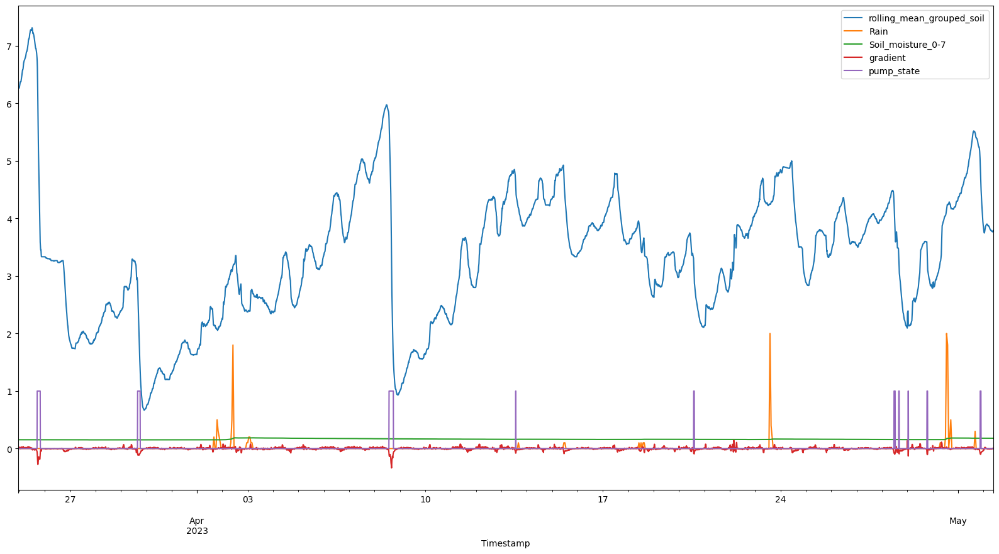

In [79]:
# visualize areas with downward slope
data_for_plot = data[['rolling_mean_grouped_soil', 'Rain', 'Soil_moisture_0-7', 'gradient', 'pump_state']]#, 'Précipitations de la semaine(mm)', 'Précipitations du mois(mm)']]
#data_for_plot.reset_index(drop=True, inplace=True)
ax = data_for_plot.plot(figsize = (20,10)) #'grouped_resistance

In [80]:
# Create visual representation of irrigation times
def highlight(data_plot,ax):
    for index, value in neg_slope['index'].iteritems():
        print(value)
        ax.axvspan(value-10, value+10, facecolor='pink', edgecolor='none', alpha=.5)
        
highlight(data, ax)

ax.figure.suptitle("""Irrigation times highlighted\n\n""", fontweight ="bold") 
#ax.figure(figsize=(20,10))
ax.figure.savefig('irrigation_times_split_reg.png', dpi=400)

109.0
110.0
111.0
112.0
113.0
114.0
115.0
116.0
117.0
118.0
119.0
120.0
121.0
122.0
123.0
124.0
125.0
126.0
679.0
680.0
681.0
682.0
683.0
684.0
685.0
686.0
687.0
688.0
689.0
690.0
691.0
692.0
693.0
2106.0
2107.0
2108.0
2109.0
2110.0
2111.0
2112.0
2113.0
2114.0
2115.0
2116.0
2117.0
2118.0
2119.0
2120.0
2121.0
2122.0
2123.0
2124.0
2125.0
2126.0
2127.0
2128.0
2129.0
2130.0
2825.0
4972.0
4973.0
4974.0
4975.0
4976.0
4977.0
4978.0
5461.0
5462.0
5463.0
5464.0
5465.0


In [81]:
neg_slope_indices = neg_slope['index'].to_numpy()
print(neg_slope_indices)

[ 109.  110.  111.  112.  113.  114.  115.  116.  117.  118.  119.  120.
  121.  122.  123.  124.  125.  126.  679.  680.  681.  682.  683.  684.
  685.  686.  687.  688.  689.  690.  691.  692.  693. 2106. 2107. 2108.
 2109. 2110. 2111. 2112. 2113. 2114. 2115. 2116. 2117. 2118. 2119. 2120.
 2121. 2122. 2123. 2124. 2125. 2126. 2127. 2128. 2129. 2130. 2825. 4972.
 4973. 4974. 4975. 4976. 4977. 4978. 5461. 5462. 5463. 5464. 5465.]


In [82]:
def create_split_tuples(df, indices_to_omit):
    # Sort the indices in ascending order
    indices_to_omit = sorted(indices_to_omit)

    # Create a list of index ranges to remove
    ranges_to_remove = []
    start_idx = None
    for idx in indices_to_omit:
        if start_idx is None:
            start_idx = idx
        elif idx == start_idx + 1:
            start_idx = idx
        else:
            ranges_to_remove.append((int(start_idx), int(idx-1)))
            start_idx = idx
    if start_idx is not None:
        ranges_to_remove.append((int(start_idx), len(df)))
        
    print("Irrigation times to be omitted: ", ranges_to_remove)
    print("type: ", type(ranges_to_remove[0][0]))

    return ranges_to_remove

tuples_to_remove = create_split_tuples(data, neg_slope_indices)
print(tuples_to_remove)

Irrigation times to be omitted:  [(126, 678), (693, 2105), (2130, 2824), (2825, 4971), (4978, 5460), (5465, 5535)]
type:  <class 'int'>
[(126, 678), (693, 2105), (2130, 2824), (2825, 4971), (4978, 5460), (5465, 5535)]


In [83]:
def split_dataframe(df, index_ranges):
    dfs = []
    for i, (start, end) in enumerate(index_ranges):
        print()
        if index_ranges[i][1]-index_ranges[i][0] < min_length_df:
            continue
        else:
            dfs.append(df.iloc[index_ranges[i][0]:index_ranges[i][1]])
    return dfs

sub_dfs = split_dataframe(data, tuples_to_remove) 

In [84]:
test123=sub_dfs[0].index
print(type(test123))
datetime_index = sub_dfs[0].index
unique=pd.to_datetime(datetime_index).day.unique()
print(unique)

<class 'pandas.core.indexes.datetimes.DatetimeIndex'>
Int64Index([25, 26, 27, 28, 29], dtype='int64', name='Timestamp')


In [85]:
sub_dfs[0].index

DatetimeIndex(['2023-03-25 19:40:00', '2023-03-25 19:50:00',
               '2023-03-25 20:00:00', '2023-03-25 20:10:00',
               '2023-03-25 20:20:00', '2023-03-25 20:30:00',
               '2023-03-25 20:40:00', '2023-03-25 20:50:00',
               '2023-03-25 21:00:00', '2023-03-25 21:10:00',
               ...
               '2023-03-29 14:00:00', '2023-03-29 14:10:00',
               '2023-03-29 14:20:00', '2023-03-29 14:30:00',
               '2023-03-29 14:40:00', '2023-03-29 14:50:00',
               '2023-03-29 15:00:00', '2023-03-29 15:10:00',
               '2023-03-29 15:20:00', '2023-03-29 15:30:00'],
              dtype='datetime64[ns]', name='Timestamp', length=552, freq=None)

Dataframe:  1 
First:  2023-03-25 19:40:00 
Last:  2023-03-29 15:30:00 
Length:  552 



Text(0.5, 1.0, 'Data with Vertical Lines at New Days')

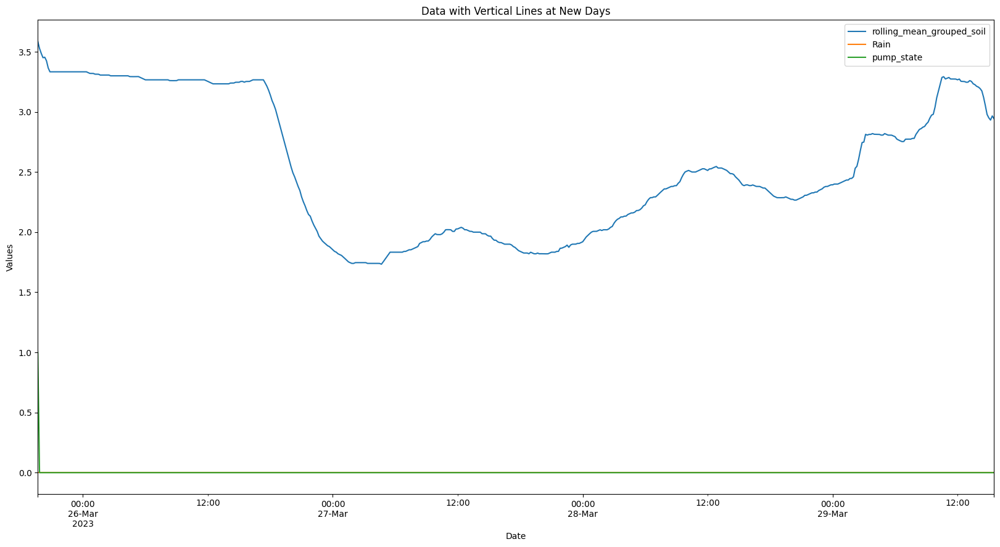

In [86]:
i=0
print("Dataframe: ", i+1, "\nFirst: ", sub_dfs[i].index[0], "\nLast: ", sub_dfs[i].index[-1], "\nLength: ", len(sub_dfs[i]), "\n")

# Plot the selected columns
ax = sub_dfs[i][['rolling_mean_grouped_soil', 'Rain', 'pump_state']].plot(figsize=(20, 10))

# Ensure the index remains a DatetimeIndex
datetime_index = sub_dfs[i].index

# Find the unique dates
unique_dates = pd.to_datetime(datetime_index).day.unique()

# Add vertical lines at each unique date
for date in unique_dates:
    ax.axvline(x=date, color='gray', linestyle='--', alpha=0.5)

# Customize the plot using ax, not plt
ax.set_xlabel('Date')
ax.set_ylabel('Values')
ax.set_title('Data with Vertical Lines at New Days')


There are 5 dataframes now.

Dataframe:  1 
First:  2023-03-25 19:40:00 
Last:  2023-03-29 15:30:00 
Length:  552 

Int64Index([25, 26, 27, 28, 29], dtype='int64', name='Timestamp')
Dataframe:  2 
First:  2023-03-29 18:10:00 
Last:  2023-04-08 13:20:00 
Length:  1412 

Int64Index([29, 30, 31, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64', name='Timestamp')
Dataframe:  3 
First:  2023-04-08 17:40:00 
Last:  2023-04-13 13:10:00 
Length:  694 

Int64Index([8, 9, 10, 11, 12, 13], dtype='int64', name='Timestamp')
Dataframe:  4 
First:  2023-04-13 13:30:00 
Last:  2023-04-28 11:00:00 
Length:  2146 

Int64Index([13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28], dtype='int64', name='Timestamp')
Dataframe:  5 
First:  2023-04-28 12:20:00 
Last:  2023-05-01 20:30:00 
Length:  482 

Int64Index([28, 29, 30, 1], dtype='int64', name='Timestamp')


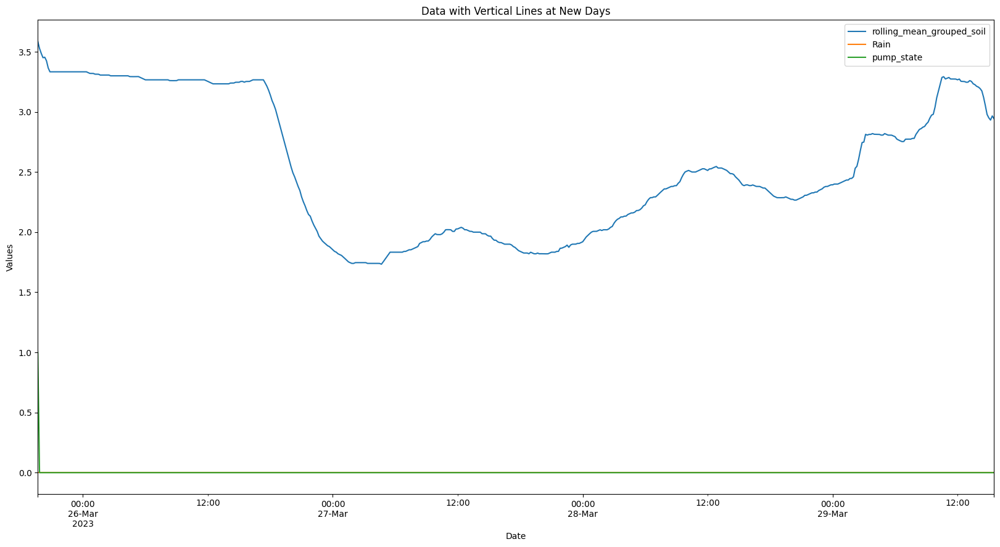

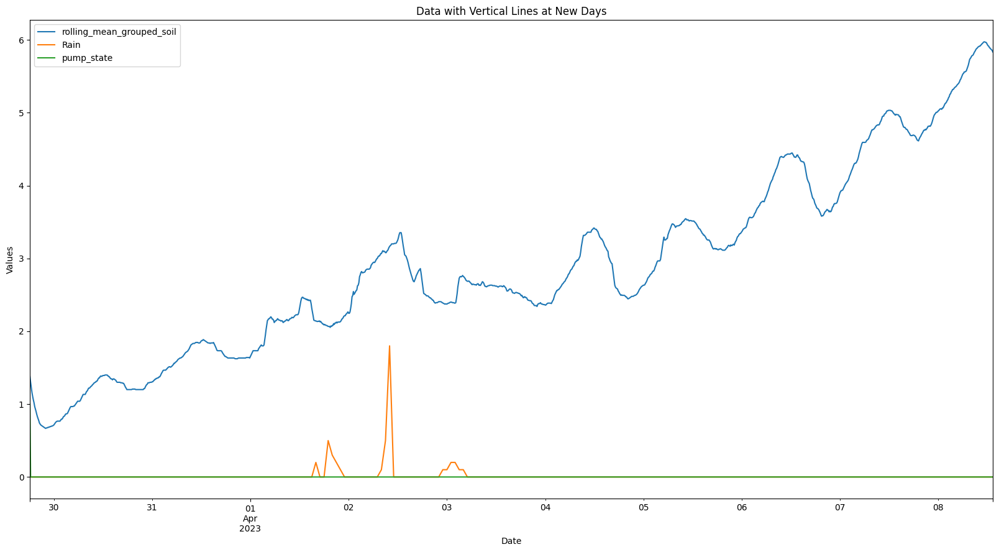

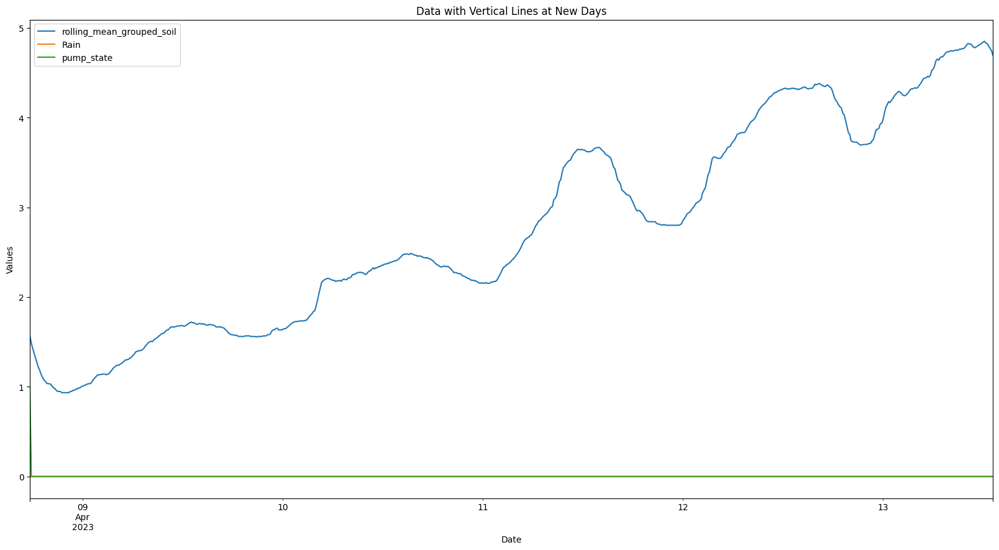

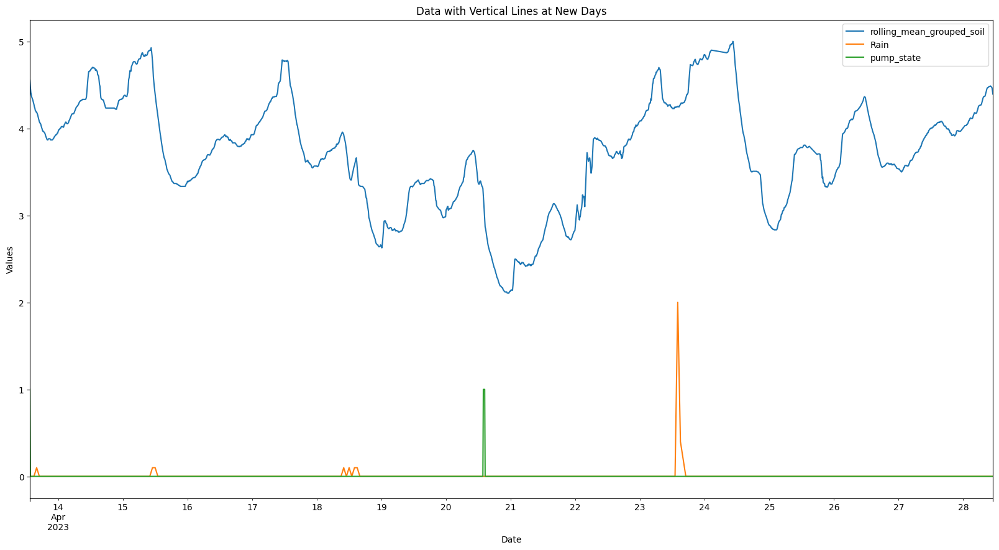

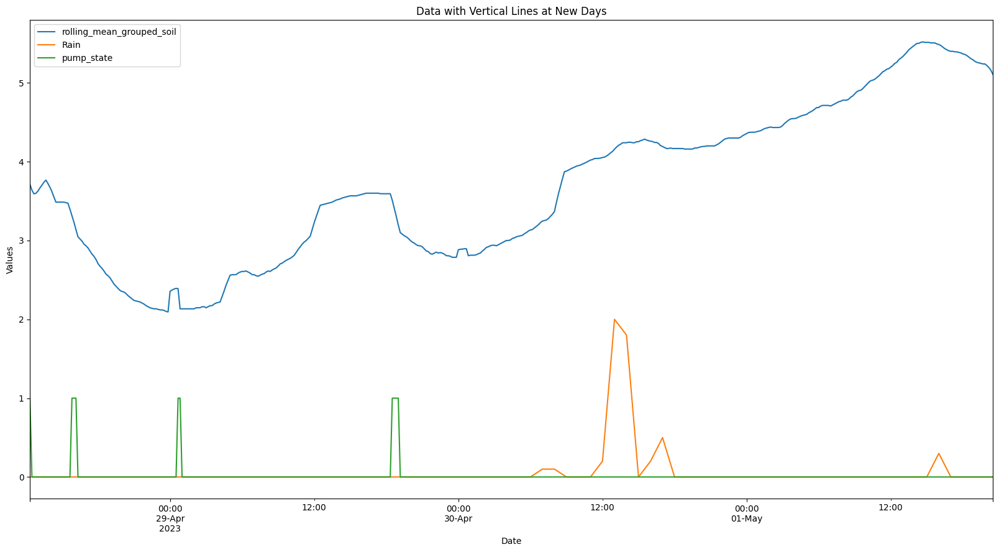

In [87]:
print("There are", len(sub_dfs), "dataframes now.\n")
for i in range(len(sub_dfs)):
    print("Dataframe: ", i+1, "\nFirst: ", sub_dfs[i].index[0], "\nLast: ", sub_dfs[i].index[-1], "\nLength: ", len(sub_dfs[i]), "\n")

    # Plot the selected columns
    ax = sub_dfs[i][['rolling_mean_grouped_soil', 'Rain', 'pump_state']].plot(figsize=(20, 10))

    # Ensure the index remains a DatetimeIndex
    datetime_index = sub_dfs[i].index

    # Find the unique dates
    unique_dates = pd.to_datetime(datetime_index).day.unique()
    print(unique_dates)

    # Add vertical lines at each unique date
    for date in unique_dates:
        ax.axvline(x=date, color='gray', linestyle='--', alpha=0.5)

    # Customize the plot
    ax.set_xlabel('Date')
    ax.set_ylabel('Values')
    ax.set_title('Data with Vertical Lines at New Days')
    

#sub_dfs[i][['rolling_mean_grouped_soil', 'Rain', 'pump_state']].plot(figsize = (20,10)) #'grouped_resistance'

In [88]:
# find global max and min in all sub_dfs and cut them from min to max 
# => train data will start with min and end with max 
cut_sub_dfs = []
for i in range(len(sub_dfs)):
    # reset "new" index
    sub_dfs[i] = sub_dfs[i].reset_index()
    
    # index of max and min for col rolling_mean_grouped_soil
    global_min_index = sub_dfs[i]['rolling_mean_grouped_soil'].idxmin()
    global_max_index = sub_dfs[i]['rolling_mean_grouped_soil'].idxmax()
    
    # value of max and min for col rolling_mean_grouped_soil
    global_min = sub_dfs[i]['rolling_mean_grouped_soil'].min()
    global_max = sub_dfs[i]['rolling_mean_grouped_soil'].max()
    
    if global_max_index-global_min_index > 0:
        cut_sub_dfs.append(sub_dfs[i].iloc[global_min_index:global_max_index])
    else:
        cut_sub_dfs.append(sub_dfs[i].iloc[global_min_index:sub_dfs[i].index[-1]])
        
    print(i,": ",global_min_index, "value:", global_min, global_max_index, "value:", global_max, "length:", global_max_index-global_min_index)
    print("DateFrame:",i, "was added!\nglobal_max_index:", global_max_index, "global_min_index", global_min_index, "Result:", global_max_index-global_min_index,"\n")
#sub_dfs[1].drop(['Time'],axis=1).plot()

0 :  198 value: 1.7333333333333336 0 value: 3.5856524348467236 length: -198
DateFrame: 0 was added!
global_max_index: 0 global_min_index 198 Result: -198 

1 :  23 value: 0.6666666666666667 1399 value: 5.973464212731683 length: 1376
DateFrame: 1 was added!
global_max_index: 1399 global_min_index 23 Result: 1376 

2 :  23 value: 0.9333333333333332 687 value: 4.850601837574689 length: 664
DateFrame: 2 was added!
global_max_index: 687 global_min_index 23 Result: 664 

3 :  1065 value: 2.105868509994452 1566 value: 4.999862680460593 length: 501
DateFrame: 3 was added!
global_max_index: 1566 global_min_index 1065 Result: 501 

4 :  69 value: 2.093598312200562 446 value: 5.519996779929472 length: 377
DateFrame: 4 was added!
global_max_index: 446 global_min_index 69 Result: 377 



In [89]:
# dataframes needs to be cleaned up, index wrong
for df in cut_sub_dfs:
    df = df.reset_index(drop=True,inplace=True)
    #print(df.index)
    #df = df.drop(['index'],axis=1)

In [90]:
cut_sub_dfs[0].head()

,Timestamp,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,...,rolling_mean_grouped_soil_temp,hour,minute,date,month,day_of_year,rolling_mean_grouped_soil_vol,gradient,pump_state,NumericalIndex
0,2023-03-27 04:40:00,12.133333,53.0,0.0,11.666667,0.000000,9.266667,294.000000,17.866667,0.152,...,19.879401,4,40,27,3,86,0.216333,0.006402,0,324
1,2023-03-27 04:50:00,12.016667,53.5,0.0,10.333333,0.000000,9.083333,292.500000,17.833333,0.152,...,19.840397,4,50,27,3,86,0.216237,0.019799,0,325
2,2023-03-27 05:00:00,11.900000,54.0,0.0,9.000000,0.000000,8.900000,291.000000,17.800000,0.152,...,19.810402,5,0,27,3,86,0.216135,0.020599,0,326
3,2023-03-27 05:10:00,11.833333,54.5,0.0,9.000000,3.666667,8.816667,290.833333,17.766667,0.152,...,19.779995,5,10,27,3,86,0.216031,0.020599,0,327
4,2023-03-27 05:20:00,11.766667,55.0,0.0,9.000000,7.333333,8.733333,290.666667,17.733333,0.152,...,19.749406,5,20,27,3,86,0.215929,0.019799,0,328


In [91]:
# save all dataframes to one and rename
df_comb = pd.DataFrame()
for i in range(len(cut_sub_dfs)):
    # copy elements to one df_comb
    
    df_comb = pd.concat([df_comb, cut_sub_dfs[i]['NumericalIndex']], axis=1)
    df_comb = pd.concat([df_comb, cut_sub_dfs[i]['rolling_mean_grouped_soil']], axis=1)
    
    df_comb = df_comb.rename(columns={'NumericalIndex':'NumericalIndex_' + str(i)})
    df_comb = df_comb.rename(columns={'rolling_mean_grouped_soil':'rolling_mean_grouped_soil_' + str(i)})
    
df_comb.head(25)

,NumericalIndex_0,rolling_mean_grouped_soil_0,NumericalIndex_1,rolling_mean_grouped_soil_1,NumericalIndex_2,rolling_mean_grouped_soil_2,NumericalIndex_3,rolling_mean_grouped_soil_3,NumericalIndex_4,rolling_mean_grouped_soil_4
0,324.0,1.733333,716,0.666667,2153.0,0.933333,3890.0,2.105869,5047.0,2.093598
1,325.0,1.752538,717,0.673068,2154.0,0.933333,3891.0,2.105869,5048.0,2.355138
2,326.0,1.772931,718,0.673464,2155.0,0.933333,3892.0,2.106935,5049.0,2.371369
3,327.0,1.793736,719,0.680003,2156.0,0.933333,3893.0,2.120530,5050.0,2.384329
4,328.0,1.814128,720,0.680262,2157.0,0.933333,3894.0,2.126932,5051.0,2.392432
5,329.0,1.833333,721,0.686405,2158.0,0.933333,3895.0,2.126536,5052.0,2.389401
6,330.0,1.833333,722,0.686663,2159.0,0.946137,3896.0,2.139202,5053.0,2.133333
7,331.0,1.833333,723,0.693202,2160.0,0.946928,3897.0,2.140131,5054.0,2.133333
8,332.0,1.833333,724,0.693598,2161.0,0.960006,3898.0,2.140801,5055.0,2.133333
9,333.0,1.833333,725,0.700000,2162.0,0.960524,3899.0,2.146928,5056.0,2.133333


Drop:  NumericalIndex_0
Drop:  NumericalIndex_1
Drop:  NumericalIndex_2
Drop:  NumericalIndex_3
Drop:  NumericalIndex_4
5


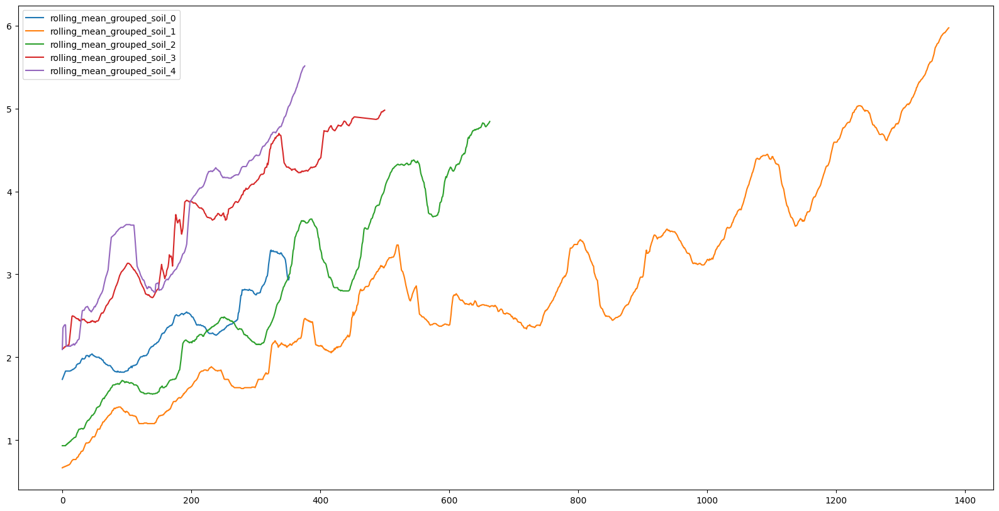

In [92]:
# series are not of same length => visualized here!
import re

df_comb_plot = df_comb
pattern = r"^NumericalIndex_*"

for colname in df_comb.columns:
    if re.search(pattern, colname):
        print("Drop: ", colname)
        df_comb_plot = df_comb_plot.drop(columns=colname, axis=1)
        
df_comb_plot.plot(figsize = (20,10))
print(len(df_comb_plot.columns))

In [93]:
# Split dataset into train and test set
def split_data(data, split_date):
    return data[data.index <= split_date].copy(), \
           data[data.index >  split_date].copy()

train, test = split_data(data, pd.to_datetime('2023-04-25 15:30')) # splitting the data for training before 15th June

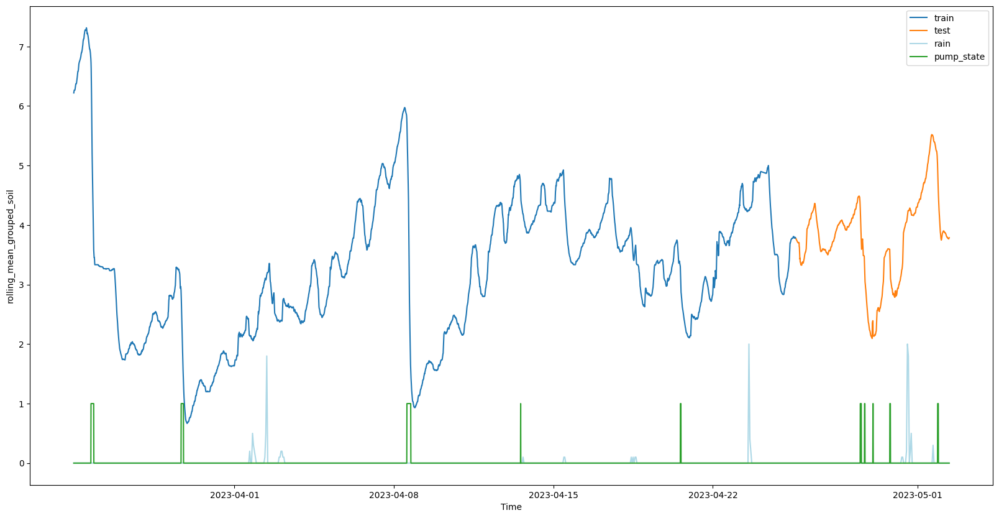

In [94]:
fig = plt.figure(figsize=(20, 10))
plt.xlabel('Time')
plt.ylabel('rolling_mean_grouped_soil')
plt.plot(train.index,train['rolling_mean_grouped_soil'], label='train')
plt.plot(test.index,test['rolling_mean_grouped_soil'], label='test')
plt.plot(data.index, data['Rain'], label='rain', color='lightblue')
plt.plot(data.index, data['pump_state'], label='pump_state')
plt.legend()
plt.show()

## Create lag features 
In this section lag features are created to increase the models performance with former soil drying examples.

### TODO: Omit lag features that are shorter than current dataframe or series.

In [95]:
cut_sub_dfs[0].dtypes

Timestamp                         datetime64[ns]
Temperature                              float64
Humidity                                 float64
Rain                                     float64
Cloudcover                               float64
Shortwave_Radiation                      float64
Windspeed                                float64
Winddirection                            float64
Soil_temperature_7-28                    float64
Soil_moisture_0-7                        float64
Et0_evapotranspiration                   float64
grouped_soil                             float64
grouped_resistance                       float64
grouped_soil_temp                        float64
rolling_mean_grouped_soil                float64
rolling_mean_grouped_soil_temp           float64
hour                                       int64
minute                                     int64
date                                       int64
month                                      int64
day_of_year         

In [96]:
from pycaret.regression import *

exp=[]
to_be_dropped = ['NumericalIndex', 'minute', 'Timestamp','gradient','grouped_soil',
                 'grouped_resistance','grouped_soil_temp']

for i in range(len(cut_sub_dfs)):
    exp.append(RegressionExperiment())
    
    exp[i].setup(cut_sub_dfs[i], 
                target = 'rolling_mean_grouped_soil', 
                session_id = 123,
                ignore_features = to_be_dropped,
                train_size = 0.8,
                use_gpu=False,                
    )

,Description,Value
0,Session id,123
1,Target,rolling_mean_grouped_soil
2,Target type,Regression
3,Original data shape,"(353, 25)"
4,Transformed data shape,"(353, 18)"
5,Transformed train set shape,"(282, 18)"
6,Transformed test set shape,"(71, 18)"
7,Ignore features,7
8,Numeric features,17
9,Preprocess,True


,Description,Value
0,Session id,123
1,Target,rolling_mean_grouped_soil
2,Target type,Regression
3,Original data shape,"(1376, 25)"
4,Transformed data shape,"(1376, 18)"
5,Transformed train set shape,"(1100, 18)"
6,Transformed test set shape,"(276, 18)"
7,Ignore features,7
8,Numeric features,17
9,Preprocess,True


,Description,Value
0,Session id,123
1,Target,rolling_mean_grouped_soil
2,Target type,Regression
3,Original data shape,"(664, 25)"
4,Transformed data shape,"(664, 18)"
5,Transformed train set shape,"(531, 18)"
6,Transformed test set shape,"(133, 18)"
7,Ignore features,7
8,Numeric features,17
9,Preprocess,True


,Description,Value
0,Session id,123
1,Target,rolling_mean_grouped_soil
2,Target type,Regression
3,Original data shape,"(501, 25)"
4,Transformed data shape,"(501, 18)"
5,Transformed train set shape,"(400, 18)"
6,Transformed test set shape,"(101, 18)"
7,Ignore features,7
8,Numeric features,17
9,Preprocess,True


,Description,Value
0,Session id,123
1,Target,rolling_mean_grouped_soil
2,Target type,Regression
3,Original data shape,"(377, 25)"
4,Transformed data shape,"(377, 18)"
5,Transformed train set shape,"(301, 18)"
6,Transformed test set shape,"(76, 18)"
7,Ignore features,7
8,Numeric features,17
9,Preprocess,True


In [97]:
# show available models
for i in range(len(cut_sub_dfs)):
    print(exp[i].models())

                                       Name  \
ID                                            
lr                        Linear Regression   
lasso                      Lasso Regression   
ridge                      Ridge Regression   
en                              Elastic Net   
lar                  Least Angle Regression   
llar           Lasso Least Angle Regression   
omp             Orthogonal Matching Pursuit   
br                           Bayesian Ridge   
ard       Automatic Relevance Determination   
par            Passive Aggressive Regressor   
ransac              Random Sample Consensus   
tr                       TheilSen Regressor   
huber                       Huber Regressor   
kr                             Kernel Ridge   
svm               Support Vector Regression   
knn                   K Neighbors Regressor   
dt                  Decision Tree Regressor   
rf                  Random Forest Regressor   
et                    Extra Trees Regressor   
ada          

In [98]:
best = []
for i in range(len(cut_sub_dfs)):
    print("This is for the", i+1, "part of the dataset: ")
    best.append(exp[i].compare_models(
        n_select = 12,
        fold = 10,
        sort = 'R2',
        verbose = 1,
        exclude=['lar','dummy','par','omp']
        )
    )

This is for the 1 part of the dataset: 


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lr,Linear Regression,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,4.2980
et,Extra Trees Regressor,0.0029,0.0000,0.0051,0.9998,0.0014,0.0012,3.3910
rf,Random Forest Regressor,0.0042,0.0001,0.0077,0.9996,0.0022,0.0017,3.3890
gbr,Gradient Boosting Regressor,0.0036,0.0001,0.0070,0.9996,0.0020,0.0015,3.4000
catboost,CatBoost Regressor,0.0073,0.0001,0.0110,0.9992,0.0032,0.0031,3.5080
dt,Decision Tree Regressor,0.0065,0.0002,0.0131,0.9989,0.0036,0.0026,3.3750
lightgbm,Light Gradient Boosting Machine,0.0083,0.0003,0.0157,0.9983,0.0044,0.0034,3.3740
xgboost,Extreme Gradient Boosting,0.0098,0.0003,0.0165,0.9981,0.0048,0.0042,3.3970
ada,AdaBoost Regressor,0.0210,0.0008,0.0271,0.9956,0.0083,0.0094,3.3810
br,Bayesian Ridge,0.0523,0.0048,0.0690,0.9712,0.0194,0.0215,3.3830


Processing:   0%|          | 0/80 [00:00<?, ?it/s]

This is for the 2 part of the dataset: 


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,0.0038,0.0001,0.0072,1.0000,0.0024,0.0017,3.4550
et,Extra Trees Regressor,0.0026,0.0000,0.0043,1.0000,0.0013,0.0011,3.4250
dt,Decision Tree Regressor,0.0058,0.0001,0.0113,0.9999,0.0034,0.0024,3.3940
gbr,Gradient Boosting Regressor,0.0076,0.0001,0.0112,0.9999,0.0032,0.0031,3.4100
lightgbm,Light Gradient Boosting Machine,0.0077,0.0002,0.0129,0.9999,0.0034,0.0031,3.3970
catboost,CatBoost Regressor,0.0125,0.0003,0.0174,0.9998,0.0048,0.0050,3.4470
xgboost,Extreme Gradient Boosting,0.0110,0.0004,0.0185,0.9997,0.0045,0.0041,3.3930
lr,Linear Regression,0.0230,0.0017,0.0396,0.9988,0.0074,0.0073,3.4770
ada,AdaBoost Regressor,0.0748,0.0093,0.0939,0.9932,0.0305,0.0344,3.4110
ridge,Ridge Regression,0.2202,0.0740,0.2711,0.9470,0.0707,0.0860,3.4820


Processing:   0%|          | 0/80 [00:00<?, ?it/s]

This is for the 3 part of the dataset: 


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lr,Linear Regression,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,3.4620
et,Extra Trees Regressor,0.0032,0.0000,0.0049,1.0000,0.0014,0.0013,3.5670
rf,Random Forest Regressor,0.0048,0.0001,0.0077,0.9999,0.0021,0.0019,3.5000
gbr,Gradient Boosting Regressor,0.0064,0.0001,0.0101,0.9999,0.0029,0.0027,3.5090
dt,Decision Tree Regressor,0.0084,0.0002,0.0151,0.9998,0.0042,0.0034,3.5020
lightgbm,Light Gradient Boosting Machine,0.0104,0.0003,0.0168,0.9997,0.0052,0.0045,3.4130
catboost,CatBoost Regressor,0.0131,0.0003,0.0178,0.9997,0.0053,0.0055,3.4250
xgboost,Extreme Gradient Boosting,0.0139,0.0006,0.0246,0.9995,0.0064,0.0053,3.4360
ada,AdaBoost Regressor,0.0500,0.0039,0.0622,0.9967,0.0212,0.0239,3.4440
ridge,Ridge Regression,0.1172,0.0216,0.1466,0.9817,0.0428,0.0493,3.4300


Processing:   0%|          | 0/80 [00:00<?, ?it/s]

This is for the 4 part of the dataset: 


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lr,Linear Regression,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,3.4550
et,Extra Trees Regressor,0.0037,0.0000,0.0066,0.9999,0.0015,0.0010,3.5450
rf,Random Forest Regressor,0.0059,0.0002,0.0116,0.9998,0.0028,0.0018,3.4490
gbr,Gradient Boosting Regressor,0.0055,0.0001,0.0103,0.9998,0.0025,0.0016,3.4490
catboost,CatBoost Regressor,0.0118,0.0003,0.0175,0.9995,0.0040,0.0034,3.4870
lightgbm,Light Gradient Boosting Machine,0.0122,0.0004,0.0202,0.9993,0.0053,0.0039,3.4390
xgboost,Extreme Gradient Boosting,0.0134,0.0006,0.0242,0.9991,0.0054,0.0038,3.6280
dt,Decision Tree Regressor,0.0097,0.0007,0.0227,0.9990,0.0053,0.0029,3.4090
ada,AdaBoost Regressor,0.0415,0.0026,0.0505,0.9959,0.0108,0.0114,3.4060
ridge,Ridge Regression,0.1403,0.0318,0.1777,0.9511,0.0396,0.0401,3.5040


Processing:   0%|          | 0/80 [00:00<?, ?it/s]

This is for the 5 part of the dataset: 


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.0049,0.0001,0.0094,0.9998,0.0023,0.0015,3.5200
lr,Linear Regression,0.0104,0.0002,0.0136,0.9997,0.0029,0.0028,3.5350
gbr,Gradient Boosting Regressor,0.0085,0.0002,0.0134,0.9997,0.0030,0.0024,3.4860
rf,Random Forest Regressor,0.0090,0.0004,0.0186,0.9994,0.0042,0.0027,3.4110
dt,Decision Tree Regressor,0.0144,0.0008,0.0261,0.9989,0.0056,0.0041,3.5330
xgboost,Extreme Gradient Boosting,0.0186,0.0010,0.0308,0.9986,0.0069,0.0053,3.5530
catboost,CatBoost Regressor,0.0145,0.0011,0.0262,0.9986,0.0066,0.0046,3.5560
lightgbm,Light Gradient Boosting Machine,0.0214,0.0013,0.0340,0.9982,0.0079,0.0064,3.5800
ada,AdaBoost Regressor,0.0393,0.0030,0.0527,0.9957,0.0122,0.0116,3.5660
br,Bayesian Ridge,0.0793,0.0112,0.1043,0.9845,0.0261,0.0250,3.5160


Processing:   0%|          | 0/80 [00:00<?, ?it/s]

In [99]:
for i in range(len(best)):
    print("\n The best model, for cut_sub_dfs[", i,"] is:")
    print(best[i][0])


 The best model, for cut_sub_dfs[ 0 ] is:
LinearRegression(n_jobs=-1)

 The best model, for cut_sub_dfs[ 1 ] is:
RandomForestRegressor(n_jobs=-1, random_state=123)

 The best model, for cut_sub_dfs[ 2 ] is:
LinearRegression(n_jobs=-1)

 The best model, for cut_sub_dfs[ 3 ] is:
LinearRegression(n_jobs=-1)

 The best model, for cut_sub_dfs[ 4 ] is:
ExtraTreesRegressor(n_jobs=-1, random_state=123)


In [100]:
# Train only catboost
catboost_models = []
for i in range(len(cut_sub_dfs)):
    catboost_models.append(exp[i].create_model('catboost'))

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0065,0.0001,0.0086,0.9997,0.0026,0.0029
1,0.0092,0.0002,0.0140,0.9990,0.0047,0.0044
2,0.0076,0.0001,0.0108,0.9995,0.0030,0.0031
3,0.0062,0.0001,0.0079,0.9994,0.0025,0.0029
4,0.0059,0.0001,0.0071,0.9997,0.0020,0.0023
5,0.0076,0.0001,0.0111,0.9992,0.0029,0.0030
6,0.0075,0.0001,0.0098,0.9992,0.0029,0.0033
7,0.0076,0.0001,0.0104,0.9990,0.0034,0.0036
8,0.0042,0.0000,0.0053,0.9999,0.0015,0.0018


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0141,0.0005,0.0219,0.9997,0.0057,0.0056
1,0.0137,0.0004,0.0212,0.9997,0.0054,0.0051
2,0.0118,0.0002,0.0158,0.9998,0.0048,0.0052
3,0.0125,0.0003,0.0161,0.9998,0.0046,0.0051
4,0.0107,0.0002,0.0143,0.9998,0.0039,0.0040
5,0.0116,0.0002,0.0151,0.9998,0.0043,0.0047
6,0.0109,0.0002,0.0143,0.9999,0.0047,0.0050
7,0.0119,0.0003,0.0174,0.9998,0.0041,0.0043
8,0.0141,0.0004,0.0189,0.9997,0.0051,0.0054


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0147,0.0005,0.0213,0.9996,0.0071,0.0070
1,0.0123,0.0003,0.0167,0.9998,0.0047,0.0052
2,0.0109,0.0003,0.0167,0.9998,0.0040,0.0039
3,0.0156,0.0005,0.0218,0.9996,0.0057,0.0059
4,0.0103,0.0002,0.0128,0.9999,0.0041,0.0051
5,0.0141,0.0003,0.0182,0.9997,0.0054,0.0057
6,0.0128,0.0003,0.0174,0.9997,0.0060,0.0056
7,0.0136,0.0003,0.0174,0.9997,0.0056,0.0060
8,0.0144,0.0004,0.0200,0.9997,0.0062,0.0059


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0148,0.0006,0.0243,0.9991,0.0058,0.0043
1,0.0126,0.0003,0.0162,0.9995,0.0033,0.0033
2,0.0139,0.0003,0.0183,0.9996,0.0046,0.0044
3,0.0095,0.0002,0.0136,0.9997,0.0030,0.0027
4,0.0086,0.0002,0.0130,0.9998,0.0032,0.0026
5,0.0120,0.0005,0.0217,0.9992,0.0046,0.0032
6,0.0103,0.0002,0.0131,0.9998,0.0029,0.0029
7,0.0143,0.0004,0.0199,0.9994,0.0050,0.0045
8,0.0112,0.0003,0.0176,0.9994,0.0037,0.0029


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0258,0.0067,0.0820,0.9917,0.0246,0.0103
1,0.0157,0.0005,0.0220,0.9994,0.0056,0.0052
2,0.0102,0.0002,0.0131,0.9998,0.0029,0.0028
3,0.0102,0.0002,0.0140,0.9997,0.0036,0.0033
4,0.0132,0.0003,0.0177,0.9993,0.0036,0.0035
5,0.0155,0.0008,0.0281,0.9988,0.0062,0.0045
6,0.0093,0.0002,0.0124,0.9998,0.0031,0.0029
7,0.0165,0.0006,0.0248,0.9991,0.0067,0.0056
8,0.0107,0.0002,0.0158,0.9997,0.0033,0.0027


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

## Analyze Model

You can use the `plot_model` function to analyzes the performance of a trained model on the test set. It may require re-training the model in certain cases.

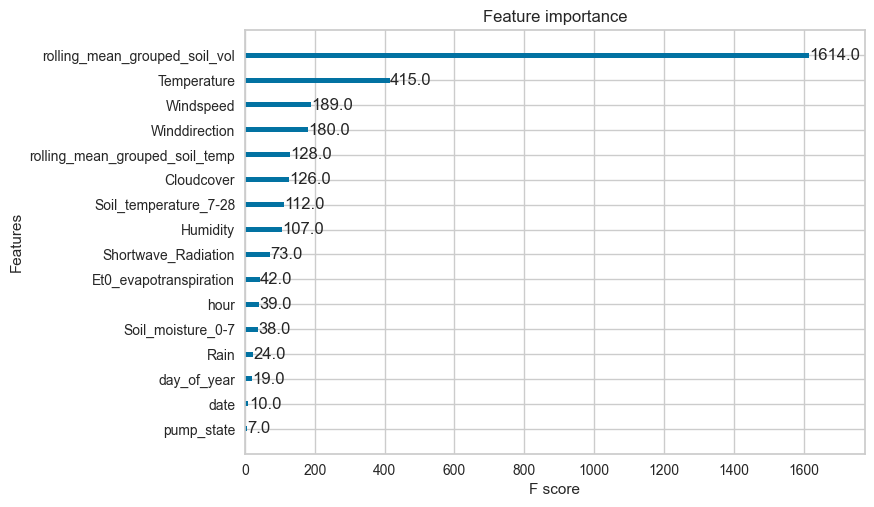

In [124]:
import xgboost as xgb

X = data.drop(['rolling_mean_grouped_soil', 'minute', 'grouped_soil', 'grouped_resistance', 'grouped_soil_temp', 'gradient', 'NumericalIndex'],axis=1)
y = data['rolling_mean_grouped_soil']

# Assuming you have already trained the XGBoost model
xgboost_model = xgb.XGBRegressor()
xgboost_model.fit(X, y)  # Replace X and y with your training data

# Plot feature importance
xgb.plot_importance(xgboost_model)
plt.show()

An alternate to `plot_model` function is `evaluate_model`. It can only be used in Notebook since it uses ipywidget.

## Save Model

Finally, you can save the entire pipeline on disk for later use, using pycaret's `save_model` function.

In [102]:
# save pipeline
for i in range(len(best)):
    exp.save_model(best[i], 'all_in_one' + str(i))

AttributeError: 'list' object has no attribute 'save_model'

In [ ]:
# load pipeline
loaded_best_pipeline = []
for i in range(len(best)): # TODO: exp will not work if it is not set before, use OS later
    loaded_best_pipeline.append(load_model('my_weather_SPLIT_pipeline_TS_' + str(i)))
    loaded_best_pipeline

## ✅ Tune Model

The `tune_model` function tunes the hyperparameters of the model. The output of this function is a scoring grid with cross-validated scores by fold. The best model is selected based on the metric defined in optimize parameter. Metrics evaluated during cross-validation can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function.

In [123]:
# tune hyperparameters of best without grid
def tune_all_without_grid(best):
    tuned_best_models_array = []
    for j in range(len(exp)):
        tuned_best_models = []
        for i in range(len(best[j])):
            print("This is for DataFrame", j+1, "This is for the",i+1,".best model:",best[j][i])
            tuned_best_models.append(exp[j].tune_model(best[j][i])) #TODO: Problem: not all estimators allow tuning without grid
        tuned_best_models_array.append(tuned_best_models)
    return tuned_best_models_array
        
tuned_best_models_array = tune_all_without_grid(best)

This is for DataFrame 1 This is for the 1 .best model: LinearRegression(n_jobs=-1)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
1,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
2,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
3,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
4,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
5,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
6,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
7,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
8,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 1 This is for the 2 .best model: ExtraTreesRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0128,0.0003,0.0171,0.9987,0.0048,0.0053
1,0.0227,0.0009,0.0302,0.9954,0.0098,0.0104
2,0.0210,0.0007,0.0270,0.9967,0.0079,0.0089
3,0.0152,0.0004,0.0191,0.9964,0.0058,0.0067
4,0.0166,0.0004,0.0206,0.9974,0.0061,0.0069
5,0.0209,0.0006,0.0236,0.9964,0.0067,0.0084
6,0.0200,0.0006,0.0235,0.9955,0.0072,0.0090
7,0.0237,0.0010,0.0317,0.9910,0.0105,0.0113
8,0.0188,0.0005,0.0228,0.9974,0.0064,0.0077


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 1 This is for the 3 .best model: RandomForestRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0120,0.0002,0.0154,0.9989,0.0043,0.0049
1,0.0179,0.0007,0.0266,0.9965,0.0090,0.0085
2,0.0164,0.0004,0.0208,0.9980,0.0064,0.0072
3,0.0146,0.0003,0.0186,0.9966,0.0057,0.0066
4,0.0160,0.0004,0.0205,0.9974,0.0059,0.0066
5,0.0167,0.0004,0.0191,0.9976,0.0054,0.0067
6,0.0145,0.0003,0.0178,0.9974,0.0057,0.0068
7,0.0178,0.0007,0.0256,0.9941,0.0086,0.0086
8,0.0168,0.0005,0.0213,0.9977,0.0060,0.0068


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 1 This is for the 4 .best model: GradientBoostingRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0067,0.0001,0.0091,0.9996,0.0026,0.0028
1,0.0135,0.0008,0.0287,0.9959,0.0080,0.0058
2,0.0074,0.0002,0.0143,0.9991,0.0039,0.0029
3,0.0041,0.0000,0.0060,0.9996,0.0019,0.0019
4,0.0070,0.0003,0.0179,0.9981,0.0049,0.0028
5,0.0095,0.0002,0.0158,0.9984,0.0040,0.0035
6,0.0070,0.0001,0.0117,0.9989,0.0031,0.0029
7,0.0085,0.0002,0.0141,0.9982,0.0040,0.0037
8,0.0135,0.0006,0.0235,0.9972,0.0062,0.0052


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 1 This is for the 5 .best model: <catboost.core.CatBoostRegressor object at 0x000001F0E2EA7A00>


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0135,0.0003,0.0173,0.9987,0.0052,0.0058
1,0.0127,0.0003,0.0184,0.9983,0.0058,0.0058
2,0.0125,0.0003,0.0168,0.9987,0.0047,0.0052
3,0.0148,0.0004,0.0189,0.9965,0.0060,0.0069
4,0.0094,0.0002,0.0135,0.9989,0.0038,0.0038
5,0.0092,0.0001,0.0118,0.9991,0.0034,0.0038
6,0.0111,0.0003,0.0160,0.9979,0.0045,0.0047
7,0.0136,0.0004,0.0188,0.9968,0.0062,0.0065
8,0.0145,0.0004,0.0190,0.9982,0.0056,0.0061


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 1 This is for the 6 .best model: DecisionTreeRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0183,0.0005,0.0234,0.9976,0.0070,0.0079
1,0.0165,0.0004,0.0206,0.9979,0.0063,0.0075
2,0.0183,0.0008,0.0288,0.9962,0.0081,0.0075
3,0.0154,0.0005,0.0226,0.9950,0.0073,0.0072
4,0.0183,0.0007,0.0263,0.9958,0.0075,0.0075
5,0.0184,0.0009,0.0303,0.9941,0.0077,0.0069
6,0.0204,0.0007,0.0273,0.9939,0.0079,0.0089
7,0.0161,0.0004,0.0202,0.9963,0.0064,0.0075
8,0.0159,0.0005,0.0215,0.9977,0.0060,0.0064


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 1 This is for the 7 .best model: LGBMRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0467,0.0034,0.0582,0.9850,0.0170,0.0200
1,0.0577,0.0052,0.0723,0.9738,0.0224,0.0262
2,0.0495,0.0044,0.0663,0.9799,0.0188,0.0207
3,0.0420,0.0025,0.0496,0.9758,0.0149,0.0187
4,0.0499,0.0042,0.0650,0.9743,0.0181,0.0201
5,0.0474,0.0027,0.0522,0.9824,0.0151,0.0196
6,0.0451,0.0039,0.0625,0.9679,0.0192,0.0205
7,0.0529,0.0043,0.0659,0.9611,0.0214,0.0250
8,0.0408,0.0028,0.0531,0.9858,0.0150,0.0168


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 1 This is for the 8 .best model: XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=1

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0087,0.0002,0.0140,0.9991,0.0039,0.0036
1,0.0096,0.0003,0.0163,0.9987,0.0052,0.0043
2,0.0089,0.0002,0.0154,0.9989,0.0039,0.0034
3,0.0060,0.0001,0.0082,0.9993,0.0025,0.0027
4,0.0074,0.0001,0.0119,0.9991,0.0032,0.0029
5,0.0065,0.0001,0.0104,0.9993,0.0028,0.0025
6,0.0120,0.0005,0.0233,0.9955,0.0065,0.0050
7,0.0078,0.0002,0.0133,0.9984,0.0042,0.0035
8,0.0065,0.0001,0.0105,0.9994,0.0029,0.0026


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 1 This is for the 9 .best model: AdaBoostRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0115,0.0002,0.0140,0.9991,0.0043,0.0050
1,0.0121,0.0003,0.0173,0.9985,0.0059,0.0059
2,0.0163,0.0006,0.0241,0.9973,0.0066,0.0066
3,0.0077,0.0001,0.0102,0.9990,0.0033,0.0035
4,0.0116,0.0002,0.0141,0.9988,0.0041,0.0048
5,0.0077,0.0001,0.0098,0.9994,0.0029,0.0032
6,0.0181,0.0006,0.0236,0.9954,0.0077,0.0086
7,0.0100,0.0002,0.0128,0.9985,0.0042,0.0048
8,0.0093,0.0001,0.0119,0.9993,0.0036,0.0040


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 1 This is for the 10 .best model: BayesianRidge()


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0574,0.0059,0.0768,0.9739,0.0215,0.0233
1,0.0601,0.0055,0.0741,0.9725,0.0219,0.0259
2,0.0557,0.0060,0.0774,0.9725,0.0208,0.0217
3,0.0449,0.0035,0.0590,0.9657,0.0170,0.0193
4,0.0589,0.0059,0.0771,0.9639,0.0201,0.0221
5,0.0514,0.0040,0.0633,0.9741,0.0175,0.0205
6,0.0512,0.0036,0.0600,0.9705,0.0177,0.0223
7,0.0461,0.0031,0.0554,0.9725,0.0185,0.0218
8,0.0466,0.0045,0.0672,0.9772,0.0174,0.0177


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 1 This is for the 11 .best model: Ridge(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0596,0.0064,0.0803,0.9714,0.0222,0.0240
1,0.0580,0.0056,0.0749,0.9719,0.0221,0.0249
2,0.0577,0.0064,0.0800,0.9706,0.0215,0.0225
3,0.0467,0.0037,0.0612,0.9631,0.0175,0.0199
4,0.0587,0.0063,0.0792,0.9619,0.0206,0.0220
5,0.0525,0.0042,0.0652,0.9725,0.0176,0.0205
6,0.0478,0.0035,0.0591,0.9714,0.0174,0.0206
7,0.0444,0.0030,0.0550,0.9728,0.0183,0.0209
8,0.0483,0.0050,0.0706,0.9748,0.0182,0.0182


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 1 This is for the 12 .best model: KNeighborsRegressor(n_jobs=-1)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0937,0.0202,0.1421,0.9106,0.0438,0.0413
1,0.0585,0.0077,0.0880,0.9612,0.0281,0.0277
2,0.0392,0.0059,0.0765,0.9732,0.0225,0.0167
3,0.0915,0.0170,0.1304,0.8325,0.0399,0.0404
4,0.0745,0.0166,0.1290,0.8990,0.0367,0.0298
5,0.0648,0.0107,0.1032,0.9311,0.0320,0.0279
6,0.0494,0.0058,0.0762,0.9524,0.0241,0.0229
7,0.0615,0.0087,0.0931,0.9223,0.0305,0.0301
8,0.0644,0.0099,0.0995,0.9500,0.0300,0.0274


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 2 This is for the 1 .best model: RandomForestRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0247,0.0011,0.0328,0.9993,0.0088,0.0099
1,0.0270,0.0014,0.0372,0.9989,0.0111,0.0107
2,0.0233,0.0010,0.0321,0.9994,0.0105,0.0112
3,0.0240,0.0009,0.0299,0.9994,0.0087,0.0103
4,0.0235,0.0009,0.0303,0.9993,0.0082,0.0088
5,0.0263,0.0013,0.0355,0.9988,0.0130,0.0124
6,0.0277,0.0016,0.0398,0.9989,0.0162,0.0156
7,0.0242,0.0010,0.0323,0.9993,0.0089,0.0095
8,0.0247,0.0011,0.0331,0.9991,0.0095,0.0101


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 2 This is for the 2 .best model: ExtraTreesRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0460,0.0034,0.0587,0.9977,0.0160,0.0187
1,0.0537,0.0057,0.0757,0.9956,0.0217,0.0214
2,0.0442,0.0037,0.0605,0.9978,0.0185,0.0201
3,0.0493,0.0037,0.0610,0.9977,0.0157,0.0188
4,0.0489,0.0036,0.0601,0.9973,0.0150,0.0171
5,0.0435,0.0031,0.0561,0.9970,0.0159,0.0179
6,0.0475,0.0041,0.0638,0.9972,0.0173,0.0195
7,0.0501,0.0039,0.0622,0.9974,0.0170,0.0195
8,0.0449,0.0032,0.0568,0.9972,0.0158,0.0177


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 2 This is for the 3 .best model: DecisionTreeRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0170,0.0006,0.0245,0.9996,0.0064,0.0072
1,0.0164,0.0005,0.0231,0.9996,0.0057,0.0061
2,0.0169,0.0005,0.0222,0.9997,0.0067,0.0074
3,0.0189,0.0006,0.0236,0.9997,0.0073,0.0084
4,0.0157,0.0004,0.0211,0.9997,0.0054,0.0055
5,0.0178,0.0005,0.0228,0.9995,0.0064,0.0070
6,0.0172,0.0005,0.0234,0.9996,0.0093,0.0087
7,0.0191,0.0007,0.0261,0.9995,0.0064,0.0072
8,0.0170,0.0005,0.0213,0.9996,0.0061,0.0067


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 2 This is for the 4 .best model: GradientBoostingRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0056,0.0001,0.0078,1.0000,0.0026,0.0028
1,0.0047,0.0001,0.0071,1.0000,0.0019,0.0019
2,0.0062,0.0001,0.0096,0.9999,0.0045,0.0041
3,0.0063,0.0001,0.0094,0.9999,0.0032,0.0032
4,0.0048,0.0001,0.0071,1.0000,0.0019,0.0018
5,0.0044,0.0000,0.0066,1.0000,0.0028,0.0023
6,0.0064,0.0001,0.0105,0.9999,0.0048,0.0039
7,0.0068,0.0002,0.0150,0.9998,0.0046,0.0033
8,0.0055,0.0001,0.0100,0.9999,0.0035,0.0026


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 2 This is for the 5 .best model: LGBMRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0452,0.0035,0.0592,0.9977,0.0162,0.0183
1,0.0411,0.0033,0.0574,0.9975,0.0170,0.0167
2,0.0463,0.0044,0.0666,0.9973,0.0250,0.0259
3,0.0437,0.0033,0.0575,0.9980,0.0172,0.0194
4,0.0442,0.0034,0.0587,0.9974,0.0143,0.0152
5,0.0487,0.0041,0.0639,0.9961,0.0186,0.0202
6,0.0404,0.0045,0.0673,0.9969,0.0252,0.0205
7,0.0480,0.0039,0.0626,0.9973,0.0174,0.0190
8,0.0420,0.0035,0.0591,0.9970,0.0177,0.0179


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 2 This is for the 6 .best model: <catboost.core.CatBoostRegressor object at 0x000001F0E59F56F0>


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0201,0.0007,0.0274,0.9995,0.0086,0.0091
1,0.0264,0.0022,0.0467,0.9983,0.0149,0.0112
2,0.0258,0.0020,0.0450,0.9988,0.0170,0.0131
3,0.0272,0.0016,0.0399,0.9990,0.0138,0.0130
4,0.0200,0.0008,0.0279,0.9994,0.0076,0.0073
5,0.0264,0.0014,0.0373,0.9987,0.0108,0.0108
6,0.0255,0.0011,0.0331,0.9993,0.0118,0.0125
7,0.0191,0.0007,0.0271,0.9995,0.0067,0.0069
8,0.0237,0.0011,0.0336,0.9990,0.0096,0.0090


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 2 This is for the 7 .best model: XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=1

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0067,0.0001,0.0103,0.9999,0.0028,0.0029
1,0.0078,0.0002,0.0130,0.9999,0.0028,0.0027
2,0.0076,0.0001,0.0119,0.9999,0.0034,0.0032
3,0.0080,0.0002,0.0128,0.9999,0.0049,0.0039
4,0.0049,0.0000,0.0066,1.0000,0.0016,0.0017
5,0.0071,0.0001,0.0102,0.9999,0.0038,0.0033
6,0.0072,0.0001,0.0113,0.9999,0.0038,0.0037
7,0.0097,0.0003,0.0186,0.9998,0.0037,0.0031
8,0.0076,0.0001,0.0117,0.9999,0.0033,0.0031


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 2 This is for the 8 .best model: LinearRegression(n_jobs=-1)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0213,0.0016,0.0401,0.9989,0.0072,0.0068
1,0.0217,0.0011,0.0337,0.9991,0.0068,0.0071
2,0.0216,0.0011,0.0329,0.9993,0.0069,0.0077
3,0.0250,0.0025,0.0505,0.9984,0.0085,0.0074
4,0.0222,0.0014,0.0377,0.9989,0.0066,0.0062
5,0.0179,0.0006,0.0249,0.9994,0.0057,0.0064
6,0.0203,0.0007,0.0268,0.9995,0.0062,0.0074
7,0.0317,0.0039,0.0620,0.9974,0.0103,0.0089
8,0.0222,0.0014,0.0379,0.9988,0.0072,0.0071


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 2 This is for the 9 .best model: AdaBoostRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0474,0.0032,0.0564,0.9979,0.0188,0.0230
1,0.0365,0.0024,0.0490,0.9982,0.0155,0.0161
2,0.0454,0.0030,0.0546,0.9982,0.0187,0.0229
3,0.0476,0.0033,0.0572,0.9980,0.0184,0.0222
4,0.0432,0.0028,0.0533,0.9978,0.0162,0.0176
5,0.0411,0.0030,0.0545,0.9971,0.0175,0.0188
6,0.0440,0.0030,0.0547,0.9980,0.0188,0.0217
7,0.0420,0.0029,0.0543,0.9980,0.0158,0.0174
8,0.0414,0.0027,0.0522,0.9976,0.0170,0.0187


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 2 This is for the 10 .best model: Ridge(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.2258,0.0790,0.2810,0.9479,0.0722,0.0901
1,0.2484,0.0884,0.2974,0.9320,0.0788,0.0969
2,0.2195,0.0648,0.2547,0.9606,0.0728,0.0953
3,0.2135,0.0754,0.2745,0.9533,0.0721,0.0861
4,0.2253,0.0798,0.2825,0.9395,0.0681,0.0778
5,0.1941,0.0586,0.2420,0.9437,0.0670,0.0800
6,0.1999,0.0563,0.2373,0.9615,0.0644,0.0800
7,0.2493,0.0952,0.3085,0.9353,0.0753,0.0897
8,0.2091,0.0671,0.2591,0.9418,0.0646,0.0762


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 2 This is for the 11 .best model: BayesianRidge()


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0212,0.0016,0.0403,0.9989,0.0072,0.0068
1,0.0213,0.0011,0.0335,0.9991,0.0067,0.0070
2,0.0215,0.0011,0.0329,0.9993,0.0069,0.0077
3,0.0249,0.0026,0.0506,0.9984,0.0086,0.0074
4,0.0222,0.0014,0.0377,0.9989,0.0066,0.0061
5,0.0177,0.0006,0.0248,0.9994,0.0057,0.0064
6,0.0203,0.0007,0.0267,0.9995,0.0061,0.0074
7,0.0317,0.0039,0.0621,0.9974,0.0103,0.0089
8,0.0221,0.0014,0.0379,0.9988,0.0072,0.0071


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 2 This is for the 12 .best model: ElasticNet(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.2323,0.0968,0.3111,0.9361,0.0776,0.0933
1,0.2641,0.1162,0.3410,0.9106,0.0842,0.0967
2,0.2326,0.0833,0.2886,0.9495,0.0729,0.0915
3,0.2363,0.0989,0.3144,0.9388,0.0746,0.0864
4,0.2446,0.0975,0.3122,0.9261,0.0726,0.0837
5,0.2030,0.0649,0.2547,0.9376,0.0651,0.0783
6,0.2302,0.0818,0.2860,0.9441,0.0739,0.0927
7,0.2800,0.1325,0.3639,0.9100,0.0862,0.0996
8,0.2388,0.0896,0.2994,0.9223,0.0731,0.0863


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 3 This is for the 1 .best model: LinearRegression(n_jobs=-1)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
1,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
2,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
3,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
4,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
5,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
6,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
7,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
8,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 3 This is for the 2 .best model: ExtraTreesRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0349,0.0020,0.0446,0.9981,0.0137,0.0159
1,0.0274,0.0011,0.0334,0.9991,0.0101,0.0117
2,0.0383,0.0021,0.0455,0.9984,0.0122,0.0145
3,0.0334,0.0021,0.0462,0.9982,0.0130,0.0135
4,0.0256,0.0010,0.0319,0.9992,0.0106,0.0129
5,0.0325,0.0017,0.0411,0.9985,0.0110,0.0126
6,0.0372,0.0020,0.0448,0.9981,0.0122,0.0140
7,0.0329,0.0016,0.0400,0.9987,0.0110,0.0127
8,0.0335,0.0018,0.0425,0.9985,0.0133,0.0150


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 3 This is for the 3 .best model: RandomForestRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0200,0.0006,0.0240,0.9994,0.0073,0.0089
1,0.0228,0.0014,0.0373,0.9989,0.0153,0.0112
2,0.0240,0.0011,0.0324,0.9992,0.0084,0.0088
3,0.0242,0.0009,0.0303,0.9992,0.0088,0.0096
4,0.0134,0.0003,0.0176,0.9998,0.0067,0.0072
5,0.0257,0.0015,0.0381,0.9987,0.0106,0.0100
6,0.0202,0.0007,0.0261,0.9994,0.0071,0.0076
7,0.0200,0.0006,0.0235,0.9995,0.0065,0.0077
8,0.0271,0.0014,0.0371,0.9989,0.0107,0.0115


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 3 This is for the 4 .best model: GradientBoostingRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0105,0.0003,0.0169,0.9997,0.0051,0.0050
1,0.0116,0.0003,0.0183,0.9997,0.0055,0.0050
2,0.0090,0.0001,0.0121,0.9999,0.0036,0.0036
3,0.0106,0.0002,0.0155,0.9998,0.0046,0.0043
4,0.0079,0.0001,0.0110,0.9999,0.0036,0.0039
5,0.0080,0.0002,0.0128,0.9999,0.0040,0.0033
6,0.0088,0.0002,0.0127,0.9998,0.0031,0.0032
7,0.0067,0.0001,0.0084,0.9999,0.0023,0.0026
8,0.0107,0.0003,0.0159,0.9998,0.0048,0.0045


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 3 This is for the 5 .best model: DecisionTreeRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0211,0.0008,0.0278,0.9993,0.0098,0.0107
1,0.0229,0.0010,0.0309,0.9992,0.0094,0.0100
2,0.0202,0.0009,0.0304,0.9993,0.0090,0.0080
3,0.0247,0.0026,0.0514,0.9978,0.0215,0.0111
4,0.0195,0.0006,0.0251,0.9995,0.0079,0.0096
5,0.0225,0.0008,0.0279,0.9993,0.0086,0.0096
6,0.0164,0.0004,0.0209,0.9996,0.0054,0.0063
7,0.0201,0.0006,0.0254,0.9995,0.0070,0.0078
8,0.0222,0.0009,0.0302,0.9992,0.0084,0.0095


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 3 This is for the 6 .best model: LGBMRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0548,0.0045,0.0669,0.9957,0.0212,0.0242
1,0.0447,0.0052,0.0720,0.9958,0.0277,0.0220
2,0.0478,0.0038,0.0619,0.9971,0.0193,0.0203
3,0.0599,0.0066,0.0814,0.9944,0.0255,0.0257
4,0.0448,0.0041,0.0641,0.9968,0.0214,0.0231
5,0.0537,0.0042,0.0647,0.9964,0.0189,0.0224
6,0.0557,0.0052,0.0718,0.9951,0.0225,0.0243
7,0.0382,0.0024,0.0489,0.9980,0.0154,0.0164
8,0.0623,0.0084,0.0919,0.9930,0.0264,0.0274


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 3 This is for the 7 .best model: <catboost.core.CatBoostRegressor object at 0x000001F0E5C617E0>


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0216,0.0010,0.0311,0.9991,0.0085,0.0088
1,0.0281,0.0020,0.0444,0.9984,0.0110,0.0105
2,0.0220,0.0011,0.0326,0.9992,0.0086,0.0079
3,0.0275,0.0018,0.0421,0.9985,0.0106,0.0098
4,0.0239,0.0011,0.0337,0.9991,0.0094,0.0105
5,0.0178,0.0007,0.0270,0.9994,0.0067,0.0067
6,0.0214,0.0008,0.0278,0.9993,0.0075,0.0079
7,0.0271,0.0023,0.0483,0.9980,0.0107,0.0094
8,0.0293,0.0018,0.0429,0.9985,0.0108,0.0106


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 3 This is for the 8 .best model: XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=1

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0068,0.0001,0.0099,0.9999,0.0033,0.0032
1,0.0106,0.0003,0.0176,0.9998,0.0065,0.0052
2,0.0098,0.0004,0.0193,0.9997,0.0051,0.0035
3,0.0089,0.0002,0.0132,0.9999,0.0036,0.0034
4,0.0079,0.0001,0.0113,0.9999,0.0043,0.0043
5,0.0111,0.0005,0.0230,0.9995,0.0079,0.0049
6,0.0089,0.0002,0.0127,0.9998,0.0036,0.0036
7,0.0099,0.0004,0.0195,0.9997,0.0070,0.0045
8,0.0127,0.0004,0.0208,0.9996,0.0059,0.0051


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 3 This is for the 9 .best model: AdaBoostRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0346,0.0015,0.0392,0.9985,0.0129,0.0160
1,0.0286,0.0014,0.0371,0.9989,0.0125,0.0128
2,0.0368,0.0021,0.0458,0.9984,0.0130,0.0148
3,0.0336,0.0016,0.0403,0.9986,0.0126,0.0143
4,0.0308,0.0015,0.0382,0.9989,0.0146,0.0173
5,0.0296,0.0013,0.0363,0.9989,0.0119,0.0135
6,0.0263,0.0010,0.0320,0.9990,0.0104,0.0116
7,0.0205,0.0007,0.0257,0.9994,0.0091,0.0097
8,0.0312,0.0017,0.0413,0.9986,0.0138,0.0153


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 3 This is for the 10 .best model: Ridge(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1250,0.0256,0.1599,0.9753,0.0422,0.0496
1,0.1068,0.0177,0.1329,0.9859,0.0424,0.0485
2,0.0971,0.0161,0.1267,0.9878,0.0348,0.0384
3,0.1193,0.0233,0.1527,0.9804,0.0433,0.0476
4,0.1207,0.0220,0.1483,0.9830,0.0503,0.0611
5,0.1223,0.0235,0.1533,0.9797,0.0439,0.0503
6,0.1208,0.0218,0.1475,0.9792,0.0416,0.0482
7,0.1355,0.0244,0.1564,0.9794,0.0428,0.0526
8,0.1076,0.0200,0.1416,0.9834,0.0453,0.0493


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 3 This is for the 11 .best model: BayesianRidge()


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1243,0.0253,0.1590,0.9756,0.0420,0.0492
1,0.1071,0.0177,0.1331,0.9858,0.0425,0.0485
2,0.0969,0.0159,0.1262,0.9879,0.0347,0.0383
3,0.1188,0.0232,0.1523,0.9805,0.0431,0.0473
4,0.1198,0.0219,0.1480,0.9830,0.0503,0.0607
5,0.1222,0.0236,0.1536,0.9796,0.0439,0.0502
6,0.1205,0.0216,0.1469,0.9794,0.0414,0.0481
7,0.1351,0.0244,0.1561,0.9794,0.0427,0.0524
8,0.1071,0.0199,0.1410,0.9835,0.0451,0.0490


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 3 This is for the 12 .best model: HuberRegressor()


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.2114,0.0764,0.2765,0.9262,0.0790,0.0889
1,0.1493,0.0382,0.1953,0.9694,0.0552,0.0617
2,0.1399,0.0313,0.1769,0.9763,0.0481,0.0546
3,0.1719,0.0476,0.2181,0.9600,0.0631,0.0714
4,0.1270,0.0258,0.1607,0.9800,0.0528,0.0636
5,0.1940,0.0700,0.2646,0.9395,0.0704,0.0755
6,0.1640,0.0411,0.2028,0.9607,0.0569,0.0653
7,0.1550,0.0332,0.1822,0.9720,0.0492,0.0583
8,0.1647,0.0380,0.1949,0.9684,0.0526,0.0645


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 4 This is for the 1 .best model: LinearRegression(n_jobs=-1)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
1,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
2,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
3,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
4,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
5,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
6,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
7,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000
8,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 4 This is for the 2 .best model: ExtraTreesRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0318,0.0019,0.0435,0.9972,0.0101,0.0092
1,0.0345,0.0021,0.0455,0.9959,0.0109,0.0100
2,0.0249,0.0010,0.0315,0.9988,0.0076,0.0074
3,0.0262,0.0012,0.0343,0.9984,0.0075,0.0074
4,0.0375,0.0028,0.0525,0.9961,0.0135,0.0116
5,0.0289,0.0013,0.0366,0.9978,0.0079,0.0081
6,0.0327,0.0015,0.0393,0.9979,0.0093,0.0097
7,0.0309,0.0015,0.0391,0.9976,0.0093,0.0096
8,0.0268,0.0014,0.0369,0.9974,0.0076,0.0070


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 4 This is for the 3 .best model: RandomForestRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0347,0.0038,0.0620,0.9944,0.0170,0.0109
1,0.0201,0.0008,0.0276,0.9985,0.0063,0.0057
2,0.0180,0.0005,0.0223,0.9994,0.0051,0.0052
3,0.0224,0.0008,0.0288,0.9988,0.0065,0.0064
4,0.0223,0.0009,0.0307,0.9987,0.0077,0.0068
5,0.0182,0.0006,0.0241,0.9990,0.0052,0.0050
6,0.0227,0.0009,0.0296,0.9988,0.0067,0.0067
7,0.0251,0.0010,0.0320,0.9984,0.0084,0.0083
8,0.0197,0.0008,0.0281,0.9985,0.0060,0.0053


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 4 This is for the 4 .best model: GradientBoostingRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0084,0.0001,0.0122,0.9998,0.0026,0.0024
1,0.0081,0.0001,0.0113,0.9997,0.0025,0.0022
2,0.0113,0.0003,0.0180,0.9996,0.0046,0.0035
3,0.0104,0.0003,0.0174,0.9996,0.0040,0.0031
4,0.0098,0.0005,0.0230,0.9993,0.0069,0.0034
5,0.0082,0.0001,0.0114,0.9998,0.0024,0.0023
6,0.0086,0.0002,0.0147,0.9997,0.0030,0.0024
7,0.0129,0.0004,0.0197,0.9994,0.0051,0.0041
8,0.0074,0.0001,0.0103,0.9998,0.0022,0.0020


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 4 This is for the 5 .best model: <catboost.core.CatBoostRegressor object at 0x000001F0FA627190>


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0192,0.0008,0.0276,0.9989,0.0056,0.0051
1,0.0187,0.0011,0.0332,0.9978,0.0071,0.0050
2,0.0172,0.0007,0.0262,0.9992,0.0068,0.0054
3,0.0230,0.0012,0.0353,0.9983,0.0081,0.0067
4,0.0166,0.0005,0.0228,0.9993,0.0050,0.0047
5,0.0241,0.0016,0.0405,0.9973,0.0090,0.0067
6,0.0175,0.0005,0.0223,0.9993,0.0047,0.0049
7,0.0291,0.0025,0.0501,0.9961,0.0114,0.0087
8,0.0124,0.0003,0.0175,0.9994,0.0041,0.0034


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 4 This is for the 6 .best model: LGBMRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0439,0.0041,0.0641,0.9940,0.0159,0.0127
1,0.0375,0.0025,0.0497,0.9951,0.0115,0.0106
2,0.0366,0.0024,0.0489,0.9972,0.0118,0.0111
3,0.0405,0.0030,0.0546,0.9958,0.0126,0.0117
4,0.0419,0.0029,0.0535,0.9959,0.0131,0.0127
5,0.0390,0.0024,0.0486,0.9961,0.0098,0.0102
6,0.0350,0.0018,0.0424,0.9975,0.0099,0.0102
7,0.0473,0.0051,0.0711,0.9921,0.0200,0.0166
8,0.0381,0.0027,0.0516,0.9949,0.0100,0.0096


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 4 This is for the 7 .best model: XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=1

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0143,0.0005,0.0223,0.9993,0.0057,0.0044
1,0.0103,0.0002,0.0139,0.9996,0.0031,0.0029
2,0.0113,0.0003,0.0164,0.9997,0.0044,0.0037
3,0.0151,0.0006,0.0243,0.9992,0.0055,0.0045
4,0.0119,0.0003,0.0183,0.9995,0.0051,0.0039
5,0.0101,0.0002,0.0146,0.9996,0.0032,0.0028
6,0.0114,0.0002,0.0149,0.9997,0.0037,0.0036
7,0.0176,0.0009,0.0302,0.9986,0.0089,0.0065
8,0.0090,0.0002,0.0134,0.9997,0.0028,0.0024


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 4 This is for the 8 .best model: DecisionTreeRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0201,0.0011,0.0327,0.9984,0.0063,0.0051
1,0.0185,0.0007,0.0258,0.9987,0.0056,0.0051
2,0.0234,0.0014,0.0380,0.9983,0.0101,0.0075
3,0.0218,0.0014,0.0376,0.9980,0.0086,0.0064
4,0.0167,0.0005,0.0221,0.9993,0.0051,0.0048
5,0.0194,0.0007,0.0270,0.9988,0.0061,0.0054
6,0.0194,0.0007,0.0258,0.9991,0.0059,0.0057
7,0.0251,0.0017,0.0417,0.9973,0.0097,0.0077
8,0.0163,0.0005,0.0224,0.9990,0.0048,0.0043


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 4 This is for the 9 .best model: AdaBoostRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0215,0.0007,0.0272,0.9989,0.0058,0.0058
1,0.0200,0.0006,0.0246,0.9988,0.0055,0.0055
2,0.0241,0.0009,0.0298,0.9989,0.0073,0.0075
3,0.0310,0.0019,0.0438,0.9973,0.0097,0.0088
4,0.0212,0.0008,0.0287,0.9988,0.0063,0.0059
5,0.0221,0.0008,0.0287,0.9986,0.0065,0.0062
6,0.0142,0.0005,0.0218,0.9993,0.0051,0.0042
7,0.0251,0.0009,0.0305,0.9985,0.0077,0.0082
8,0.0182,0.0007,0.0257,0.9987,0.0053,0.0049


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 4 This is for the 10 .best model: Ridge(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1350,0.0313,0.1769,0.9544,0.0391,0.0378
1,0.1670,0.0423,0.2056,0.9164,0.0448,0.0457
2,0.1214,0.0234,0.1530,0.9721,0.0344,0.0343
3,0.1279,0.0262,0.1619,0.9634,0.0370,0.0376
4,0.1471,0.0352,0.1877,0.9500,0.0422,0.0430
5,0.1392,0.0309,0.1757,0.9489,0.0389,0.0392
6,0.1372,0.0305,0.1748,0.9576,0.0394,0.0401
7,0.1384,0.0320,0.1788,0.9499,0.0428,0.0439
8,0.1459,0.0318,0.1784,0.9389,0.0388,0.0397


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 4 This is for the 11 .best model: BayesianRidge()


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1346,0.0312,0.1766,0.9546,0.0391,0.0377
1,0.1662,0.0420,0.2050,0.9168,0.0447,0.0456
2,0.1209,0.0234,0.1530,0.9721,0.0344,0.0342
3,0.1278,0.0262,0.1619,0.9634,0.0370,0.0376
4,0.1472,0.0353,0.1879,0.9499,0.0422,0.0430
5,0.1392,0.0308,0.1756,0.9489,0.0389,0.0392
6,0.1371,0.0306,0.1750,0.9575,0.0395,0.0402
7,0.1384,0.0319,0.1786,0.9500,0.0428,0.0440
8,0.1457,0.0318,0.1784,0.9389,0.0388,0.0396


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 4 This is for the 12 .best model: KNeighborsRegressor(n_jobs=-1)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1654,0.1227,0.3503,0.8214,0.0725,0.0471
1,0.1067,0.0302,0.1738,0.9403,0.0380,0.0294
2,0.0709,0.0131,0.1143,0.9844,0.0230,0.0195
3,0.1144,0.0498,0.2231,0.9305,0.0487,0.0327
4,0.0950,0.0199,0.1410,0.9718,0.0326,0.0284
5,0.1816,0.0923,0.3039,0.8471,0.0660,0.0536
6,0.1091,0.0280,0.1672,0.9612,0.0402,0.0339
7,0.1216,0.0300,0.1731,0.9530,0.0389,0.0357
8,0.1499,0.0858,0.2929,0.8353,0.0594,0.0398


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 5 This is for the 1 .best model: ExtraTreesRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0356,0.0065,0.0804,0.9920,0.0238,0.0132
1,0.0251,0.0011,0.0328,0.9986,0.0090,0.0089
2,0.0247,0.0010,0.0318,0.9989,0.0073,0.0070
3,0.0274,0.0015,0.0383,0.9977,0.0107,0.0096
4,0.0347,0.0022,0.0473,0.9953,0.0098,0.0092
5,0.0219,0.0007,0.0274,0.9988,0.0060,0.0062
6,0.0272,0.0015,0.0388,0.9981,0.0100,0.0088
7,0.0274,0.0011,0.0328,0.9984,0.0087,0.0095
8,0.0208,0.0008,0.0286,0.9989,0.0060,0.0055


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 5 This is for the 2 .best model: LinearRegression(n_jobs=-1)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0137,0.0003,0.0186,0.9996,0.0046,0.0041
1,0.0104,0.0002,0.0127,0.9998,0.0030,0.0032
2,0.0112,0.0003,0.0164,0.9997,0.0029,0.0027
3,0.0075,0.0001,0.0094,0.9999,0.0021,0.0022
4,0.0093,0.0001,0.0122,0.9997,0.0022,0.0022
5,0.0092,0.0002,0.0131,0.9997,0.0025,0.0024
6,0.0104,0.0002,0.0127,0.9998,0.0026,0.0028
7,0.0089,0.0001,0.0115,0.9998,0.0027,0.0028
8,0.0147,0.0003,0.0185,0.9995,0.0035,0.0036


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 5 This is for the 3 .best model: GradientBoostingRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0146,0.0006,0.0237,0.9993,0.0059,0.0045
1,0.0096,0.0002,0.0143,0.9997,0.0038,0.0031
2,0.0140,0.0005,0.0222,0.9995,0.0038,0.0032
3,0.0148,0.0006,0.0251,0.9990,0.0058,0.0046
4,0.0164,0.0005,0.0212,0.9991,0.0044,0.0044
5,0.0191,0.0010,0.0314,0.9985,0.0064,0.0050
6,0.0106,0.0002,0.0148,0.9997,0.0032,0.0030
7,0.0132,0.0005,0.0223,0.9993,0.0056,0.0044
8,0.0126,0.0003,0.0174,0.9996,0.0033,0.0032


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 5 This is for the 4 .best model: RandomForestRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0319,0.0052,0.0719,0.9936,0.0212,0.0115
1,0.0197,0.0005,0.0232,0.9993,0.0056,0.0062
2,0.0227,0.0008,0.0276,0.9992,0.0059,0.0061
3,0.0217,0.0009,0.0306,0.9985,0.0082,0.0074
4,0.0236,0.0010,0.0311,0.9980,0.0066,0.0063
5,0.0310,0.0025,0.0502,0.9960,0.0108,0.0087
6,0.0239,0.0008,0.0289,0.9989,0.0065,0.0069
7,0.0230,0.0010,0.0313,0.9986,0.0085,0.0078
8,0.0189,0.0007,0.0266,0.9990,0.0051,0.0047


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 5 This is for the 5 .best model: DecisionTreeRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0309,0.0019,0.0431,0.9977,0.0100,0.0092
1,0.0220,0.0008,0.0280,0.9990,0.0067,0.0068
2,0.0312,0.0016,0.0395,0.9984,0.0074,0.0078
3,0.0271,0.0011,0.0327,0.9983,0.0077,0.0084
4,0.0283,0.0013,0.0356,0.9974,0.0076,0.0075
5,0.0363,0.0028,0.0526,0.9957,0.0105,0.0096
6,0.0266,0.0011,0.0337,0.9985,0.0069,0.0073
7,0.0247,0.0011,0.0328,0.9984,0.0087,0.0082
8,0.0264,0.0010,0.0315,0.9987,0.0060,0.0066


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 5 This is for the 6 .best model: XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=1

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0193,0.0017,0.0415,0.9979,0.0126,0.0072
1,0.0197,0.0009,0.0294,0.9989,0.0080,0.0065
2,0.0191,0.0012,0.0349,0.9987,0.0063,0.0046
3,0.0186,0.0008,0.0283,0.9987,0.0082,0.0067
4,0.0150,0.0003,0.0186,0.9993,0.0039,0.0040
5,0.0185,0.0006,0.0243,0.9991,0.0050,0.0050
6,0.0190,0.0009,0.0302,0.9988,0.0078,0.0061
7,0.0151,0.0005,0.0220,0.9993,0.0055,0.0050
8,0.0180,0.0012,0.0351,0.9983,0.0058,0.0042


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 5 This is for the 7 .best model: <catboost.core.CatBoostRegressor object at 0x000001F0E2E3B220>


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0342,0.0034,0.0581,0.9958,0.0169,0.0122
1,0.0260,0.0010,0.0323,0.9987,0.0075,0.0079
2,0.0270,0.0013,0.0354,0.9987,0.0074,0.0071
3,0.0298,0.0013,0.0362,0.9979,0.0090,0.0094
4,0.0306,0.0014,0.0374,0.9971,0.0079,0.0082
5,0.0368,0.0025,0.0502,0.9960,0.0113,0.0105
6,0.0185,0.0007,0.0273,0.9990,0.0062,0.0054
7,0.0390,0.0028,0.0528,0.9959,0.0130,0.0125
8,0.0237,0.0010,0.0309,0.9987,0.0063,0.0062


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 5 This is for the 8 .best model: LGBMRegressor(n_jobs=-1, random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0413,0.0038,0.0619,0.9953,0.0181,0.0150
1,0.0427,0.0028,0.0533,0.9964,0.0127,0.0134
2,0.0599,0.0077,0.0879,0.9919,0.0160,0.0148
3,0.0545,0.0066,0.0812,0.9895,0.0216,0.0186
4,0.0590,0.0066,0.0813,0.9862,0.0168,0.0151
5,0.0594,0.0064,0.0797,0.9900,0.0160,0.0157
6,0.0473,0.0035,0.0588,0.9956,0.0141,0.0145
7,0.0563,0.0065,0.0805,0.9905,0.0214,0.0202
8,0.0569,0.0075,0.0867,0.9899,0.0158,0.0139


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
This is for DataFrame 5 This is for the 9 .best model: AdaBoostRegressor(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0297,0.0019,0.0436,0.9976,0.0125,0.0103
1,0.0235,0.0011,0.0326,0.9986,0.0087,0.0077
2,0.0250,0.0010,0.0319,0.9989,0.0064,0.0064
3,0.0224,0.0009,0.0298,0.9986,0.0080,0.0075
4,0.0226,0.0009,0.0293,0.9982,0.0061,0.0060
5,0.0285,0.0019,0.0431,0.9971,0.0091,0.0079
6,0.0250,0.0010,0.0313,0.9987,0.0076,0.0075
7,0.0243,0.0011,0.0337,0.9983,0.0086,0.0083
8,0.0199,0.0007,0.0270,0.9990,0.0051,0.0047


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 5 This is for the 10 .best model: BayesianRidge()


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0877,0.0187,0.1369,0.9768,0.0388,0.0314
1,0.0672,0.0087,0.0935,0.9888,0.0255,0.0229
2,0.0807,0.0107,0.1032,0.9889,0.0244,0.0236
3,0.0929,0.0141,0.1187,0.9775,0.0313,0.0315
4,0.0743,0.0085,0.0922,0.9822,0.0201,0.0204
5,0.0654,0.0068,0.0825,0.9893,0.0184,0.0187
6,0.0866,0.0123,0.1107,0.9843,0.0274,0.0280
7,0.0780,0.0088,0.0939,0.9871,0.0248,0.0266
8,0.0704,0.0072,0.0851,0.9903,0.0190,0.0196


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 5 This is for the 11 .best model: Ridge(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0856,0.0182,0.1349,0.9775,0.0383,0.0307
1,0.0705,0.0098,0.0989,0.9875,0.0270,0.0240
2,0.0839,0.0118,0.1088,0.9876,0.0245,0.0238
3,0.0918,0.0136,0.1167,0.9783,0.0312,0.0312
4,0.0754,0.0088,0.0939,0.9816,0.0208,0.0211
5,0.0666,0.0072,0.0850,0.9887,0.0187,0.0188
6,0.0894,0.0128,0.1132,0.9836,0.0281,0.0289
7,0.0775,0.0084,0.0919,0.9876,0.0242,0.0265
8,0.0736,0.0089,0.0942,0.9881,0.0200,0.0200


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
This is for DataFrame 5 This is for the 12 .best model: ElasticNet(random_state=123)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.2511,0.1175,0.3428,0.8547,0.0868,0.0827
1,0.1819,0.0455,0.2133,0.9419,0.0517,0.0577
2,0.1777,0.0523,0.2286,0.9455,0.0453,0.0461
3,0.1741,0.0447,0.2113,0.9288,0.0559,0.0586
4,0.2152,0.0610,0.2470,0.8724,0.0516,0.0565
5,0.1934,0.0514,0.2267,0.9193,0.0485,0.0523
6,0.1804,0.0469,0.2167,0.9398,0.0518,0.0548
7,0.2160,0.0573,0.2393,0.9162,0.0602,0.0723
8,0.1994,0.0625,0.2499,0.9160,0.0510,0.0516


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Metric to optimize can be defined in `optimize` parameter (default = 'MASE'). Also, a custom tuned grid can be passed with `custom_grid` parameter. 

In [ ]:
for j in range(len(tuned_best_models_array)):
    print("Dataset: ",j+1,"\n------------")
    for i in range(len(tuned_best_models_array[j])):
        print(i+1,". :",tuned_best_models_array[j][i])

In [ ]:
current = best[0][0]
print(str(current.regressor), type(str(current.regressor)))
print(current.get_params().keys())
print(type(current).__name__)
print(type(current).__name__.split('.')[-1])
print(exp[0].models(internal = True).Name)

In [ ]:
for model in best[0]:
    column_reference = data.columns[0]
    print(model.__class__.__name__, column_reference)

In [ ]:
models = {'huber_cds_dt': 'HuberRegressor',
          'naive': 'NaiveBayes',
          'snaive': 'SeasonalNaiveBayes',
          'dt_cds_dt': 'DecisionTreeRegressor',
          'xgboost_cds_dt': 'XGBoostRegressor',
          'et_cds_dt': 'ExtraTreesRegressor',
          'lightgbm_cds_dt': 'LGBMRegressor',
          'gbr_cds_dt': 'GradientBoostingRegressor',
          'par_cds_dt': 'PassiveAggressiveRegressor',
          'ada_cds_dt': 'AdaBoostRegressor',
          'rf_cds_dt': 'RandomForestRegressor',
          'knn_cds_dt': 'KNeighborsRegressor',
          'catboost_cds_dt': 'catboost',
          'en_cds_dt': 'ElasticNet',
          'lasso_cds_dt': 'Lasso',
          'llar_cds_dt': 'LassoLars',
          'xgboost_cds_dt': 'XGBRegressor' 
}

models_dict = {v: k for k, v in models.items()}

print("Original dictionary:")
print(models)
print("\nSwapped dictionary:")
print(models_dict)

In [ ]:
# define tuning grid -> no grid for model defined, TODO: come back later
#grid = {'regressor__max_depth' : [None, 2, 4, 6, 8, 10, 12]}
#sp = {'regressor__max_depth' : [None, 2, 4, 6, 8, 10, 12]}
# define the custom grid
param_grid_linear = {
    'degree': [1, 2, 3],
    'deseasonal_model': ['multiplicative', 'additive'],
    #'fe_target_rr': [True, False],
    #'regressor__copy_X': [True, False],
    #'regressor__fit_intercept': [True, False],
    'regressor__n_jobs': [-1, 1, 2],
    #'regressor__normalize': [True, False],
    'regressor__positive': [True, False],
    'sp': [1, 2, 3],
    'window_length': [10, 20, 30]
}

param_grid_knn = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [10, 20, 30, 40, 50],
    'p': [1, 2]
}

params_grid = {
    'naive_bayes': {
        'alpha': [0.1, 0.5, 1.0],
        'fit_prior': [True, False]
    },
    'linear_regression': {
        'fit_intercept': [True, False],
        'normalize': [True, False]
    },
    'ridge': {
        'alpha': [0.1, 0.5, 1.0],
        'fit_intercept': [True, False],
        'normalize': [True, False],
        'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
    },
    'lasso': {
        'alpha': [0.1, 0.5, 1.0],
        'fit_intercept': [True, False],
        'normalize': [True, False],
        'selection': ['cyclic', 'random']
    },
    'elastic_net': {
        'alpha': [0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.9],
        'fit_intercept': [True, False],
        'normalize': [True, False],
        'selection': ['cyclic', 'random']
    },
    'knn': {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
        'leaf_size': [15, 20, 30, 40]
    },
    'decision_tree': {
        'criterion': ['gini', 'entropy'],
        'splitter': ['best', 'random'],
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'random_forest': {
        'n_estimators': [10, 50, 100],
        'criterion': ['gini', 'entropy'],
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    },
    'gradient_boosting': {
        'n_estimators': [10, 50, 100],
        'learning_rate': [0.01, 0.1, 1],
        'max_depth': [3, 5, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'subsample': [0.5, 0.7, 1],
        'max_features': ['auto', 'sqrt', 'log2']
    },
    'support_vector': {
        'C': [0.1, 0.5, 1.0],
        'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'degree': [2, 3, 4],
        'gamma': ['scale', 'auto']
    }
}

In [ ]:
# TODO: add content to the missing ones
params_grid_idNames = {
    'huber_cds_dt': {
        'regressor__epsilon': [1.35, 1.5, 1.75],
        'regressor__max_iter': [100, 200, 300],
        'regressor__alpha': [0.0001, 0.001, 0.01],
        'regressor__warm_start': [True, False]
    },
    'naive': { #not used, adpot
        'estimator__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]
    },
    'snaive': { #not used, adpot
        'estimator__sp': [2, 3, 4, 5, 6],
        'estimator__window_length': [2, 3, 4, 5, 6],
        'alpha': [0.1, 0.5, 1.0],
        'fit_intercept': [True, False],
        'normalize': [True, False],
        'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
    },
    'dt_cds_dt': {
        'regressor__ccp_alpha': [0.0, 0.1, 0.2],
        'regressor__criterion': ['poisson', 'friedman_mse', 'squared_error', 'absolute_error'],
        'regressor__max_depth': [None, 5, 10, 15, 20],
        'regressor__max_features': ['auto', 'sqrt', 'log2'],
        'regressor__max_leaf_nodes': [None, 5, 10, 15, 20],
        'regressor__min_impurity_decrease': [0.0, 0.1, 0.2],
        'regressor__min_samples_leaf': [1, 2, 4],
        'regressor__min_samples_split': [2, 5, 10],
        'regressor__min_weight_fraction_leaf': [0.0, 0.1, 0.2],
        'regressor__random_state': [None, 123],
        'regressor__splitter': ['best', 'random'],
        'degree': [1, 2, 3],
        'deseasonal_model': ['multiplicative', 'additive'],
        'sp': [1, 2, 3],
        'window_length': [2, 3, 4],
    },
#    'xgboost_cds_dt': {
#        'alpha': [0.1, 0.5, 1.0],
#        'l1_ratio': [0.1, 0.5, 0.9],
#        'fit_intercept': [True, False],
#        'normalize': [True, False],
#        'selection': ['cyclic', 'random']
#    },
    'et_cds_dt': {
        'regressor__n_estimators': [10, 50, 100],
        'regressor__criterion': ['poisson', 'friedman_mse', 'squared_error', 'absolute_error'],
        'regressor__max_depth': [None, 5, 10, 20],
        'regressor__min_samples_split': [2, 5, 10],
        'regressor__min_samples_leaf': [1, 2, 4],
        'regressor__bootstrap': [True, False]
    },
    'lightgbm_cds_dt': {
        'regressor__learning_rate': [0.01, 0.1, 0.3],
        'regressor__n_estimators': [50, 100, 150],
        'regressor__max_depth': [3, 5, 7],
        'regressor__num_leaves': [10, 20, 30],
        'regressor__min_child_samples': [1, 5, 10],
        'regressor__subsample': [0.5, 0.7, 0.9],
        'regressor__colsample_bytree': [0.5, 0.7, 0.9],
        'regressor__reg_alpha': [0, 0.1, 0.5, 1],
        'regressor__reg_lambda': [0, 0.1, 0.5, 1],
        'regressor__min_split_gain': [0, 0.1, 0.5],
        'regressor__max_bin': [100, 200, 300]
    },
    'gbr_cds_dt': {
        'regressor__n_estimators': [50, 100, 150],
        'regressor__max_depth': [3, 5, 7],
        'regressor__learning_rate': [0.01, 0.1, 0.3],
        'regressor__subsample': [0.5, 0.7, 0.9],
        'regressor__max_features': ['auto', 'sqrt', 'log2'],
        'regressor__alpha': [0.1, 0.3, 0.5],
        'regressor__min_samples_split': [2, 5, 10],
        'regressor__min_samples_leaf': [1, 2, 4],
        'regressor__max_leaf_nodes': [None, 5, 10, 20]
    },
    'par_cds_dt': { #not used, adpot
        'C': [0.1, 1, 10],
        'fit_intercept': [True, False],
        'max_iter': [1000, 2000, 3000],
        'tol': [1e-3, 1e-4, 1e-5],
        'early_stopping': [True, False],
        'validation_fraction': [0.1, 0.2, 0.3],
        'n_iter_no_change': [5, 10, 15],
        'kernel': ['linear', 'poly', 'rbf', 'sigmoid']

    },
    'ada_cds_dt': {#Valid parameters are: ['base_estimator', 'estimator', 'learning_rate', 'loss', 'n_estimators', 'random_state'].
        #'regressor__base_estimator': ['None'],
        'regressor__n_estimators': [10, 50, 100],
        'regressor__learning_rate': [0.01, 0.1, 1],
        'regressor__loss': ['linear', 'square', 'exponential'],
        'regressor__random_state': [123],
        'regressor__base_estimator': [None]
    },
    'rf_cds_dt': {
        'regressor__ccp_alpha': [0.0, 0.1, 0.2],
        'regressor__criterion': ['poisson', 'friedman_mse', 'squared_error', 'absolute_error'],
        'regressor__max_depth': [None, 5, 10, 15, 20],
        'regressor__max_features': ['auto', 'sqrt', 'log2'],
        'regressor__max_leaf_nodes': [None, 5, 10, 15, 20],
        'regressor__min_impurity_decrease': [0.0, 0.1, 0.2],
        'regressor__min_samples_leaf': [1, 2, 4],
        'regressor__min_samples_split': [2, 5, 10],
        'regressor__min_weight_fraction_leaf': [0.0, 0.1, 0.2],
        'regressor__random_state': [None, 123],
    },
    'knn_cds_dt': { #not used, adpot
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
        'leaf_size': [15, 20, 30, 40]
    },
    'catboost_cds_dt': {
        'regressor__iterations': [100, 200, 300],
        'regressor__learning_rate': [0.01, 0.1, 0.5],
        'regressor__depth': [4, 6, 8],
        'regressor__l2_leaf_reg': [1, 3, 5],
        'regressor__subsample': [0.5, 0.7, 1],
        'regressor__random_strength': [0.1, 0.5, 1],
        'regressor__eval_metric': ['RMSE', 'MAE', 'Poisson'],
        'regressor__iterations': [100, 200, 300],
        'regressor__learning_rate': [0.01, 0.1, 0.5],
        'regressor__depth': [4, 6, 8],
        'regressor__l2_leaf_reg': [1, 3, 5],
        'regressor__subsample': [0.5, 0.7, 1],
        'regressor__random_strength': [0.1, 0.5, 1],
    },
    'en_cds_dt': { #not used, adpot
        'n_estimators': [10, 50, 100],
        'learning_rate': [0.01, 0.1, 1],
        'max_depth': [3, 5, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'subsample': [0.5, 0.7, 1],
        'max_features': ['auto', 'sqrt', 'log2']
    },
    'lasso_cds_dt': { #not used, adpot
        'C': [0.1, 0.5, 1.0],
        'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'degree': [2, 3, 4],
        'gamma': ['scale', 'auto']
    },
    'llar_cds_dt': { #not used, adpot
        'n_estimators': [10, 50, 100],
        'criterion': ['gini', 'entropy'],
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    },
    'xgboost_cds_dt': {
        'regressor__learning_rate': [0.01, 0.1, 0.3],
        'regressor__n_estimators': [50, 100, 150],
        'regressor__max_depth': [3, 5, 7],
        'regressor__subsample': [0.5, 0.7, 0.9],
        'regressor__colsample_bytree': [0.5, 0.7, 0.9],
        'regressor__gamma': [0, 0.1, 0.5],
        'regressor__min_child_weight': [1, 5, 10],
        'regressor__reg_alpha': [0, 0.1, 0.5, 1],
        'regressor__reg_lambda': [0, 0.1, 0.5, 1],
        'regressor__max_delta_step': [0, 1, 2],
        'regressor__scale_pos_weight': [1, 2, 5]
    },
    'par_cds_dt': {
        'regressor__C': [0.1, 1, 10],
        'regressor__fit_intercept': [True, False],
        'regressor__max_iter': [1000, 2000, 3000],
        'regressor__tol': [1e-3, 1e-4, 1e-5],
        'regressor__early_stopping': [True, False],
        'regressor__validation_fraction': [0.1, 0.2, 0.3],
        'regressor__n_iter_no_change': [5, 10, 15]
    },
}

In [ ]:
#print( str(best[1][1].regressor))
match = re.match(r'<([A-Za-z]+)', str(best[1][6].regressor))
if match:
    print(match.group(1))


In [ ]:
# tune model with custom grid and metric = MAE
tuned_best_models_grid_all = []
for i in range(len(exp)):
    tuned_best_models_grid_exp = []
    print("This is for Dataset number: ",i+1)
    if i<0:
        print("...skipped Dataset!!!!")
        continue 
    for j in range(len(best[i])):
        print("This is for the",j+1,". best model:",best[i][j])
        if j<0:
            print("...skipped!!!!")
            tuned_best_models_grid_exp.append(best[i][j])
            continue
        if re.match(r'<([A-Za-z]+)', str(best[i][j].regressor)): # For Catboost
            tuned_best_models_grid_exp.append(
                exp[i].tune_model(
                    best[i][j], 
                    custom_grid = params_grid_idNames[
                        models_dict[re.search(r"([A-Za-z]+)", str(best[i][j].regressor)).group(1)]
                    ], 
                    choose_better = True)
            )
        else:
            tuned_best_models_grid_exp.append(
                exp[i].tune_model(
                    best[i][j], 
                    custom_grid = params_grid_idNames[
                        models_dict[re.match(r"([A-Za-z]+)", str(best[i][j].regressor)).group(0)]
                    ], 
                    choose_better = True)
            )
        print("Done!!!!")
        
        
#        if str(best[i][j].regressor) == "LinearRegression(n_jobs=-1)":
#            tuned_best_models_grid_exp.append(exp[i].tune_model(best[i][j], custom_grid = param_grid_linear, optimize = 'MAE'))
#        elif str(best[i][j].regressor) == "KNeighborsRegressor(n_jobs=-1)":
#            tuned_best_models_grid_exp.append(exp[i].tune_model(best[i][j], custom_grid = param_grid_knn, optimize = 'MAE'))
    tuned_best_models_grid_all.append(tuned_best_models_grid_exp)

In [ ]:
len(tuned_best_models_grid_all[0])

In [ ]:
# see tuned_dt params
for i in range(len(tuned_best_models_grid_all)):
    print("Dataset :", i+1)
    for j in range(len(tuned_best_models_grid_all[i])):
        print(j+1, ". best model:", tuned_best_models_grid_all[i][j])

In [ ]:
# to access the tuner object you can set return_tuner = True
tuners = []
tuned_best_models_tuner = []

for i in range(len(best)):
    tuned_model, tuner = exp[i].tune_model(best[i][0], custom_grid = params_grid_idNames, return_tuner=True) #tuned_best_models_grid[i] does not work
    tuned_best_models_tuner.append(tuned_model)
    tuners.append(tuner)    

In [ ]:
# model object
for i in range(len(tuned_best_models_tuner)):
    tuned_best_models_tuner[i]

In [ ]:
# tuner object
for i in range(len(tuner)):
    tuner[i]

For more details on all available `search_library` and `search_algorithm` please check the docstring. Some other parameters that you might find very useful in `tune_model` are:

- choose_better
- custom_scorer
- n_iter
- search_algorithm
- optimize

You can check the docstring of the function for more info.

In [ ]:
# help(tune_model)

In [ ]:
# plot forecast
for i in range(len(exp)):
    exp[i].plot_model(tuned_best_models_grid_all[i], plot = 'forecast')
  

In [ ]:
# Extract features using tsfresh
extracted_features = extract_features(cut_sub_dfs[0], column_id="Symbol", column_sort="Datetime")

# Handle missing values
impute(extracted_features)

# Select relevant features
selected_features = select_features(extracted_features, data['Class'])

# Create a model and train it
model = create_model('lightgbm', data=selected_features, cross_validation=False)

# Split the data into features (X) and target variable (y)
X = selected_features.drop('Class', axis=1)
y = selected_features['Class']

# Evaluate the model on the forecasting horizon (fh)
predictions = predict_model(model, data=X, forecast_horizon=y)

# Evaluate the predictions against the actual target variable
evaluate_model(predictions, forecast_horizon=y)

# ✅ Ensemble Models
## ✅ Blend Models

This function trains a `EnsembleForecaster` for select models passed in the estimator_list parameter. The output of this function is a scoring grid with CV scores by fold. Metrics evaluated during CV can be accessed using the `get_metrics` function. Custom metrics can be added or removed using `add_metric` and `remove_metric` function.

In [ ]:
# top 3 models based on mae
for i in range(len(best)):
    print(best[i])

In [ ]:
# minimal working example
blended_model = exp.blend_models(estimator_list=[best[0],best[1],best[2],best[3]])

In [ ]:
# blend top model of every dataset
blended_model = []
best_models = []

for i in range(len(exp)):
    best_models.append(tuned_best_models_grid_all[i][0])
print(best_models)
blended_model = exp[0].blend_models(estimator_list=best_models, choose_better=True, method='voting', weights=[0.5, 0.3, 0.2], verbose=True)



#best_models = [dataset[0] for dataset in tuned_best_models_grid_all]
#print(best_models)
#for i in range(len(best_models)):
#    blended_model = exp[blend_models(estimator_list=best_models[i])

#for i in range(len(tuned_best_models_grid_all)):
#    print(tuned_best_models_grid_all[i][0])
#    blended_model = exp[i].blend_models(estimator_list=[tuned_best_models_grid_all[0][0],tuned_best_models_grid_all[0][1],tuned_best_models_grid_all[0][2]])

Some other parameters that you might find very useful in `blend_models` are:

- choose_better
- method
- weights
- fit_kwargs
- optimize

You can check the docstring of the function for more info.

In [ ]:
# plot forecast
exp[0].plot_model(blended_model, plot = 'forecast')

In [ ]:
print("Largest forecast_horizon (fh): \n","value :",int(exp[0].get_config('fh')[len(exp[0].get_config('fh'))-1])," type: ",type(int(exp[0].get_config('fh')[len(exp[0].get_config('fh'))-1])))

In [ ]:
refit_blended = blended_model.fit(exp[0].get_config('X_train'), exp[0].get_config('y_train'), fh=int(exp[0].get_config('fh')[len(exp[0].get_config('fh'))-1]))

In [ ]:
from sktime.forecasting.base._fh import ForecastingHorizon

refit_blended.fh[0]

new_fh_obj = ForecastingHorizon(refit_blended.fh[0])

In [ ]:
refit_blended.forecasters

In [ ]:
refit_blended.get_estimator_names()

In [ ]:
blended_model_new = refit_blended(estimators=refit_blended.forecasters, method='soft')
blended_model_new.set_params(fh=720)

In [ ]:
exp[0].plot_model(refit_blended, plot = 'forecast', data_kwargs = {'fh' : 48})

In [ ]:
len(cut_sub_dfs)

In [ ]:
forecasts = blended_model.forecast(data=cut_sub_dfs[2])

In [ ]:
# change forecast horizon
desired_forecast_horizon = 720
blended_model_trained = exp[0].finalize_model(blended_model, forecast_horizon=desired_forecast_horizon)

# plot forecast
exp[0].plot_model(blended_model_trained, plot = 'forecast',data_kwargs = {'fh' : desired_forecast_horizon})

In [ ]:
forecasts = exp[0].predict_model(blended_model)

In [ ]:
help(blend_models)

## ✅ Model Stacking
Model stacking is not available for a time series forecasting experiment!!!!!!!!!!!!!!!! Change pipeline to regression!

In [ ]:
# train a decision tree classifier as the meta-model
dt = DecisionTreeRegressor()
dt.fit(exp[0].get_config('X_train'), exp[0].get_config('y_train'))

In [ ]:
stacked_models = exp[0].stack_models(estimator_list=best_models, optimize='MAE', meta_model=dt)

## ✅ Plot Model

This function analyzes the performance of a trained model on the hold-out set. It may require re-training the model in certain cases.

In [ ]:
blended_model

In [ ]:
# extend forecast horizon

In [ ]:
# plot forecast
#for i in range(len(exp)):
#time_series_forecast()
blended_model.fit(exp.get_config('X_train'), exp.get_config('y_train'),fh=500)
exp.plot_model(blended_model, plot = 'forecast', data_kwargs = {'fh' : 500}) #exp[i].plot_model(best[i], plot = 'forecast', data_kwargs = {'fh' : 500})

In [ ]:
future_df = exp.predict_model(blended_model, fh=48)
print(future_df)

In [ ]:
print(str(sample_rate))

In [ ]:
cut_sub_dfs[0].head()

In [104]:
# TODO: make variable timestaps work (sample_rate) 

start = []
train_end = []
end = []
all_dates = []
forcast_horizon = 5 #days

for i in range(len(cut_sub_dfs)):
    print("This is for dataframe:",i+1)
    start.append(cut_sub_dfs[i]['Timestamp'].iloc[0])
    print("start: ", start[i])
    train_end.append(cut_sub_dfs[i]['Timestamp'].iloc[-1])
    print("train end before adding: ", train_end[i])
    end.append(train_end[i]+pd.Timedelta(days=forcast_horizon))
    print("end after adding: ", end[i],"\n")
    all_dates.append(pd.date_range(start=train_end[i], end=end[i], freq='10T')) #str(sample_rate)+'T')         #end= cut_sub_dfs[1]['Time'][len(cut_sub_dfs[1])-1]
    #print("Dataframe",i,":",all_dates[i])

This is for dataframe: 1
start:  2023-03-27 04:40:00
train end before adding:  2023-03-29 15:20:00
end after adding:  2023-04-03 15:20:00 

This is for dataframe: 2
start:  2023-03-29 22:00:00
train end before adding:  2023-04-08 11:10:00
end after adding:  2023-04-13 11:10:00 

This is for dataframe: 3
start:  2023-04-08 21:30:00
train end before adding:  2023-04-13 12:00:00
end after adding:  2023-04-18 12:00:00 

This is for dataframe: 4
start:  2023-04-20 23:00:00
train end before adding:  2023-04-24 10:20:00
end after adding:  2023-04-29 10:20:00 

This is for dataframe: 5
start:  2023-04-28 23:50:00
train end before adding:  2023-05-01 14:30:00
end after adding:  2023-05-06 14:30:00 



In [105]:
print(cut_sub_dfs[0].columns)

Index(['Timestamp', 'Temperature', 'Humidity', 'Rain', 'Cloudcover',
       'Shortwave_Radiation', 'Windspeed', 'Winddirection',
       'Soil_temperature_7-28', 'Soil_moisture_0-7', 'Et0_evapotranspiration',
       'grouped_soil', 'grouped_resistance', 'grouped_soil_temp',
       'rolling_mean_grouped_soil', 'rolling_mean_grouped_soil_temp', 'hour',
       'minute', 'date', 'month', 'day_of_year',
       'rolling_mean_grouped_soil_vol', 'gradient', 'pump_state',
       'NumericalIndex'],
      dtype='object')


In [106]:
data_weather_api_cut = []

for i in range(len(cut_sub_dfs)):
    data_weather_api_cut.append(data_weather_api.loc[train_end[i]:end[i]])
    print("DataFrame",i,"\n Length of data_weather_api_cut:",len(data_weather_api_cut[i]))
    print(data_weather_api_cut[i].head(1))
    print(data_weather_api_cut[i].tail(1))
    data_weather_api_cut[i].head(10)

DataFrame 0 
 Length of data_weather_api_cut: 721
                     Temperature   Humidity  Rain  Cloudcover  \
date                                                            
2023-03-29 15:20:00         22.2  21.666667   0.0         0.0   

                     Shortwave_Radiation  Windspeed  Winddirection  \
date                                                                 
2023-03-29 15:20:00           547.666667   9.733333     160.333333   

                     Soil_temperature_7-28  Soil_moisture_0-7  \
date                                                            
2023-03-29 15:20:00              16.466667              0.151   

                     Et0_evapotranspiration  
date                                         
2023-03-29 15:20:00                0.383333  
                     Temperature   Humidity  Rain  Cloudcover  \
date                                                            
2023-04-03 15:20:00    15.366667  35.666667   0.0   36.666667   

             

In [107]:
# create new data for prediction
new_data = []

for j in range(len(cut_sub_dfs)):
    new_data.append(pd.DataFrame())

    # weather forecast 
    new_data[j].index = all_dates[j]
    new_data[j] = pd.concat([new_data[j], data_weather_api_cut[j]], axis=1)
    new_data[j].reset_index(inplace=True)  # Reset the index
    new_data[j].rename(columns={'index': 'Timestamp'}, inplace=True)

    # dates
    new_data[j]['hour'] = [i.hour for i in new_data[j]['Timestamp']]
    # new_data['minute'] = [i.minute for i in new_data.index] #minute is not important
    new_data[j]['date'] = [i.day for i in new_data[j]['Timestamp']]
    new_data[j]['month'] = [i.month for i in new_data[j]['Timestamp']]
    new_data[j]['day_of_year'] = [i.dayofyear for i in new_data[j]['Timestamp']]

    # make up some other data from weatherAPI
    new_data[j]['rolling_mean_grouped_soil_vol'] = new_data[j]['Soil_moisture_0-7']
    new_data[j]['rolling_mean_grouped_soil_temp'] = new_data[j]['Soil_temperature_7-28']

    # also include pump_state
    new_data[j] = pd.merge(new_data[j], data['pump_state'], on='Timestamp', how='inner')
    #new_data[i]['pump_state'] = data['pump_state'].iloc[:len(new_data)]
    #new_data['pump_state'][0] = 0 #omg I must be stupid, just a quick fix...
    # new_data = add_volumetric_col_to_df(new_data,"Soil_moisture_0-7") # already volumetric
    
    
    #print("Train end:", train_end[j] , "Test start:", new_data[j]['Timestamp'][0], "Test end:", new_data[j].index[-1])
    #print(new_data[j].dtypes,'\n')
    #new_data[j].head(30)
# last edit!!!!
    
new_data[0].head()

,Timestamp,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration,hour,date,month,day_of_year,rolling_mean_grouped_soil_vol,rolling_mean_grouped_soil_temp,pump_state
0,2023-03-29 15:20:00,22.2,21.666667,0.0,0.0,547.666667,9.733333,160.333333,16.466667,0.151,0.383333,15,29,3,88,0.151,16.466667,0
1,2023-03-29 15:30:00,22.1,22.000000,0.0,0.0,514.000000,10.050000,159.500000,16.500000,0.151,0.365000,15,29,3,88,0.151,16.500000,0
2,2023-03-29 15:40:00,22.0,22.333333,0.0,0.0,480.333333,10.366667,158.666667,16.533333,0.151,0.346667,15,29,3,88,0.151,16.533333,0
3,2023-03-29 15:50:00,21.9,22.666667,0.0,0.0,446.666667,10.683333,157.833333,16.566667,0.151,0.328333,15,29,3,88,0.151,16.566667,1
4,2023-03-29 16:00:00,21.8,23.000000,0.0,0.0,413.000000,11.000000,157.000000,16.600000,0.151,0.310000,16,29,3,88,0.151,16.600000,1


In [108]:
# Just to confirm successfully merged
value_to_find = 1
j = 0
first_occurrence_index_new_data = new_data[j].loc[new_data[j]['pump_state'] == value_to_find, 'Timestamp'].iloc[0]
#first_occurrence_index_cut_sub_dfs = data[data['pump_state'] == value_to_find].index[0]
occureance_confirm = data.loc[data.index == first_occurrence_index_new_data]
print("First occurrence of", value_to_find, "in df: new_data, is at index:", first_occurrence_index_new_data)
print("Also", occureance_confirm['pump_state'], "in df: data is at index:", occureance_confirm.index)

First occurrence of 1 in df: new_data, is at index: 2023-03-29 15:50:00
Also Timestamp
2023-03-29 15:50:00    1
Name: pump_state, dtype: int64 in df: data is at index: DatetimeIndex(['2023-03-29 15:50:00'], dtype='datetime64[ns]', name='Timestamp', freq=None)


In [109]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error, mean_absolute_error

# Replace 'target_variable' with the name of your target variable
y_true = test['rolling_mean_grouped_soil']
y_pred = future_df

# Example evaluation metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')
mse = mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")

NameError: name 'future_df' is not defined

In [110]:
new_data[0].dtypes

Timestamp                         datetime64[ns]
Temperature                              float64
Humidity                                 float64
Rain                                     float64
Cloudcover                               float64
Shortwave_Radiation                      float64
Windspeed                                float64
Winddirection                            float64
Soil_temperature_7-28                    float64
Soil_moisture_0-7                        float64
Et0_evapotranspiration                   float64
hour                                       int64
date                                       int64
month                                      int64
day_of_year                                int64
rolling_mean_grouped_soil_vol            float64
rolling_mean_grouped_soil_temp           float64
pump_state                                 int64
dtype: object

In [111]:
# Identify missing columns in the prediction data
missing_columns = []

for i in range(len(new_data)):
    missing_columns.append(set(cut_sub_dfs[i].columns) - set(new_data[i].columns)) #data.columns
    missing_columns[i].remove('rolling_mean_grouped_soil') # use array from setup function
    #missing_columns[i].remove('Timestamp')
    missing_columns[i].remove('NumericalIndex')
    missing_columns[i].remove('gradient')
    missing_columns[i].remove('grouped_soil')
    missing_columns[i].remove('grouped_resistance')
    missing_columns[i].remove('grouped_soil_temp')
    missing_columns[i].remove('minute')
    
    print("Missing Cols in df:", i, "are:", missing_columns[i])
    
    # fill missing cols with zeros
    for col in missing_columns[i]:
        new_data[i][col] = 0

    print(new_data[i].dtypes)
new_data[3].tail()

Missing Cols in df: 0 are: set()
Timestamp                         datetime64[ns]
Temperature                              float64
Humidity                                 float64
Rain                                     float64
Cloudcover                               float64
Shortwave_Radiation                      float64
Windspeed                                float64
Winddirection                            float64
Soil_temperature_7-28                    float64
Soil_moisture_0-7                        float64
Et0_evapotranspiration                   float64
hour                                       int64
date                                       int64
month                                      int64
day_of_year                                int64
rolling_mean_grouped_soil_vol            float64
rolling_mean_grouped_soil_temp           float64
pump_state                                 int64
dtype: object
Missing Cols in df: 1 are: set()
Timestamp                         date

,Timestamp,Temperature,Humidity,Rain,Cloudcover,Shortwave_Radiation,Windspeed,Winddirection,Soil_temperature_7-28,Soil_moisture_0-7,Et0_evapotranspiration,hour,date,month,day_of_year,rolling_mean_grouped_soil_vol,rolling_mean_grouped_soil_temp,pump_state
716,2023-04-29 09:40:00,30.133333,18.666667,0.0,27.0,775.333333,3.800000,160.666667,20.333333,0.155,0.566667,9,29,4,119,0.155,20.333333,0
717,2023-04-29 09:50:00,30.516667,17.833333,0.0,27.0,801.166667,3.750000,155.833333,20.366667,0.155,0.588333,9,29,4,119,0.155,20.366667,0
718,2023-04-29 10:00:00,30.900000,17.000000,0.0,27.0,827.000000,3.700000,151.000000,20.400000,0.155,0.610000,10,29,4,119,0.155,20.400000,0
719,2023-04-29 10:10:00,31.166667,16.666667,0.0,26.0,843.666667,3.933333,149.333333,20.466667,0.155,0.625000,10,29,4,119,0.155,20.466667,0
720,2023-04-29 10:20:00,31.433333,16.333333,0.0,25.0,860.333333,4.166667,147.666667,20.533333,0.155,0.640000,10,29,4,119,0.155,20.533333,0


In [112]:
# calculate predictions with new data
all_predictions = []
for i in range(len(best)):
    df_part_predictions = []
    for j in range(len(best[i])):
        df_part_predictions.append(exp[i].predict_model(best[i][j], data=new_data[i]))
        #data=new_data[(i+1)%len(best)])) #this would be just on the next period and so data is trained model as no affiliation with former data at all
    all_predictions.append(df_part_predictions)

In [113]:
data['Rain'].iloc[:len(all_predictions[0][0]['prediction_label'])]

Timestamp
2023-03-24 22:40:00    0.0
2023-03-24 22:50:00    0.0
2023-03-24 23:00:00    0.0
2023-03-24 23:10:00    0.0
2023-03-24 23:20:00    0.0
                      ... 
2023-03-29 22:00:00    0.0
2023-03-29 22:10:00    0.0
2023-03-29 22:20:00    0.0
2023-03-29 22:30:00    0.0
2023-03-29 22:40:00    0.0
Name: Rain, Length: 721, dtype: float64

In [114]:
data['rolling_mean_grouped_soil'].loc[all_predictions[0][0]['Timestamp'][0]:all_predictions[0][0]['Timestamp'].iloc[-1]]

Timestamp
2023-03-29 15:20:00    2.966408
2023-03-29 15:30:00    2.943572
2023-03-29 15:40:00    2.902407
2023-03-29 15:50:00    2.820118
2023-03-29 16:00:00    2.730684
                         ...   
2023-04-03 14:40:00    2.553072
2023-04-03 14:50:00    2.553330
2023-04-03 15:00:00    2.559869
2023-04-03 15:10:00    2.573068
2023-04-03 15:20:00    2.580262
Name: rolling_mean_grouped_soil, Length: 721, dtype: float64

In [115]:
all_predictions[0][0]['Timestamp'].iloc[-1]

Timestamp('2023-04-03 15:20:00')

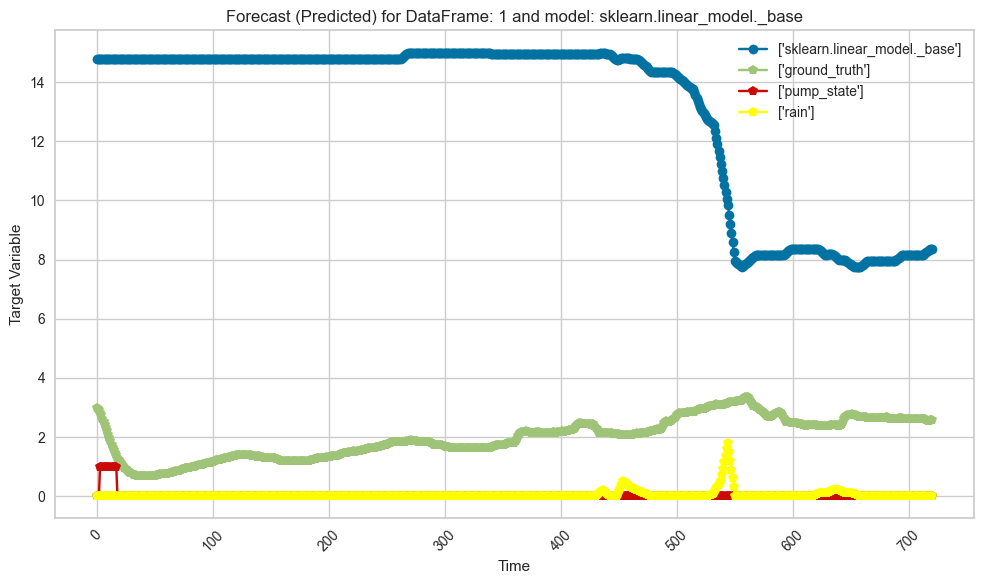

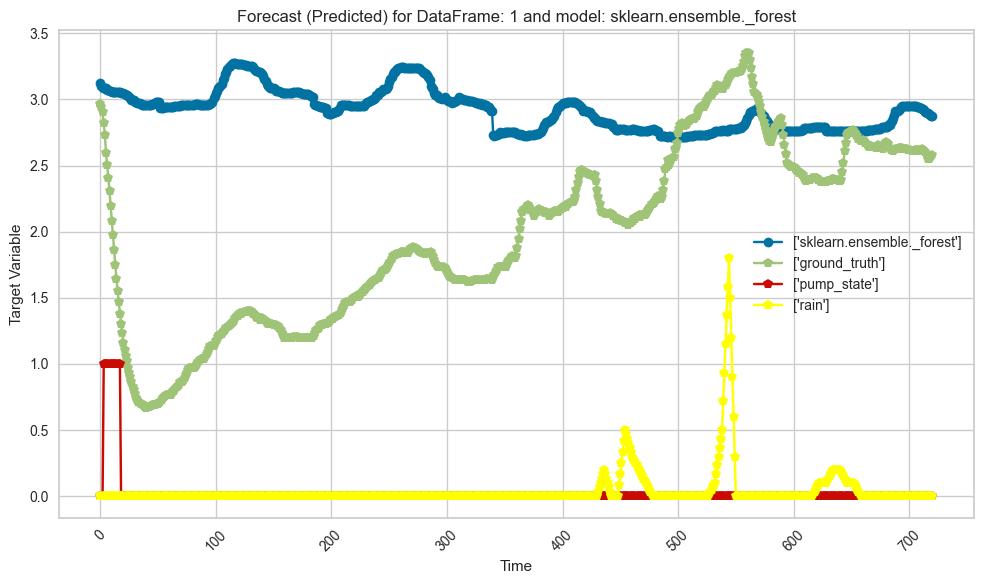

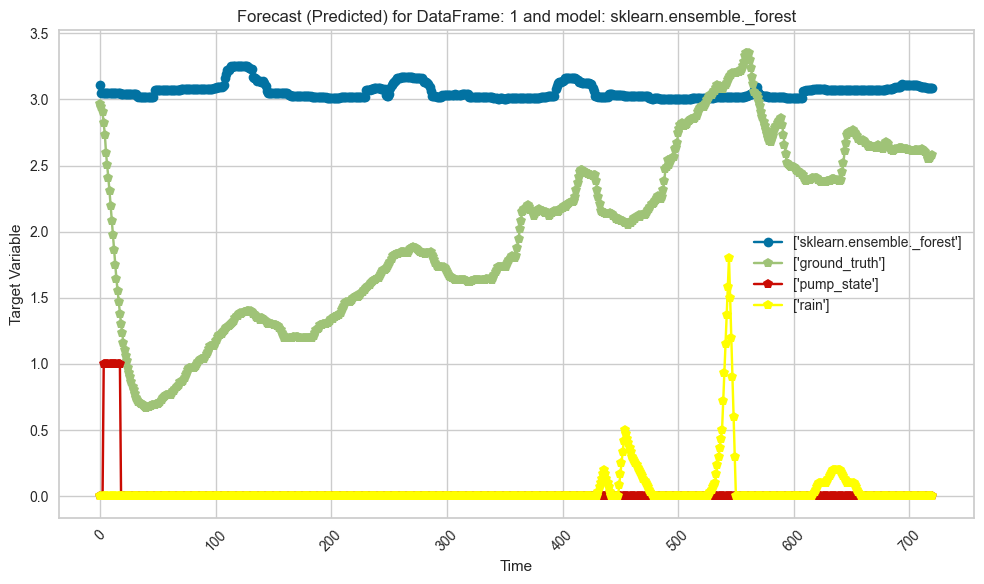

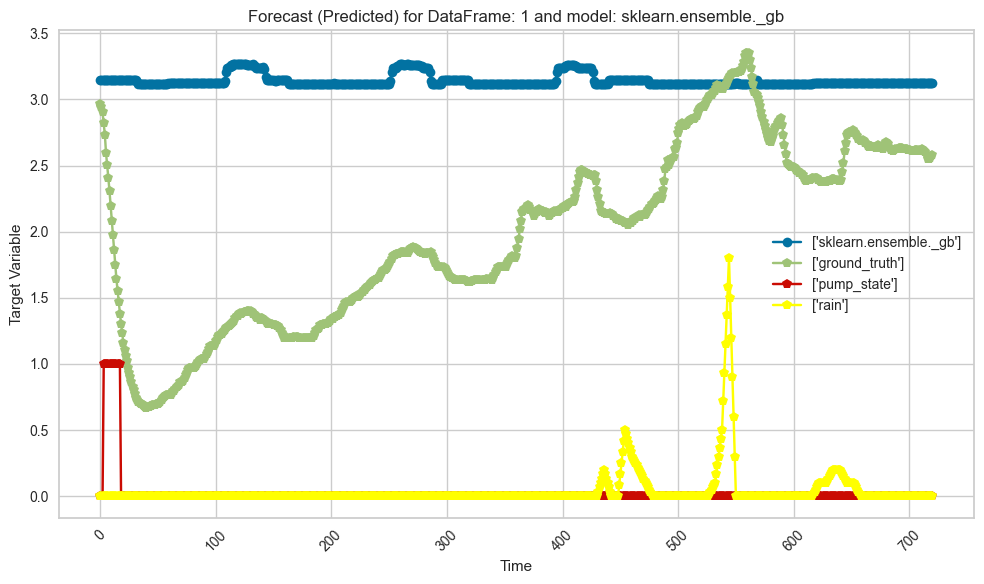

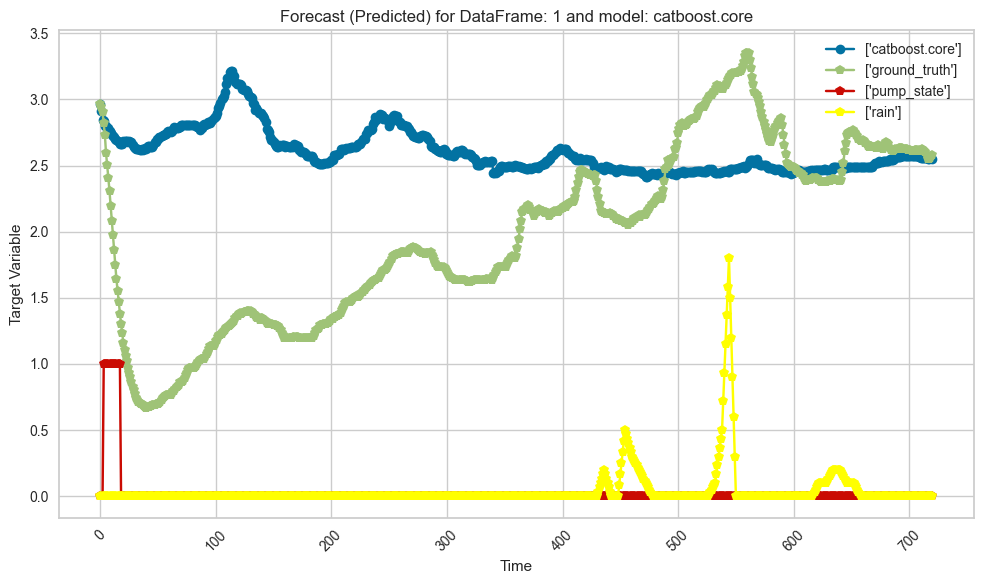

...

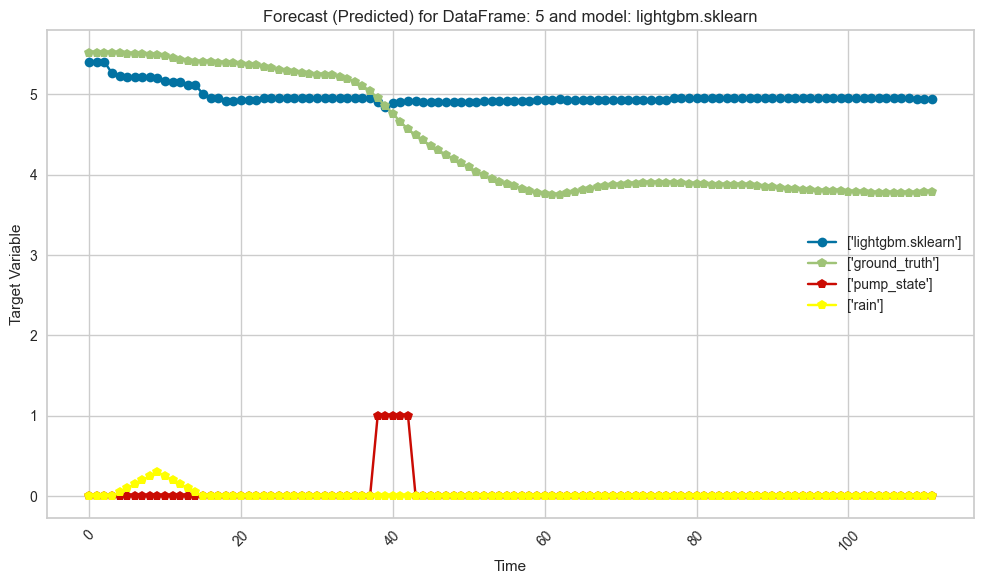

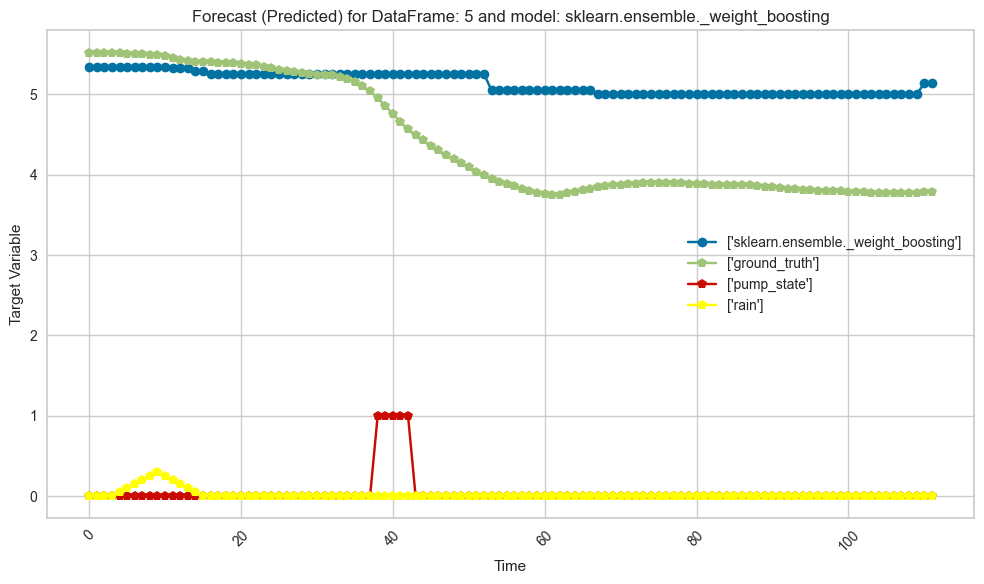

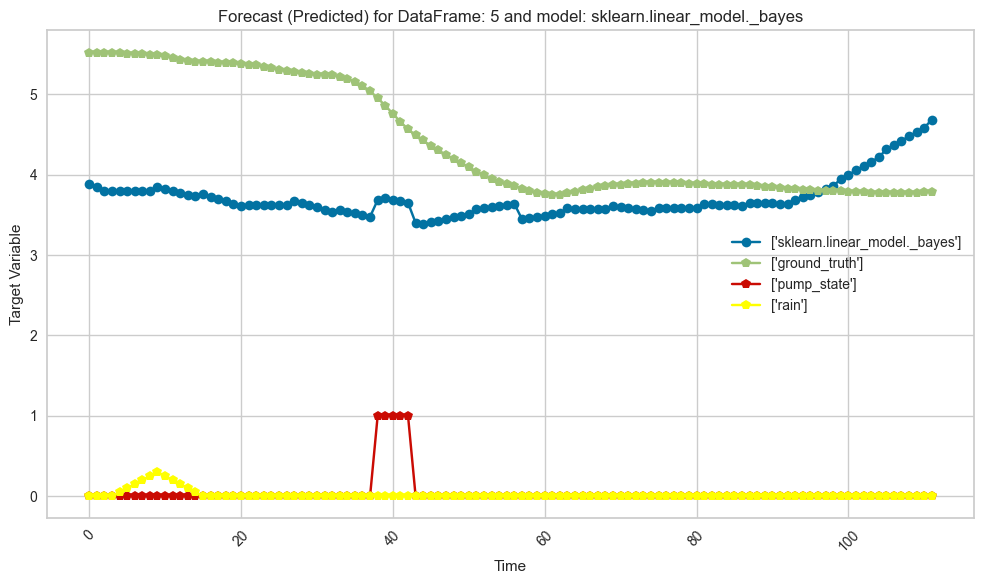

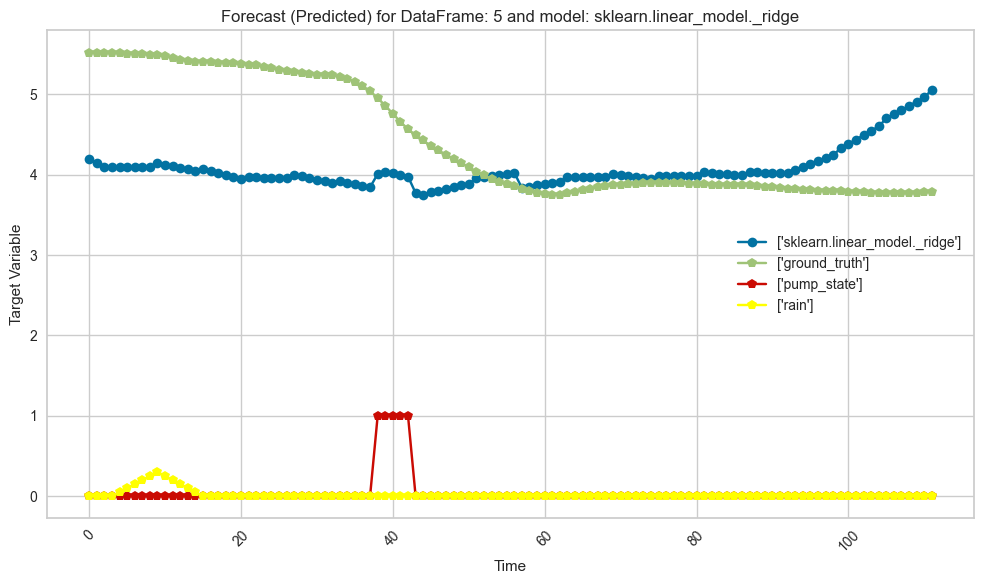

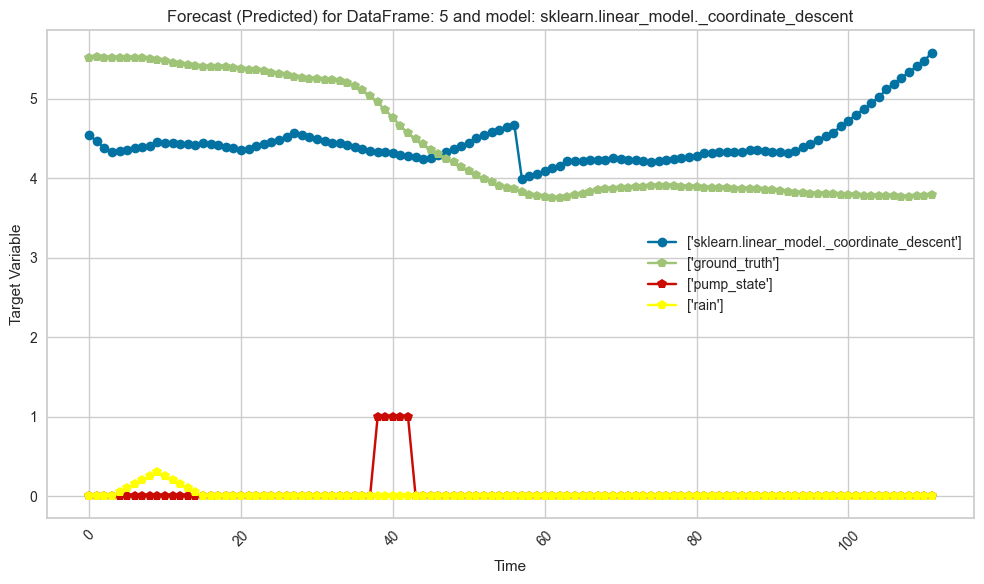

In [116]:
# the affiliation to range in data is wrong
for i in range(len(best)):
    for j in range(len(best[i])):
        plt.figure(figsize=(10, 6))
        plt.plot(all_predictions[i][j].index, all_predictions[i][j]['prediction_label'], label=[best[i][j].__module__], marker='o')
        plt.plot(all_predictions[i][j].index, data['rolling_mean_grouped_soil'].loc[all_predictions[i][j]['Timestamp'][0]:all_predictions[i][j]['Timestamp'].iloc[-1]], label=['ground_truth'], marker='p')
        plt.plot(all_predictions[i][j].index, data['pump_state'].loc[all_predictions[i][j]['Timestamp'][0]:all_predictions[i][j]['Timestamp'].iloc[-1]], label=['pump_state'], marker='p')
        plt.plot(all_predictions[i][j].index, data['Rain'].loc[all_predictions[i][j]['Timestamp'][0]:all_predictions[i][j]['Timestamp'].iloc[-1]], label=['rain'], marker='p', color='yellow')
        plt.xlabel('Time')
        plt.ylabel('Target Variable')
        plt.title('Forecast (Predicted) for DataFrame: '+ str(i+1) + ' and model: ' + best[i][j].__module__)
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

In [117]:
data['rolling_mean_grouped_soil'].loc[all_predictions[i][j]['Timestamp'][0]:all_predictions[i][j]['Timestamp'].iloc[-1]].head()

Timestamp
2023-05-01 14:30:00    5.513732
2023-05-01 14:40:00    5.519997
2023-05-01 14:50:00    5.513337
2023-05-01 15:00:00    5.513199
2023-05-01 15:10:00    5.513199
Name: rolling_mean_grouped_soil, dtype: float64

In [118]:
all_predictions[i][j]['prediction_label']

0      4.544919
1      4.462681
2      4.380444
3      4.327788
4      4.344123
         ...   
107    5.262232
108    5.334333
109    5.406434
110    5.478535
111    5.580218
Name: prediction_label, Length: 112, dtype: float32

In [119]:
data_with_num_index = data['rolling_mean_grouped_soil'].loc[all_predictions[0][0]['Timestamp'][0]:all_predictions[0][0]['Timestamp'].iloc[-1]].reset_index(drop=True)
print(data_with_num_index.head())

0    2.966408
1    2.943572
2    2.902407
3    2.820118
4    2.730684
Name: rolling_mean_grouped_soil, dtype: float64


In [120]:
# evaluate performance of prediction against test part of data
def evaluate_target_variable(series1, series2, model_name):
    # drop missing
    values1 = series1.dropna()
    values2 = series2.dropna()

    # calc max length
    min_length = min(len(values1), len(values2))
    values1 = values1[:min_length]
    values2 = values2[:min_length]

    # test print
    #print(values1)
    #print(values2)
    
    # MAE, RMSE, MPE
    diff = np.abs(values1.values - values2.values)
    mae = np.mean(diff)
    rmse = np.sqrt(np.mean(diff ** 2))
    mpe = np.mean(diff / values1.values) * 100

    # R2
    mean_series1 = np.mean(series1)
    ss_total = np.sum((series1 - mean_series1) ** 2)
    ss_residual = np.sum((series1 - series2) ** 2)
    r2_score = 1 - (ss_residual / ss_total)

    # print metrics
    print(f"MAE: {mae:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"MPE: {mpe:.2f} %")
    print(f"R2 {r2_score:.2f}",'\n')
    #print("df1 len:",len(values1),"df2 len:",len(values2),'\n')

    metrics = { model_name : ['mae', 'rmse', 'mpe', 'r2'],
                'results'  : [f'{mae:.2f}', f'{rmse:.2f}', f'{mpe:.2f}', f'{r2_score:.2f}']
              }
    results = pd.DataFrame(metrics)
    results['results'] = results['results'].astype(float)

    return results

results = []

for i in range(len(best)):
    results_for_dataframe = []
    print("This is for DataFrame nr:",i+1,"\n") 
    for j in range(len(best[i])):
        model_name = best[i][j].__module__
        print("DataFrame:", i+1, " Model:", model_name)
        results_for_dataframe.append(
            evaluate_target_variable(
                data['rolling_mean_grouped_soil'].loc[all_predictions[i][j]['Timestamp'][0]:all_predictions[i][j]['Timestamp'].iloc[-1]].reset_index(drop=True), 
                all_predictions[i][j]['prediction_label'],
                model_name
            )
        )
    results.append(results_for_dataframe)

This is for DataFrame nr: 1 

DataFrame: 1  Model: sklearn.linear_model._base
MAE: 11.10
RMSE: 11.60
MPE: 707.87 %
R2 -294.83 

DataFrame: 1  Model: sklearn.ensemble._forest
MAE: 1.00
RMSE: 1.22
MPE: 75.38 %
R2 -2.27 

DataFrame: 1  Model: sklearn.ensemble._forest
MAE: 1.10
RMSE: 1.28
MPE: 80.78 %
R2 -2.62 

DataFrame: 1  Model: sklearn.ensemble._gb
MAE: 1.18
RMSE: 1.35
MPE: 85.33 %
R2 -3.03 

DataFrame: 1  Model: catboost.core
MAE: 0.79
RMSE: 1.00
MPE: 61.03 %
R2 -1.22 

DataFrame: 1  Model: sklearn.tree._classes
MAE: 1.31
RMSE: 1.48
MPE: 93.65 %
R2 -3.79 

DataFrame: 1  Model: lightgbm.sklearn
MAE: 1.12
RMSE: 1.30
MPE: 81.90 %
R2 -2.72 

DataFrame: 1  Model: xgboost.sklearn
MAE: 1.22
RMSE: 1.39
MPE: 88.26 %
R2 -3.28 

DataFrame: 1  Model: sklearn.ensemble._weight_boosting
MAE: 1.09
RMSE: 1.27
MPE: 79.99 %
R2 -2.56 

DataFrame: 1  Model: sklearn.linear_model._bayes
MAE: 3.99
RMSE: 4.25
MPE: 210.89 %
R2 -38.72 

DataFrame: 1  Model: sklearn.linear_model._ridge
MAE: 3.77
RMSE: 4.05
MPE:

In [121]:
def evaluate_results_and_choose_best(results_for_one_df, best_for_one_df):
    max_r2_value = max((df['results'][3].max(), idx) for idx, df in enumerate(results_for_one_df))
    
    max_value = max_r2_value[0]
    max_index = max_r2_value[1]

    best_model_for_df = best_for_one_df[max_index]
    
    print("The best model is:", best_model_for_df.__module__)
    print("Maximum R2 Value:", max_value)
    print('This is the rest of the metrics: mae', results_for_one_df[max_index]['results'][0],  'rmse', results_for_one_df[max_index]['results'][1], 'mpe', results_for_one_df[max_index]['results'][2])
    print("Index of Maximum R2 Value:", max_index,"\n")

    return best_model_for_df



# save the best models for every dataframe to that array
best_eval = []
# iterate
for i in range(len(results)):
    print("This is for Dataframe:",i+1)
    best_eval.append(evaluate_results_and_choose_best(results[i], best[i]))

This is for Dataframe: 1
The best model is: sklearn.neighbors._regression
Maximum R2 Value: -0.75
This is the rest of the metrics: mae 0.7 rmse 0.89 mpe 50.75
Index of Maximum R2 Value: 11 

This is for Dataframe: 2
The best model is: sklearn.linear_model._coordinate_descent
Maximum R2 Value: -1.76
This is the rest of the metrics: mae 1.83 rmse 2.02 mpe 95.78
Index of Maximum R2 Value: 11 

This is for Dataframe: 3
The best model is: catboost.core
Maximum R2 Value: 0.15
This is the rest of the metrics: mae 0.32 rmse 0.38 mpe 8.04
Index of Maximum R2 Value: 6 

This is for Dataframe: 4
The best model is: sklearn.neighbors._regression
Maximum R2 Value: -1.57
This is the rest of the metrics: mae 0.82 rmse 0.98 mpe 26.32
Index of Maximum R2 Value: 11 

This is for Dataframe: 5
The best model is: catboost.core
Maximum R2 Value: 0.18
This is the rest of the metrics: mae 0.58 rmse 0.64 mpe 14.11
Index of Maximum R2 Value: 6 



In [122]:
type(results[0][0]['results'][3])

numpy.float64

### Notes:
Catboost seems to be the most promising, use it..

With normalization the metrics are better, but the curve is not represented in a articulated way.

## Predicton
In the following an estimation is calculated, when the soil_tension threshold is meet.

In [ ]:
was_reached = False
last_df = holdout_pred[len(holdout_pred)-1]
last_df_len = len(last_df) # same as forecast horizon

# calculate 
for i in range(last_df_len):
    if last_df['y_pred'][i] > tension_threshold:
        print("Threshold will be reached on", last_df.index[i], "With a value of:", last_df['y_pred'][i])
        was_reached = True
        break
    if was_reached == False and last_df_len-1 == i:
        print("Threshold is not expected to reached in the coming 5 days!")
        break

In [ ]:
# plot acf
# for certain plots you don't need a trained model
exp.plot_model(plot = 'acf')

In [ ]:
# plot diagnostics
# for certain plots you don't need a trained model
exp.plot_model(plot = 'diagnostics')

Some other parameters that you might find very useful in `plot_model` are:

- fig_kwargs
- data_kwargs
- display_format
- return_fig
- return_data
- save

You can check the docstring of the function for more info.

In [ ]:
# help(plot_model)

## ✅ Finalize Model
This function trains a given model on the entire dataset including the hold-out set.

In [ ]:
final_best = finalize_model(best) #TODO: for loop

In [ ]:
final_best

## ✅ Deploy Model
This function deploys the entire ML pipeline on the cloud.

**AWS:**  When deploying model on AWS S3, environment variables must be configured using the command-line interface. To configure AWS environment variables, type `aws configure` in terminal. The following information is required which can be generated using the Identity and Access Management (IAM) portal of your amazon console account:

- AWS Access Key ID
- AWS Secret Key Access
- Default Region Name (can be seen under Global settings on your AWS console)
- Default output format (must be left blank)

**GCP:** To deploy a model on Google Cloud Platform ('gcp'), the project must be created using the command-line or GCP console. Once the project is created, you must create a service account and download the service account key as a JSON file to set environment variables in your local environment. Learn more about it: https://cloud.google.com/docs/authentication/production

**Azure:** To deploy a model on Microsoft Azure ('azure'), environment variables for the connection string must be set in your local environment. Go to settings of storage account on Azure portal to access the connection string required.
AZURE_STORAGE_CONNECTION_STRING (required as environment variable)
Learn more about it: https://docs.microsoft.com/en-us/azure/storage/blobs/storage-quickstart-blobs-python?toc=%2Fpython%2Fazure%2FTOC.json

In [ ]:
# deploy model on aws s3
# deploy_model(best, model_name = 'my_first_platform_on_aws',
#             platform = 'aws', authentication = {'bucket' : 'pycaret-test'})

In [ ]:
# load model from aws s3
# loaded_from_aws = load_model(model_name = 'my_first_platform_on_aws', platform = 'aws',
#                              authentication = {'bucket' : 'pycaret-test'})

# loaded_from_aws

## ✅ Save / Load Model
This function saves the transformation pipeline and a trained model object into the current working directory as a pickle file for later use.

In [ ]:
# save model
for i in range(len(best_models)):
    save_model(best_models[i], 'my_first_SPLIT_model' + str(i))

In [ ]:
# load model
for i in range(len(best_models)): # will not work need to know how many models->use os TODO
    loaded_from_disk = load_model('my_first_SPILT_model'+str(i))
    loaded_from_disk

## ✅ Save / Load Experiment
This function saves all the experiment variables on disk, allowing to later resume without rerunning the setup function.

In [ ]:
# save experiment
save_experiment('my_SPLIT_experiment')

In [ ]:
# load experiment from disk
exp_from_disk = load_experiment('my_SPLIT_experiment', data=data)